# Import Packages

In [2]:
# We temporarily disable warnings for demonstration.
# FutureWarnings and DeprecationWarnings are present from some of the AMPL 
# dependency modules.
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
# manipulate data
import pandas as pd
import json
import requests
import io
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib_venn as mpv
from scipy.stats import pearsonr
import numpy as np
import getpass, os
from matplotlib_venn import venn2

# set up visualization parameters
sns.set_context("paper")
sns.set_style("whitegrid")
sns.set_palette("Set2")
pal = sns.color_palette()
plt.rcParams['figure.figsize'] = [10,10]

pd.set_option('display.max_columns',(90))
pd.set_option('display.max_rows',(20))

In [3]:
# Import AMPL libraries
import atomsci.ddm.utils.data_curation_functions as dcf
import atomsci.ddm.utils.curate_data as curate_data
import atomsci.ddm.pipeline.diversity_plots as dp
import atomsci.ddm.pipeline.chem_diversity as cd
import atomsci.ddm.pipeline.model_pipeline as mp
import atomsci.ddm.pipeline.parameter_parser as parse
import atomsci.ddm.utils.struct_utils as struct_utils
from atomsci.ddm.pipeline import perf_plots as pp

Skipped loading modules with pytorch-geometric dependency, missing a dependency. No module named 'torch_geometric'
Skipped loading modules with pytorch-geometric dependency, missing a dependency. cannot import name 'DMPNN' from 'deepchem.models.torch_models' (/home/jupyter/atomsci/lib/python3.8/site-packages/deepchem/models/torch_models/__init__.py)
Skipped loading modules with pytorch-lightning dependency, missing a dependency. No module named 'pytorch_lightning'
Skipped loading some Jax models, missing a dependency. jax requires jaxlib to be installed. See https://github.com/google/jax#installation for installation instructions.


In [4]:
! pip install rdkit-pypi
! pip install --pre deepchem

import deepchem
# print(deepchem.__version__)
! pip install umap
! pip install llvmlite==0.35.0  --ignore-installed
! pip install umap-learn
! pip install molvs
! pip install bravado

  Using cached llvmlite-0.35.0.tar.gz (121 kB)
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [26 lines of output]
      running bdist_wheel
      /opt/conda/bin/python3.10 /var/tmp/pip-install-zo554dul/llvmlite_4cc9f386692d4625a5c49feca1dbf944/ffi/build.py
      LLVM version... Traceback (most recent call last):
        File "/var/tmp/pip-install-zo554dul/llvmlite_4cc9f386692d4625a5c49feca1dbf944/ffi/build.py", line 105, in main_posix
          out = subprocess.check_output([llvm_config, '--version'])
        File "/opt/conda/lib/python3.10/subprocess.py", line 421, in check_output
          return run(*popenargs, stdout=PIPE, timeout=timeout, check=True,
        File "/opt/conda/lib/python3.10/subprocess.py", line 503, in run
          with Popen(*popenargs, **kwargs) as process:
        File "/opt/conda/lib/python3.10/subprocess.py", line 971, in __init__
          sel

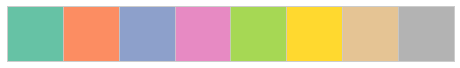

In [6]:
sns.palplot(pal)

# Load Data

In [7]:
import os
print(os.getcwd())

/home/jupyter


In [26]:
data = pd.read_csv('columbia_select_qmugs_data_curated.csv', header = 0)

In [57]:
data.head()

,chembl_id,smiles,mw,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,rdkit_smiles,inchi_key,compound_id,VALUE_NUM_mean,VALUE_NUM_std,Perc_Var,Remove_BadDuplicate,amides,carboxy,sulfonyl,sulfonamide,alcohol,acrylate,aldehyde,methoxyalcohol,hydroxyacetamide,acrylamide,carbamate,oxyirane,allamide,amide_NH2
0,CHEMBL1,[H]c1c([H])c2c(c([H])c1OC([H])([H])[H])OC([H])...,544.209718,0.044924,0.242930,COc1ccc2c(c1)OC[C@H]1[C@@H]2C2=C(OC1(C)C)C1=C(...,GHBOEFUAGSHXPO-XZOTUCIWSA-N,GHBOEFUAGSHXPO-XZOTUCIWSA-N,0.242102,0.000833,0.341925,0,0,0,0,0,2,0,3,0,0,0,0,0,0,0
1,CHEMBL1000,[H]OC(=O)C([H])([H])OC([H])([H])C([H])([H])N1C...,388.155370,0.115170,0.340824,O=C(O)COCCN1CCN([C@@H](c2ccccc2)c2ccc(Cl)cc2)CC1,ZKLPARSLTMPFCP-NRFANRHFSA-N,ZKLPARSLTMPFCP-NRFANRHFSA-N,0.333456,0.006397,2.209649,0,0,4,0,0,2,0,3,0,0,0,0,0,0,0
2,CHEMBL10000,[H]c1c([H])c(N([H])c2nc3c([H])c([H])c([H])c([H...,363.970876,0.106596,0.293095,O=c1oc(Nc2ccc(I)cc2)nc2ccccc12,KXLZEFPIBPQEAU-UHFFFAOYSA-N,KXLZEFPIBPQEAU-UHFFFAOYSA-N,0.289124,0.003439,1.373521,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,CHEMBL100003,[H]O/C(OC([H])([H])[H])=C1\C(C([H])([H])[H])=N...,281.162708,0.080096,0.275410,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,FCFUFMMLEUYHMD-CDZMIXDFSA-N,FCFUFMMLEUYHMD-CDZMIXDFSA-N,0.282891,0.007237,2.644696,0,0,4,0,0,2,5,3,3,0,0,0,0,0,0
4,CHEMBL100004,[H]O/C(OC([H])([H])C([H])([H])[H])=C1\C(C([H])...,375.150429,0.069851,0.272307,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,CUHAMGYOMBKPLA-BQOWYSNXSA-N,CUHAMGYOMBKPLA-BQOWYSNXSA-N,0.272592,0.003115,0.104604,0,0,4,0,0,2,5,3,3,0,0,0,0,0,0


# Searching for functional groups

In [61]:
from rdkit import Chem
from rdkit.Chem import Draw, Descriptors, rdqueries
from rdkit.Chem import rdchem

## append searching results

In [62]:
# define functional groups
fg = Chem.MolFromSmarts('C(=O)[NX3;H2]')
famide = Chem.MolFromSmarts('CC(N)=O')
fcarbox = Chem.MolFromSmarts('CC(O)=O')
fsulfonyl = Chem.MolFromSmarts('CS(=O)(C)=O')
fsulfonamide = Chem.MolFromSmarts('NS(C)(=O)=O')
falc = Chem.MolFromSmarts('OC')
facrylate = Chem.MolFromSmarts('O=C([O])C=C')
faldehyde = Chem.MolFromSmarts('CC=O')
fmethoxyalcohol = Chem.MolFromSmarts('OC[O]')
fhydroxyacetamide = Chem.MolFromSmarts('O=C[N]O')
facrylamide = Chem.MolFromSmarts('O=C([N])C=C')
fcarbamate = Chem.MolFromSmarts('O=C([O])[N]')
foxyirane = Chem.MolFromSmarts('O1CC1')
f_allamide = Chem.MolFromSmarts('NC=O')

In [63]:
# Search rdkit_smiles from curated data to find molecules that the functional groups are located in.
data["amides"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(famide)) for smile in data["rdkit_smiles"]]
data["carboxy"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(fcarbox)) for smile in data["rdkit_smiles"]]
data["sulfonyl"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(fsulfonyl)) for smile in data["rdkit_smiles"]]
data["sulfonamide"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(fsulfonamide)) for smile in data["rdkit_smiles"]]
data["alcohol"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(falc)) for smile in data["rdkit_smiles"]]
data["acrylate"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(facrylate)) for smile in data["rdkit_smiles"]]
data["aldehyde"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(faldehyde)) for smile in data["rdkit_smiles"]]
data["methoxyalcohol"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(fmethoxyalcohol)) for smile in data["rdkit_smiles"]]
data["hydroxyacetamide"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(fhydroxyacetamide)) for smile in data["rdkit_smiles"]]
data["acrylamide"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(facrylamide)) for smile in data["rdkit_smiles"]]
data["carbamate"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(fcarbamate)) for smile in data["rdkit_smiles"]]
data["oxyirane"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(foxyirane)) for smile in data["rdkit_smiles"]]
data["allamide"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(f_allamide)) for smile in data["rdkit_smiles"]]
data["amide_NH2"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(fg)) for smile in data["rdkit_smiles"]]

In [ ]:
data["HA_count"] = [len(Chem.MolFromSmiles(smile).GetSubstructMatch(fg)) for smile in data["rdkit_smiles"]]

In [65]:
data.head()

,chembl_id,smiles,mw,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,rdkit_smiles,inchi_key,compound_id,VALUE_NUM_mean,VALUE_NUM_std,Perc_Var,Remove_BadDuplicate,amides,carboxy,sulfonyl,sulfonamide,alcohol,acrylate,aldehyde,methoxyalcohol,hydroxyacetamide,acrylamide,carbamate,oxyirane,allamide,amide_NH2,HA_count
0,CHEMBL1,[H]c1c([H])c2c(c([H])c1OC([H])([H])[H])OC([H])...,544.209718,0.044924,0.242930,COc1ccc2c(c1)OC[C@H]1[C@@H]2C2=C(OC1(C)C)C1=C(...,GHBOEFUAGSHXPO-XZOTUCIWSA-N,GHBOEFUAGSHXPO-XZOTUCIWSA-N,0.242102,0.000833,0.341925,0,0,0,0,0,2,0,3,0,0,0,0,0,0,0,0
1,CHEMBL1000,[H]OC(=O)C([H])([H])OC([H])([H])C([H])([H])N1C...,388.155370,0.115170,0.340824,O=C(O)COCCN1CCN([C@@H](c2ccccc2)c2ccc(Cl)cc2)CC1,ZKLPARSLTMPFCP-NRFANRHFSA-N,ZKLPARSLTMPFCP-NRFANRHFSA-N,0.333456,0.006397,2.209649,0,0,4,0,0,2,0,3,0,0,0,0,0,0,0,0
2,CHEMBL10000,[H]c1c([H])c(N([H])c2nc3c([H])c([H])c([H])c([H...,363.970876,0.106596,0.293095,O=c1oc(Nc2ccc(I)cc2)nc2ccccc12,KXLZEFPIBPQEAU-UHFFFAOYSA-N,KXLZEFPIBPQEAU-UHFFFAOYSA-N,0.289124,0.003439,1.373521,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,CHEMBL100003,[H]O/C(OC([H])([H])[H])=C1\C(C([H])([H])[H])=N...,281.162708,0.080096,0.275410,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,FCFUFMMLEUYHMD-CDZMIXDFSA-N,FCFUFMMLEUYHMD-CDZMIXDFSA-N,0.282891,0.007237,2.644696,0,0,4,0,0,2,5,3,3,0,0,0,0,0,0,0
4,CHEMBL100004,[H]O/C(OC([H])([H])C([H])([H])[H])=C1\C(C([H])...,375.150429,0.069851,0.272307,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,CUHAMGYOMBKPLA-BQOWYSNXSA-N,CUHAMGYOMBKPLA-BQOWYSNXSA-N,0.272592,0.003115,0.104604,0,0,4,0,0,2,5,3,3,0,0,0,0,0,0,0


In [66]:
data.to_csv("new_columbia_curated.csv", index = False)

In [67]:
# show the number of functional group in the compound
m = Chem.MolFromSmiles('O=C(O)COCCN1CCN([C@@H](c2ccccc2)c2ccc(Cl)cc2)CC1')
fcarbox = Chem.MolFromSmarts('CC(O)=O')
print('Functional group:', len(m.GetSubstructMatches(fcarbox)), 'carboxy')

Functional group: 1 carboxy


## overview of numbers of compounds that contains certain functional group

After we verified that the searching method works, then we could look at how many compounds that contains certain functional groups. If there are over 1000 compounds that has this functional group, we would filter them out and store them for future tests.

In addition, we would plot the gap values with rings and HA_count and look for overlap regions.

In [78]:
flist = ["amides","carboxy","sulfonyl", "sulfonamide", "alcohol","acrylate","aldehyde","methoxyalcohol","hydroxyacetamide","acrylamide","carbamate","oxyirane","allamide","amide_NH2"]

for i in flist:
    print(data[i].value_counts())
    print("---------------------------")

0    302437
4    135277
Name: amides, dtype: int64
---------------------------
0    383890
4     53824
Name: carboxy, dtype: int64
---------------------------
0    434683
5      3031
Name: sulfonyl, dtype: int64
---------------------------
0    427723
5      9991
Name: sulfonamide, dtype: int64
---------------------------
2    255557
0    182157
Name: alcohol, dtype: int64
---------------------------
0    430954
5      6760
Name: acrylate, dtype: int64
---------------------------
0    250570
3    187144
Name: aldehyde, dtype: int64
---------------------------
0    427857
3      9857
Name: methoxyalcohol, dtype: int64
---------------------------
0    429508
4      8206
Name: hydroxyacetamide, dtype: int64
---------------------------
0    422923
5     14791
Name: acrylamide, dtype: int64
---------------------------
0    420982
4     16732
Name: carbamate, dtype: int64
---------------------------
0    437195
3       519
Name: oxyirane, dtype: int64
---------------------------
3    239469


Then, we would exclude functional group: oxyirane for now.

## amide

In [79]:
amide_df = data[["chembl_id","compound_id","rdkit_smiles","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","amides","HA_count"]]

In [80]:
amide_df = amide_df[amide_df['amides'] != 0]

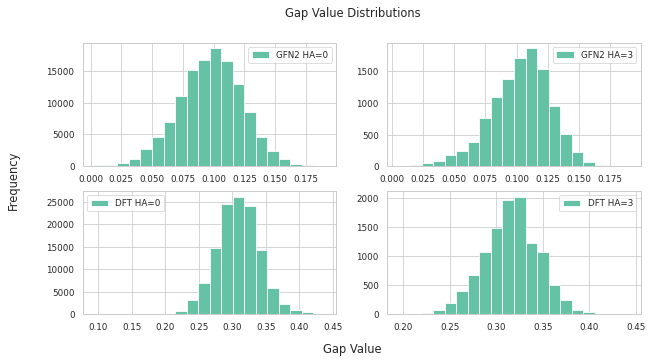

In [81]:
pivot1 = amide_df.pivot_table(index='compound_id', columns='HA_count', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
pivot2 = amide_df.pivot_table(index='compound_id', columns='HA_count', values='DFT_HOMO_LUMO_GAP', aggfunc='mean')

# Add a multi-index to columns to differentiate between GFN2 and DFT values
pivot1.columns = pd.MultiIndex.from_product([['GFN2'], pivot1.columns])
pivot2.columns = pd.MultiIndex.from_product([['DFT'], pivot2.columns])

# Concatenate the pivot tables with multi-indexing
combined_pivot = pd.concat([pivot1, pivot2], axis=1)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Plot histograms and assign labels
for i, (level0, level1) in enumerate(combined_pivot.columns):
    axes[i].hist(combined_pivot[(level0, level1)], bins=20, label=f"{level0} HA={level1}")
    axes[i].legend()  # This adds the legend to each subplot

# Add overall figure titles and labels
fig.suptitle("Gap Value Distributions")
fig.supxlabel("Gap Value")
fig.supylabel("Frequency")

# Display the plot
plt.show()

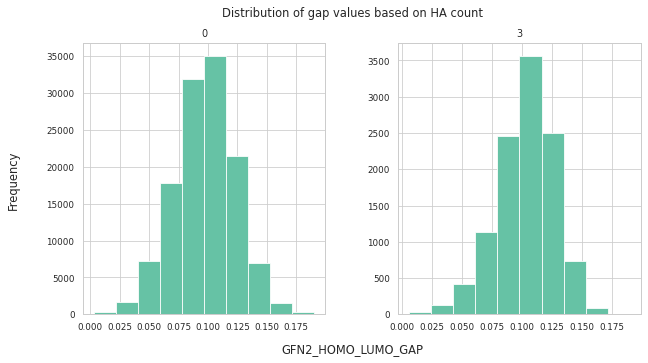

In [82]:
data_type_gfn2 = amide_df.pivot_table(index='compound_id', columns='HA_count', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
axes = data_type_gfn2.hist(figsize=(10, 5))

plt.gcf().suptitle("Distribution of gap values based on HA count") 
plt.gcf().supxlabel("GFN2_HOMO_LUMO_GAP")
plt.gcf().supylabel("Frequency")

plt.show()

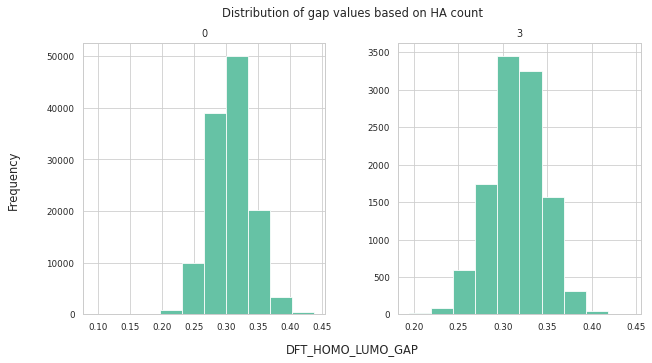

In [83]:
data_type_dft = amide_df.pivot_table(index = 'compound_id', columns = 'HA_count', values='DFT_HOMO_LUMO_GAP', aggfunc='mean')
axes = data_type_dft.hist(figsize=(10, 5))

plt.gcf().suptitle("Distribution of gap values based on HA count") 
plt.gcf().supxlabel("DFT_HOMO_LUMO_GAP")
plt.gcf().supylabel("Frequency")
plt.show()

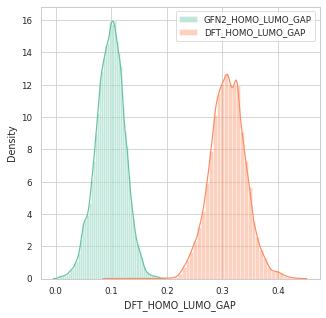

In [84]:
fig, ax = plt.subplots(figsize = (5,5))
sns.distplot(amide_df.GFN2_HOMO_LUMO_GAP, ax=ax, label='GFN2_HOMO_LUMO_GAP')
sns.distplot(amide_df.DFT_HOMO_LUMO_GAP, ax=ax, label='DFT_HOMO_LUMO_GAP')
ax.legend()
plt.show()

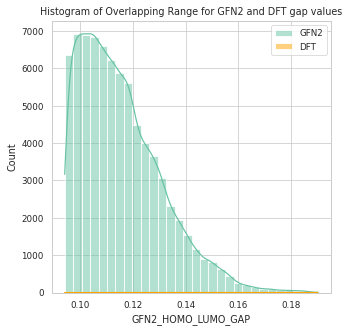

In [85]:
# Determine the minimum and maximum values of the overlap range
overlap_min = max(amide_df['GFN2_HOMO_LUMO_GAP'].min(), amide_df['DFT_HOMO_LUMO_GAP'].min())
overlap_max = min(amide_df['GFN2_HOMO_LUMO_GAP'].max(), amide_df['DFT_HOMO_LUMO_GAP'].max())

plt.figure(figsize=(5, 5))

# Plot the histograms for gfn2 and dft values within the overlap range
sns.histplot(amide_df[(amide_df['GFN2_HOMO_LUMO_GAP'] >= overlap_min) & (amide_df['GFN2_HOMO_LUMO_GAP'] <= overlap_max)]['GFN2_HOMO_LUMO_GAP'], 
             kde=True, bins=30, label='GFN2', alpha=0.5)

sns.histplot(amide_df[(amide_df['DFT_HOMO_LUMO_GAP'] >= overlap_min) & (amide_df['DFT_HOMO_LUMO_GAP'] <= overlap_max)]['DFT_HOMO_LUMO_GAP'], 
             kde=True, bins=30, label='DFT',color="orange", alpha=0.5)

plt.title('Histogram of Overlapping Range for GFN2 and DFT gap values')
plt.legend()
plt.show()

set()


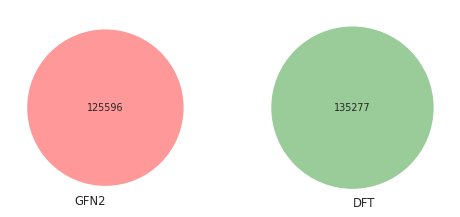

In [86]:
# Convert columns to sets
set_column1 = set(amide_df['GFN2_HOMO_LUMO_GAP'])
set_column2 = set(amide_df['DFT_HOMO_LUMO_GAP'])

# Find the intersection (overlap)
overlap = set_column1.intersection(set_column2)
print(overlap)

# visualize it
plt.figure(figsize=(8, 8))
venn2([set_column1, set_column2], ('GFN2', 'DFT'))

# Display the diagram
plt.show()

In [87]:
amide_df.to_csv("amide_df.csv", index = False)

## carboxy

In [88]:
carboxy_df = data[["chembl_id","compound_id","rdkit_smiles","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","carboxy","HA_count"]]
carboxy_df = carboxy_df[carboxy_df['carboxy'] != 0]

In [89]:
# check to see if number matches
carboxy_df["carboxy"].value_counts()

4    53824
Name: carboxy, dtype: int64

In [90]:
carboxy_df.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,carboxy,HA_count
1,CHEMBL1000,ZKLPARSLTMPFCP-NRFANRHFSA-N,O=C(O)COCCN1CCN([C@@H](c2ccccc2)c2ccc(Cl)cc2)CC1,0.115170,0.340824,4,0
3,CHEMBL100003,FCFUFMMLEUYHMD-CDZMIXDFSA-N,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,0.080096,0.275410,4,0
4,CHEMBL100004,CUHAMGYOMBKPLA-BQOWYSNXSA-N,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,0.069851,0.272307,4,0
5,CHEMBL100005,KXSQTEDQWJHEDB-SFHVURJKSA-N,COC(=O)[C@@H](Cc1ccc2c(c1)OCO2)c1c2ccccc2nc2cc...,0.068298,0.256438,4,0
6,CHEMBL100010,BXNXEXWOZMNHST-YPMHNXCESA-N,COC(=O)C1=C(c2ccccc2)C[C@@H]2CC[C@H]1C2,0.124809,0.336471,4,0


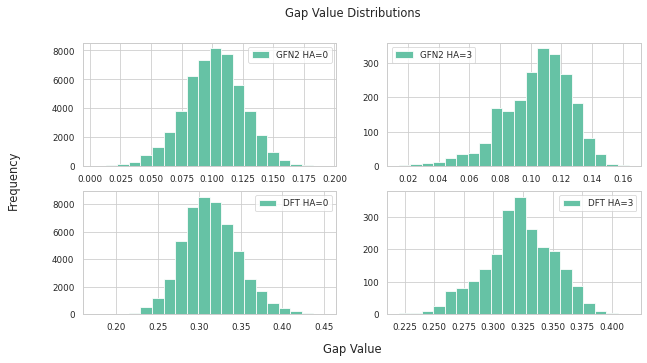

In [91]:
pivot1 = carboxy_df.pivot_table(index='compound_id', columns='HA_count', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
pivot2 = carboxy_df.pivot_table(index='compound_id', columns='HA_count', values='DFT_HOMO_LUMO_GAP', aggfunc='mean')

# Add a multi-index to columns to differentiate between GFN2 and DFT values
pivot1.columns = pd.MultiIndex.from_product([['GFN2'], pivot1.columns])
pivot2.columns = pd.MultiIndex.from_product([['DFT'], pivot2.columns])

# Concatenate the pivot tables with multi-indexing
combined_pivot = pd.concat([pivot1, pivot2], axis=1)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Plot histograms and assign labels
for i, (level0, level1) in enumerate(combined_pivot.columns):
    axes[i].hist(combined_pivot[(level0, level1)], bins=20, label=f"{level0} HA={level1}")
    axes[i].legend()  # This adds the legend to each subplot

# Add overall figure titles and labels
fig.suptitle("Gap Value Distributions")
fig.supxlabel("Gap Value")
fig.supylabel("Frequency")

# Display the plot
plt.show()

set()


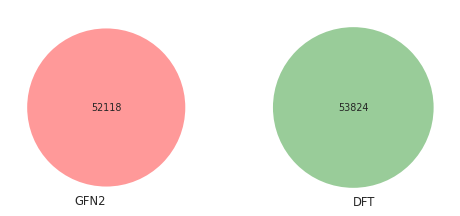

In [92]:
# Convert columns to sets
set_column1 = set(carboxy_df['GFN2_HOMO_LUMO_GAP'])
set_column2 = set(carboxy_df['DFT_HOMO_LUMO_GAP'])

# Find the intersection (overlap)
overlap = set_column1.intersection(set_column2)
print(overlap)

# visualize it
plt.figure(figsize=(8, 8))
venn2([set_column1, set_column2], ('GFN2', 'DFT'))

# Display the diagram
plt.show()

In [93]:
carboxy_df.to_csv("carboxy_df.csv", index = False)

## sulfonyl

In [94]:
sulfonyl_df = data[["chembl_id","compound_id","rdkit_smiles","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","sulfonyl","HA_count"]]
sulfonyl_df = sulfonyl_df[sulfonyl_df['sulfonyl'] != 0]

In [95]:
# check to see if number matches
sulfonyl_df["sulfonyl"].value_counts()

5    3031
Name: sulfonyl, dtype: int64

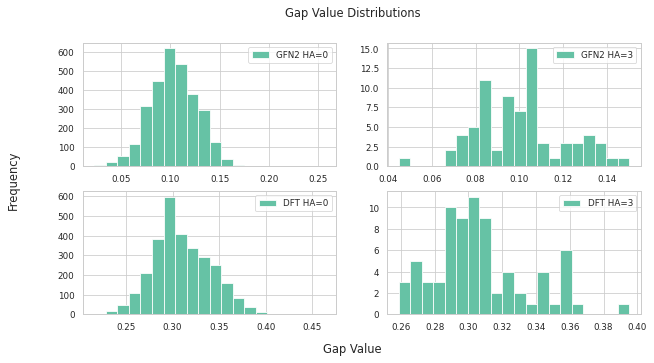

In [96]:
pivot1 = sulfonyl_df.pivot_table(index='compound_id', columns='HA_count', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
pivot2 = sulfonyl_df.pivot_table(index='compound_id', columns='HA_count', values='DFT_HOMO_LUMO_GAP', aggfunc='mean')

# Add a multi-index to columns to differentiate between GFN2 and DFT values
pivot1.columns = pd.MultiIndex.from_product([['GFN2'], pivot1.columns])
pivot2.columns = pd.MultiIndex.from_product([['DFT'], pivot2.columns])

# Concatenate the pivot tables with multi-indexing
combined_pivot = pd.concat([pivot1, pivot2], axis=1)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Plot histograms and assign labels
for i, (level0, level1) in enumerate(combined_pivot.columns):
    axes[i].hist(combined_pivot[(level0, level1)], bins=20, label=f"{level0} HA={level1}")
    axes[i].legend()  # This adds the legend to each subplot

# Add overall figure titles and labels
fig.suptitle("Gap Value Distributions")
fig.supxlabel("Gap Value")
fig.supylabel("Frequency")

# Display the plot
plt.show()

set()


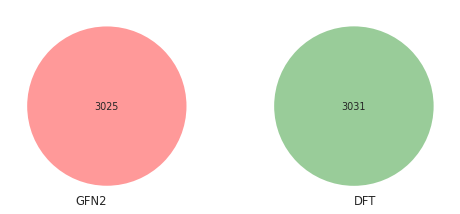

In [97]:
# Convert columns to sets
set_column1 = set(sulfonyl_df['GFN2_HOMO_LUMO_GAP'])
set_column2 = set(sulfonyl_df['DFT_HOMO_LUMO_GAP'])

# Find the intersection (overlap)
overlap = set_column1.intersection(set_column2)
print(overlap)

# visualize it
plt.figure(figsize=(8, 8))
venn2([set_column1, set_column2], ('GFN2', 'DFT'))

# Display the diagram
plt.show()

In [98]:
# save to csv
sulfonyl_df.to_csv("sulfonyl_df.csv", index = False)

## sulfonamide

In [99]:
sulfonamide_df = data[["inchi_key","rdkit_smiles","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","sulfonamide","HA_count"]]
sulfonamide_df = sulfonamide_df[sulfonamide_df['sulfonamide'] != 0]

In [100]:
sulfonamide_df["sulfonamide"].value_counts()

5    9991
Name: sulfonamide, dtype: int64

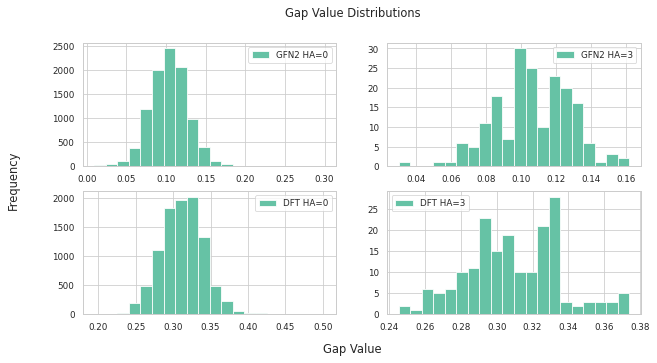

In [101]:
pivot1 = sulfonamide_df.pivot_table(index='inchi_key', columns='HA_count', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
pivot2 = sulfonamide_df.pivot_table(index='inchi_key', columns='HA_count', values='DFT_HOMO_LUMO_GAP', aggfunc='mean')

# Add a multi-index to columns to differentiate between GFN2 and DFT values
pivot1.columns = pd.MultiIndex.from_product([['GFN2'], pivot1.columns])
pivot2.columns = pd.MultiIndex.from_product([['DFT'], pivot2.columns])

# Concatenate the pivot tables with multi-indexing
combined_pivot = pd.concat([pivot1, pivot2], axis=1)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Plot histograms and assign labels
for i, (level0, level1) in enumerate(combined_pivot.columns):
    axes[i].hist(combined_pivot[(level0, level1)], bins=20, label=f"{level0} HA={level1}")
    axes[i].legend()  # This adds the legend to each subplot

# Add overall figure titles and labels
fig.suptitle("Gap Value Distributions")
fig.supxlabel("Gap Value")
fig.supylabel("Frequency")

# Display the plot

plt.show()

set()


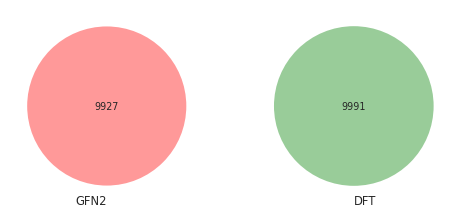

In [102]:
from matplotlib_venn import venn2
# Convert columns to sets
set_column1 = set(sulfonamide_df['GFN2_HOMO_LUMO_GAP'])
set_column2 = set(sulfonamide_df['DFT_HOMO_LUMO_GAP'])

# Find the intersection (overlap)
overlap = set_column1.intersection(set_column2)
print(overlap)

# visualize it
plt.figure(figsize=(8, 8))
venn2([set_column1, set_column2], ('GFN2', 'DFT'))

# Display the diagram
plt.show()

In [103]:
# save to csv
sulfonamide_df.to_csv("sulfonamide_df.csv", index = False)

## alcohol

In [104]:
alcohol_df = data[["inchi_key","rdkit_smiles","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","alcohol","HA_count"]]
alcohol_df = alcohol_df[alcohol_df['alcohol'] != 0]

In [105]:
alcohol_df["alcohol"].value_counts()

2    255557
Name: alcohol, dtype: int64

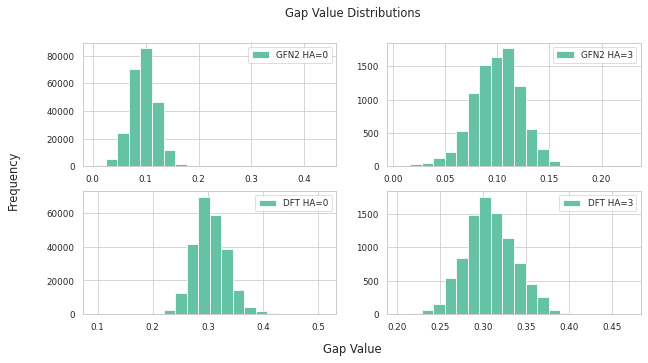

In [106]:
pivot1 = alcohol_df.pivot_table(index='inchi_key', columns='HA_count', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
pivot2 = alcohol_df.pivot_table(index='inchi_key', columns='HA_count', values='DFT_HOMO_LUMO_GAP', aggfunc='mean')

# Add a multi-index to columns to differentiate between GFN2 and DFT values
pivot1.columns = pd.MultiIndex.from_product([['GFN2'], pivot1.columns])
pivot2.columns = pd.MultiIndex.from_product([['DFT'], pivot2.columns])

# Concatenate the pivot tables with multi-indexing
combined_pivot = pd.concat([pivot1, pivot2], axis=1)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Plot histograms and assign labels
for i, (level0, level1) in enumerate(combined_pivot.columns):
    axes[i].hist(combined_pivot[(level0, level1)], bins=20, label=f"{level0} HA={level1}")
    axes[i].legend()  # This adds the legend to each subplot

# Add overall figure titles and labels
fig.suptitle("Gap Value Distributions")
fig.supxlabel("Gap Value")
fig.supylabel("Frequency")

# Display the plot

plt.show()

set()


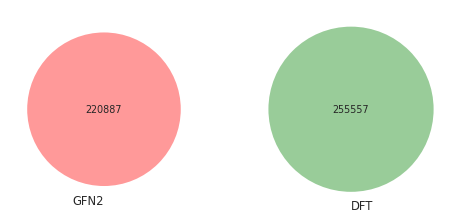

In [107]:
# Convert columns to sets
set_column1 = set(alcohol_df['GFN2_HOMO_LUMO_GAP'])
set_column2 = set(alcohol_df['DFT_HOMO_LUMO_GAP'])

# Find the intersection (overlap)
overlap = set_column1.intersection(set_column2)
print(overlap)

# visualize it
plt.figure(figsize=(8, 8))
venn2([set_column1, set_column2], ('GFN2', 'DFT'))

# Display the diagram
plt.show()

In [108]:
# save to csv
alcohol_df.to_csv("alcohol_df.csv", index = False)

## acrylate

In [109]:
acrylate_df = data[["inchi_key","rdkit_smiles","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","acrylate","HA_count"]]
acrylate_df = acrylate_df[acrylate_df['acrylate'] != 0]

In [110]:
# check to see if number matches
acrylate_df["acrylate"].value_counts()

5    6760
Name: acrylate, dtype: int64

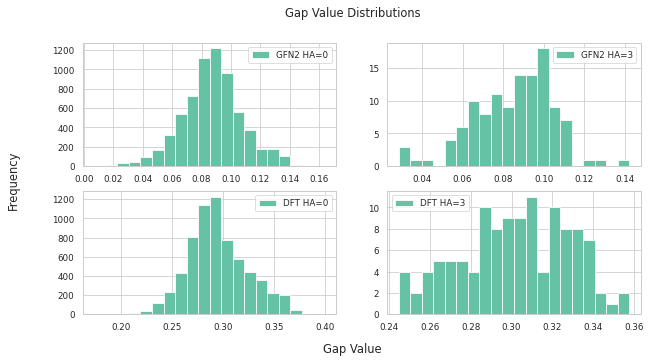

In [111]:
pivot1 = acrylate_df.pivot_table(index='inchi_key', columns='HA_count', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
pivot2 = acrylate_df.pivot_table(index='inchi_key', columns='HA_count', values='DFT_HOMO_LUMO_GAP', aggfunc='mean')

# Add a multi-index to columns to differentiate between GFN2 and DFT values
pivot1.columns = pd.MultiIndex.from_product([['GFN2'], pivot1.columns])
pivot2.columns = pd.MultiIndex.from_product([['DFT'], pivot2.columns])

# Concatenate the pivot tables with multi-indexing
combined_pivot = pd.concat([pivot1, pivot2], axis=1)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Plot histograms and assign labels
for i, (level0, level1) in enumerate(combined_pivot.columns):
    axes[i].hist(combined_pivot[(level0, level1)], bins=20, label=f"{level0} HA={level1}")
    axes[i].legend()  # This adds the legend to each subplot

# Add overall figure titles and labels
fig.suptitle("Gap Value Distributions")
fig.supxlabel("Gap Value")
fig.supylabel("Frequency")

# Display the plot
plt.show()

set()


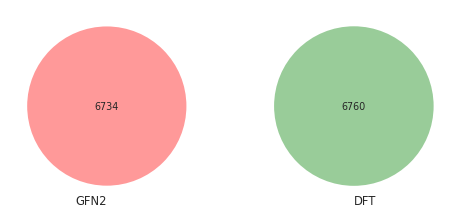

In [112]:
# Convert columns to sets
set_column1 = set(acrylate_df['GFN2_HOMO_LUMO_GAP'])
set_column2 = set(acrylate_df['DFT_HOMO_LUMO_GAP'])

# Find the intersection (overlap)
overlap = set_column1.intersection(set_column2)
print(overlap)

# visualize it
plt.figure(figsize=(8, 8))
venn2([set_column1, set_column2], ('GFN2', 'DFT'))

# Display the diagram
plt.show()

In [113]:
# save to csv
acrylate_df.to_csv("acrylate_df.csv", index = False)

## aldehyde

In [114]:
aldehyde_df = data[["inchi_key","rdkit_smiles","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","aldehyde","HA_count"]]
aldehyde_df = aldehyde_df[aldehyde_df['aldehyde'] != 0]

In [115]:
# check to see if number matches
aldehyde_df["aldehyde"].value_counts()

3    187144
Name: aldehyde, dtype: int64

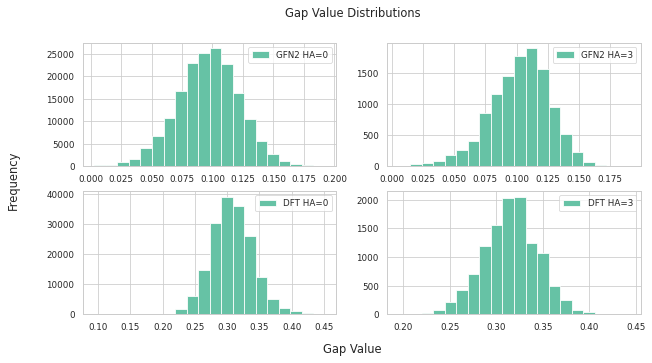

In [116]:
pivot1 = aldehyde_df.pivot_table(index='inchi_key', columns='HA_count', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
pivot2 = aldehyde_df.pivot_table(index='inchi_key', columns='HA_count', values='DFT_HOMO_LUMO_GAP', aggfunc='mean')

# Add a multi-index to columns to differentiate between GFN2 and DFT values
pivot1.columns = pd.MultiIndex.from_product([['GFN2'], pivot1.columns])
pivot2.columns = pd.MultiIndex.from_product([['DFT'], pivot2.columns])

# Concatenate the pivot tables with multi-indexing
combined_pivot = pd.concat([pivot1, pivot2], axis=1)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Plot histograms and assign labels
for i, (level0, level1) in enumerate(combined_pivot.columns):
    axes[i].hist(combined_pivot[(level0, level1)], bins=20, label=f"{level0} HA={level1}")
    axes[i].legend()  # This adds the legend to each subplot

# Add overall figure titles and labels
fig.suptitle("Gap Value Distributions")
fig.supxlabel("Gap Value")
fig.supylabel("Frequency")

# Display the plot
plt.show()

set()


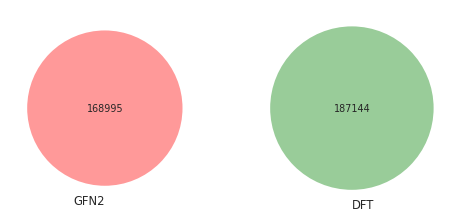

In [117]:
# Convert columns to sets
set_column1 = set(aldehyde_df['GFN2_HOMO_LUMO_GAP'])
set_column2 = set(aldehyde_df['DFT_HOMO_LUMO_GAP'])

# Find the intersection (overlap)
overlap = set_column1.intersection(set_column2)
print(overlap)

# visualize it
plt.figure(figsize=(8, 8))
venn2([set_column1, set_column2], ('GFN2', 'DFT'))

# Display the diagram
plt.show()

In [118]:
# save to csv
aldehyde_df.to_csv("aldehyde_df.csv", index = False)

## methoxyalcohol

In [119]:
methoxyalcohol_df = data[["chembl_id","compound_id","rdkit_smiles","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","methoxyalcohol","HA_count"]]
methoxyalcohol_df = methoxyalcohol_df[methoxyalcohol_df['methoxyalcohol'] != 0]

In [120]:
# check to see if number matches
methoxyalcohol_df["methoxyalcohol"].value_counts()

3    9857
Name: methoxyalcohol, dtype: int64

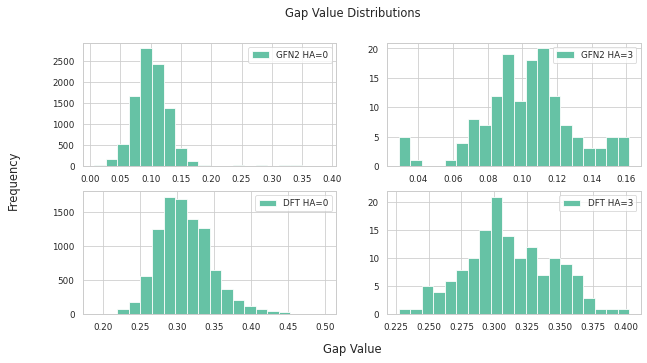

In [121]:
pivot1 = methoxyalcohol_df.pivot_table(index='compound_id', columns='HA_count', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
pivot2 = methoxyalcohol_df.pivot_table(index='compound_id', columns='HA_count', values='DFT_HOMO_LUMO_GAP', aggfunc='mean')

# Add a multi-index to columns to differentiate between GFN2 and DFT values
pivot1.columns = pd.MultiIndex.from_product([['GFN2'], pivot1.columns])
pivot2.columns = pd.MultiIndex.from_product([['DFT'], pivot2.columns])

# Concatenate the pivot tables with multi-indexing
combined_pivot = pd.concat([pivot1, pivot2], axis=1)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Plot histograms and assign labels
for i, (level0, level1) in enumerate(combined_pivot.columns):
    axes[i].hist(combined_pivot[(level0, level1)], bins=20, label=f"{level0} HA={level1}")
    axes[i].legend()  # This adds the legend to each subplot

# Add overall figure titles and labels
fig.suptitle("Gap Value Distributions")
fig.supxlabel("Gap Value")
fig.supylabel("Frequency")

# Display the plot
plt.show()

set()


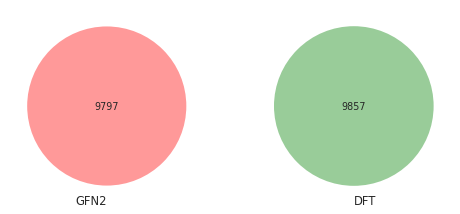

In [122]:
# Convert columns to sets
set_column1 = set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP'])
set_column2 = set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP'])

# Find the intersection (overlap)
overlap = set_column1.intersection(set_column2)
print(overlap)

# visualize it
plt.figure(figsize=(8, 8))
venn2([set_column1, set_column2], ('GFN2', 'DFT'))

# Display the diagram
plt.show()

In [123]:
# save to csv
methoxyalcohol_df.to_csv("methoxyalcohol_df.csv", index = False)

## hydroxyacetamide

In [124]:
hydroxyacetamide_df = data[["chembl_id","compound_id","rdkit_smiles","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","hydroxyacetamide","HA_count"]]
hydroxyacetamide_df = hydroxyacetamide_df[hydroxyacetamide_df['hydroxyacetamide'] != 0]

In [125]:
# check to see if number matches
hydroxyacetamide_df["hydroxyacetamide"].value_counts()

4    8206
Name: hydroxyacetamide, dtype: int64

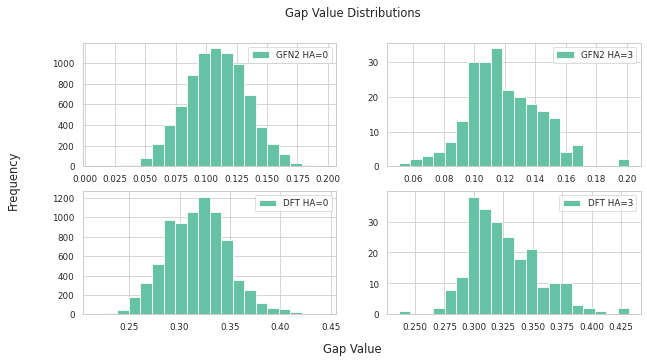

In [126]:
pivot1 = hydroxyacetamide_df.pivot_table(index='compound_id', columns='HA_count', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
pivot2 = hydroxyacetamide_df.pivot_table(index='compound_id', columns='HA_count', values='DFT_HOMO_LUMO_GAP', aggfunc='mean')

# Add a multi-index to columns to differentiate between GFN2 and DFT values
pivot1.columns = pd.MultiIndex.from_product([['GFN2'], pivot1.columns])
pivot2.columns = pd.MultiIndex.from_product([['DFT'], pivot2.columns])

# Concatenate the pivot tables with multi-indexing
combined_pivot = pd.concat([pivot1, pivot2], axis=1)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Plot histograms and assign labels
for i, (level0, level1) in enumerate(combined_pivot.columns):
    axes[i].hist(combined_pivot[(level0, level1)], bins=20, label=f"{level0} HA={level1}")
    axes[i].legend()  # This adds the legend to each subplot

# Add overall figure titles and labels
fig.suptitle("Gap Value Distributions")
fig.supxlabel("Gap Value")
fig.supylabel("Frequency")

# Display the plot
plt.show()

set()


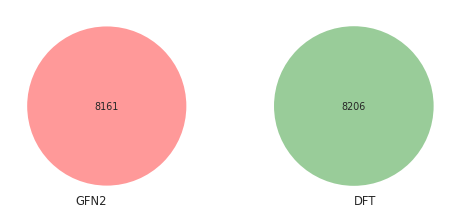

In [127]:
# Convert columns to sets
set_column1 = set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP'])
set_column2 = set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP'])

# Find the intersection (overlap)
overlap = set_column1.intersection(set_column2)
print(overlap)

# visualize it
plt.figure(figsize=(8, 8))
venn2([set_column1, set_column2], ('GFN2', 'DFT'))

# Display the diagram
plt.show()

In [128]:
# save to csv
hydroxyacetamide_df.to_csv("hydroxyacetamide_df.csv", index = False)

## acrylamide

In [129]:
acrylamide_df = data[["chembl_id","compound_id","rdkit_smiles","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","acrylamide","HA_count"]]
acrylamide_df = acrylamide_df[acrylamide_df['acrylamide'] != 0]

In [130]:
# check to see if number matches
acrylamide_df["acrylamide"].value_counts()

5    14791
Name: acrylamide, dtype: int64

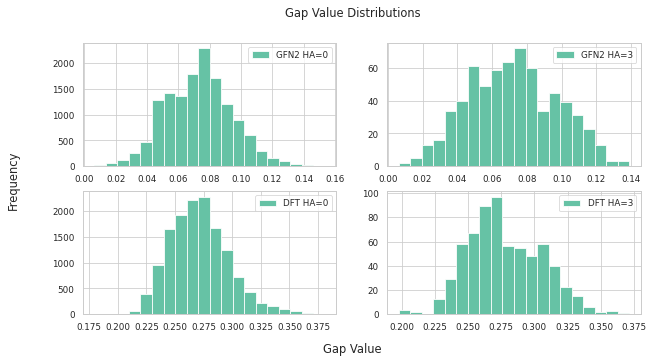

In [131]:
pivot1 = acrylamide_df.pivot_table(index='compound_id', columns='HA_count', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
pivot2 = acrylamide_df.pivot_table(index='compound_id', columns='HA_count', values='DFT_HOMO_LUMO_GAP', aggfunc='mean')

# Add a multi-index to columns to differentiate between GFN2 and DFT values
pivot1.columns = pd.MultiIndex.from_product([['GFN2'], pivot1.columns])
pivot2.columns = pd.MultiIndex.from_product([['DFT'], pivot2.columns])

# Concatenate the pivot tables with multi-indexing
combined_pivot = pd.concat([pivot1, pivot2], axis=1)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Plot histograms and assign labels
for i, (level0, level1) in enumerate(combined_pivot.columns):
    axes[i].hist(combined_pivot[(level0, level1)], bins=20, label=f"{level0} HA={level1}")
    axes[i].legend()  # This adds the legend to each subplot

# Add overall figure titles and labels
fig.suptitle("Gap Value Distributions")
fig.supxlabel("Gap Value")
fig.supylabel("Frequency")

# Display the plot
plt.show()

set()


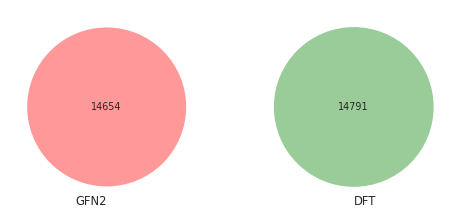

In [132]:
# Convert columns to sets
set_column1 = set(acrylamide_df['GFN2_HOMO_LUMO_GAP'])
set_column2 = set(acrylamide_df['DFT_HOMO_LUMO_GAP'])

# Find the intersection (overlap)
overlap = set_column1.intersection(set_column2)
print(overlap)

# visualize it
plt.figure(figsize=(8, 8))
venn2([set_column1, set_column2], ('GFN2', 'DFT'))

# Display the diagram
plt.show()

In [133]:
# save to csv
acrylamide_df.to_csv("acrylamide_df.csv", index = False)

## carbamate

In [134]:
carbamate_df = data[["chembl_id","compound_id","rdkit_smiles","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","carbamate","HA_count"]]
carbamate_df = carbamate_df[carbamate_df['carbamate'] != 0]

In [135]:
# check to see if number matches
carbamate_df["carbamate"].value_counts()

4    16732
Name: carbamate, dtype: int64

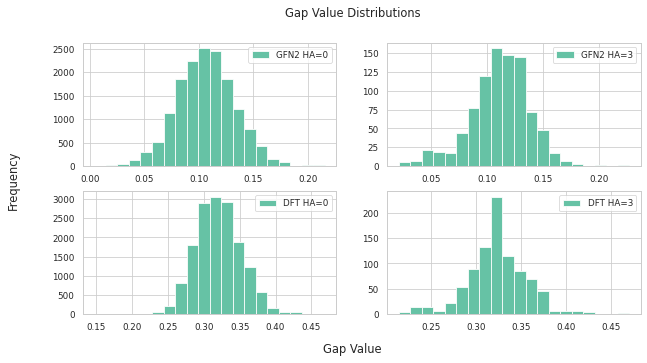

In [136]:
pivot1 = carbamate_df.pivot_table(index='compound_id', columns='HA_count', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
pivot2 = carbamate_df.pivot_table(index='compound_id', columns='HA_count', values='DFT_HOMO_LUMO_GAP', aggfunc='mean')

# Add a multi-index to columns to differentiate between GFN2 and DFT values
pivot1.columns = pd.MultiIndex.from_product([['GFN2'], pivot1.columns])
pivot2.columns = pd.MultiIndex.from_product([['DFT'], pivot2.columns])

# Concatenate the pivot tables with multi-indexing
combined_pivot = pd.concat([pivot1, pivot2], axis=1)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Plot histograms and assign labels
for i, (level0, level1) in enumerate(combined_pivot.columns):
    axes[i].hist(combined_pivot[(level0, level1)], bins=20, label=f"{level0} HA={level1}")
    axes[i].legend()  # This adds the legend to each subplot

# Add overall figure titles and labels
fig.suptitle("Gap Value Distributions")
fig.supxlabel("Gap Value")
fig.supylabel("Frequency")

# Display the plot
plt.show()

set()


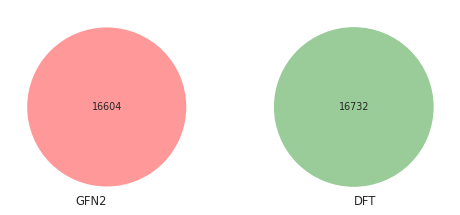

In [137]:
# Convert columns to sets
set_column1 = set(carbamate_df['GFN2_HOMO_LUMO_GAP'])
set_column2 = set(carbamate_df['DFT_HOMO_LUMO_GAP'])

# Find the intersection (overlap)
overlap = set_column1.intersection(set_column2)
print(overlap)

# visualize it
plt.figure(figsize=(8, 8))
venn2([set_column1, set_column2], ('GFN2', 'DFT'))

# Display the diagram
plt.show()

In [138]:
# save to csv
carbamate_df.to_csv("carbamate_df.csv", index = False)

## allamide

In [139]:
allamide_df = data[["chembl_id","compound_id","rdkit_smiles","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","allamide","HA_count"]]
allamide_df = allamide_df[allamide_df['allamide'] != 0]

In [140]:
# check to see if number matches
allamide_df["allamide"].value_counts()

3    239469
Name: allamide, dtype: int64

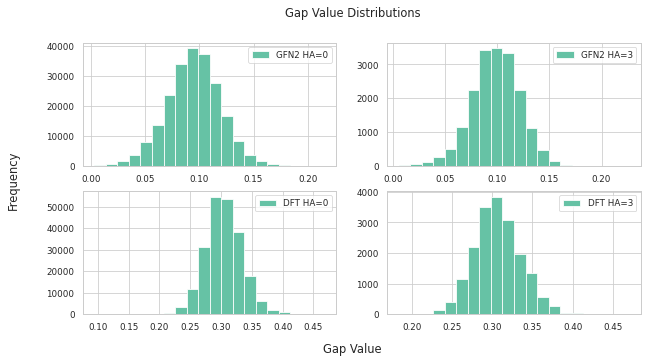

In [141]:
pivot1 = allamide_df.pivot_table(index='compound_id', columns='HA_count', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
pivot2 = allamide_df.pivot_table(index='compound_id', columns='HA_count', values='DFT_HOMO_LUMO_GAP', aggfunc='mean')

# Add a multi-index to columns to differentiate between GFN2 and DFT values
pivot1.columns = pd.MultiIndex.from_product([['GFN2'], pivot1.columns])
pivot2.columns = pd.MultiIndex.from_product([['DFT'], pivot2.columns])

# Concatenate the pivot tables with multi-indexing
combined_pivot = pd.concat([pivot1, pivot2], axis=1)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Plot histograms and assign labels
for i, (level0, level1) in enumerate(combined_pivot.columns):
    axes[i].hist(combined_pivot[(level0, level1)], bins=20, label=f"{level0} HA={level1}")
    axes[i].legend()  # This adds the legend to each subplot

# Add overall figure titles and labels
fig.suptitle("Gap Value Distributions")
fig.supxlabel("Gap Value")
fig.supylabel("Frequency")

# Display the plot
plt.show()

set()


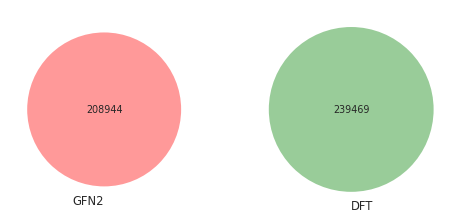

In [142]:
# Convert columns to sets
set_column1 = set(allamide_df['GFN2_HOMO_LUMO_GAP'])
set_column2 = set(allamide_df['DFT_HOMO_LUMO_GAP'])

# Find the intersection (overlap)
overlap = set_column1.intersection(set_column2)
print(overlap)

# visualize it
plt.figure(figsize=(8, 8))
venn2([set_column1, set_column2], ('GFN2', 'DFT'))

# Display the diagram
plt.show()

In [143]:
# save to csv
allamide_df.to_csv("allamide_df.csv", index = False)

## amide_NH2

In [144]:
amide_NH2_df = data[["chembl_id","compound_id","rdkit_smiles","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","amide_NH2","HA_count"]]
amide_NH2_df = amide_NH2_df[amide_NH2_df['amide_NH2'] != 0]

In [145]:
# check to see if number matches
amide_NH2_df["amide_NH2"].value_counts()

3    18643
Name: amide_NH2, dtype: int64

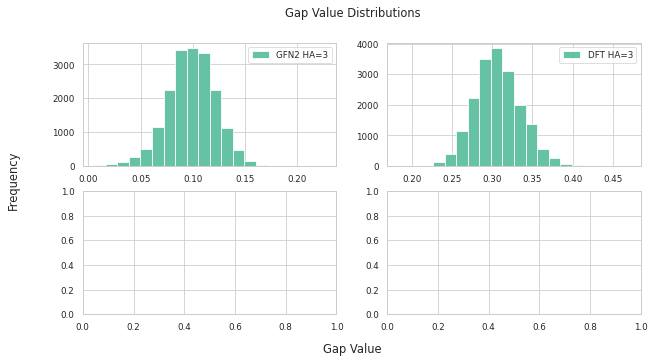

In [146]:
pivot1 = amide_NH2_df.pivot_table(index='compound_id', columns='HA_count', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
pivot2 = amide_NH2_df.pivot_table(index='compound_id', columns='HA_count', values='DFT_HOMO_LUMO_GAP', aggfunc='mean')

# Add a multi-index to columns to differentiate between GFN2 and DFT values
pivot1.columns = pd.MultiIndex.from_product([['GFN2'], pivot1.columns])
pivot2.columns = pd.MultiIndex.from_product([['DFT'], pivot2.columns])

# Concatenate the pivot tables with multi-indexing
combined_pivot = pd.concat([pivot1, pivot2], axis=1)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Plot histograms and assign labels
for i, (level0, level1) in enumerate(combined_pivot.columns):
    axes[i].hist(combined_pivot[(level0, level1)], bins=20, label=f"{level0} HA={level1}")
    axes[i].legend()  # This adds the legend to each subplot

# Add overall figure titles and labels
fig.suptitle("Gap Value Distributions")
fig.supxlabel("Gap Value")
fig.supylabel("Frequency")

# Display the plot
plt.show()

set()


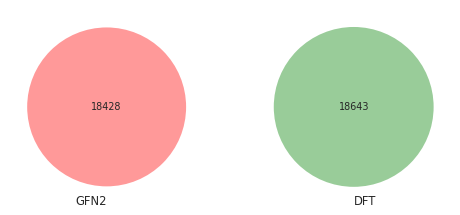

In [147]:
# Convert columns to sets
set_column1 = set(amide_NH2_df['GFN2_HOMO_LUMO_GAP'])
set_column2 = set(amide_NH2_df['DFT_HOMO_LUMO_GAP'])

# Find the intersection (overlap)
overlap = set_column1.intersection(set_column2)
print(overlap)

# visualize it
plt.figure(figsize=(8, 8))
venn2([set_column1, set_column2], ('GFN2', 'DFT'))

# Display the diagram
plt.show()

In [148]:
# save to csv
amide_NH2_df.to_csv("amide_NH2_df.csv", index = False)

# Merge and find rings

## load and preview data

In [28]:
qmugs = pd.read_csv("qmugs_rdkit_smiles.csv")

In [31]:
data = pd.read_csv("new_columbia_curated.csv")

In [33]:
df = pd.merge(data,qmugs[["chembl_id","rings"]],on = "chembl_id", how = "inner")

In [34]:
df.head()

,chembl_id,smiles,mw,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,rdkit_smiles,inchi_key,compound_id,VALUE_NUM_mean,VALUE_NUM_std,Perc_Var,Remove_BadDuplicate,amides,carboxy,sulfonyl,sulfonamide,alcohol,acrylate,aldehyde,methoxyalcohol,hydroxyacetamide,acrylamide,carbamate,oxyirane,allamide,amide_NH2,HA_count,rings
0,CHEMBL1,[H]c1c([H])c2c(c([H])c1OC([H])([H])[H])OC([H])...,544.209718,0.044924,0.242930,COc1ccc2c(c1)OC[C@H]1[C@@H]2C2=C(OC1(C)C)C1=C(...,GHBOEFUAGSHXPO-XZOTUCIWSA-N,GHBOEFUAGSHXPO-XZOTUCIWSA-N,0.242102,0.000833,0.341925,0,0,0,0,0,2,0,3,0,0,0,0,0,0,0,0,7
1,CHEMBL1,[H]c1c([H])c2c(c([H])c1OC([H])([H])[H])OC([H])...,544.209718,0.044924,0.242930,COc1ccc2c(c1)OC[C@H]1[C@@H]2C2=C(OC1(C)C)C1=C(...,GHBOEFUAGSHXPO-XZOTUCIWSA-N,GHBOEFUAGSHXPO-XZOTUCIWSA-N,0.242102,0.000833,0.341925,0,0,0,0,0,2,0,3,0,0,0,0,0,0,0,0,7
2,CHEMBL1,[H]c1c([H])c2c(c([H])c1OC([H])([H])[H])OC([H])...,544.209718,0.044924,0.242930,COc1ccc2c(c1)OC[C@H]1[C@@H]2C2=C(OC1(C)C)C1=C(...,GHBOEFUAGSHXPO-XZOTUCIWSA-N,GHBOEFUAGSHXPO-XZOTUCIWSA-N,0.242102,0.000833,0.341925,0,0,0,0,0,2,0,3,0,0,0,0,0,0,0,0,7
3,CHEMBL1000,[H]OC(=O)C([H])([H])OC([H])([H])C([H])([H])N1C...,388.155370,0.115170,0.340824,O=C(O)COCCN1CCN([C@@H](c2ccccc2)c2ccc(Cl)cc2)CC1,ZKLPARSLTMPFCP-NRFANRHFSA-N,ZKLPARSLTMPFCP-NRFANRHFSA-N,0.333456,0.006397,2.209649,0,0,4,0,0,2,0,3,0,0,0,0,0,0,0,0,3
4,CHEMBL1000,[H]OC(=O)C([H])([H])OC([H])([H])C([H])([H])N1C...,388.155370,0.115170,0.340824,O=C(O)COCCN1CCN([C@@H](c2ccccc2)c2ccc(Cl)cc2)CC1,ZKLPARSLTMPFCP-NRFANRHFSA-N,ZKLPARSLTMPFCP-NRFANRHFSA-N,0.333456,0.006397,2.209649,0,0,4,0,0,2,0,3,0,0,0,0,0,0,0,0,3


## rings

In [35]:
df["rings"].describe()

count    1.309851e+06
mean     3.742266e+00
std      1.314720e+00
min      0.000000e+00
25%      3.000000e+00
50%      4.000000e+00
75%      5.000000e+00
max      2.100000e+01
Name: rings, dtype: float64

### split dataset

In [ ]:
ring25_df = df[df["rings"] <= 3]
ring50_df = df[(df["rings"] > 3) & (df["rings"] <= 4)]
ring75_df = df[(df["rings"] > 4) & (df["rings"] <= 5)]
ring100_df = df[df["rings"] > 5 ]
# ring_average_df = df[df["rings"] == 3.801509 ]

In [ ]:
ring25_df = ring25_df[["compound_id","rings","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","rdkit_smiles"]]
ring50_df = ring50_df[["compound_id","rings","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","rdkit_smiles"]]
ring75_df = ring75_df[["compound_id","rings","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","rdkit_smiles"]]
ring100_df = ring100_df[["compound_id","rings","GFN2_HOMO_LUMO_GAP","DFT_HOMO_LUMO_GAP","rdkit_smiles"]]

In [ ]:
ring100_df.describe()

,rings,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP
count,103628.000000,103628.000000,103628.000000
mean,6.431293,0.086554,0.292238
std,0.839911,0.024764,0.028287
min,6.000000,0.004242,0.159069
25%,6.000000,0.071880,0.274506
50%,6.000000,0.086916,0.290957
75%,7.000000,0.101419,0.309407
max,21.000000,0.378157,0.446419


### ring 25

<AxesSubplot:>

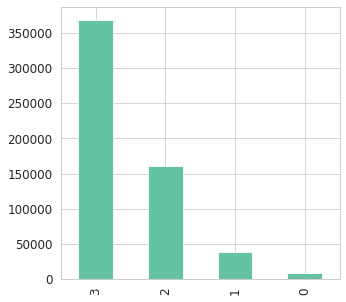

In [ ]:
# find distribution of different ring numbers
ring25_df.rings.value_counts().plot(kind='bar', figsize = (5,5))

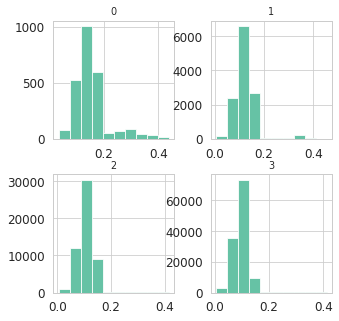

In [ ]:
# examine GFN2 HOMO LUMO GAP Value PER Compound Id
ring25_types = ring25_df.pivot_table(index = 'compound_id', columns = 'rings', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
ring25_types.hist(figsize=(5,5));

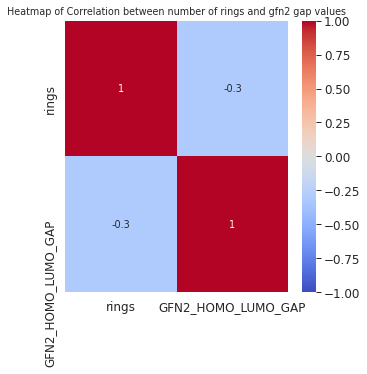

In [ ]:
# Compute the correlation matrix
corr_matrix = ring25_df[['rings', 'GFN2_HOMO_LUMO_GAP']].corr()

# Plot the heatmap
plt.figure(figsize=(5, 5))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Heatmap of Correlation between number of rings and gfn2 gap values')
plt.show()

In [ ]:
ring25_df["GFN2_HOMO_LUMO_GAP"].describe()

count    574816.000000
mean          0.101601
std           0.029656
min           0.004683
25%           0.084697
50%           0.101153
75%           0.117371
max           0.454126
Name: GFN2_HOMO_LUMO_GAP, dtype: float64

In [ ]:
ring25_df["DFT_HOMO_LUMO_GAP"].describe()

count    574816.000000
mean          0.311971
std           0.032382
min           0.106250
25%           0.289985
50%           0.309916
75%           0.332028
max           0.512243
Name: DFT_HOMO_LUMO_GAP, dtype: float64

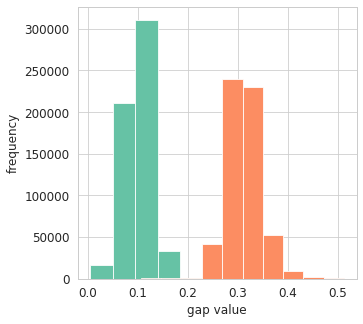

In [ ]:
ring25_df["GFN2_HOMO_LUMO_GAP"].hist(figsize=(5,5))
ring25_df["DFT_HOMO_LUMO_GAP"].hist(figsize=(5,5))
plt.xlabel("gap value")
plt.ylabel("frequency")
plt.show()

### ring 50

<AxesSubplot:>

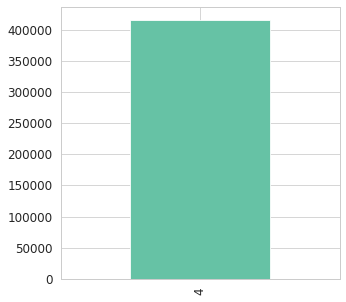

In [ ]:
# find distribution of different ring numbers
ring50_df.rings.value_counts().plot(kind='bar', figsize = (5,5))

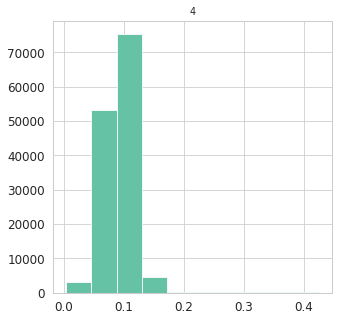

In [ ]:
# examine GFN2 HOMO LUMO GAP Value PER Compound Id
ring50_types = ring50_df.pivot_table(index = 'compound_id', columns = 'rings', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
ring50_types.hist(figsize=(5,5));

In [ ]:
ring50_df["GFN2_HOMO_LUMO_GAP"].describe()

count    415042.000000
mean          0.091988
std           0.022924
min           0.003062
25%           0.078312
50%           0.092280
75%           0.106157
max           0.426394
Name: GFN2_HOMO_LUMO_GAP, dtype: float64

In [ ]:
ring50_df["DFT_HOMO_LUMO_GAP"].describe()

count    415042.000000
mean          0.298669
std           0.026332
min           0.094158
25%           0.281567
50%           0.297640
75%           0.315119
max           0.462676
Name: DFT_HOMO_LUMO_GAP, dtype: float64

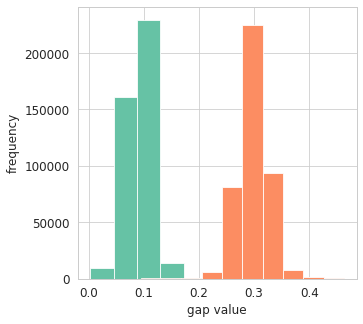

In [ ]:
ring50_df["GFN2_HOMO_LUMO_GAP"].hist(figsize=(5,5))
ring50_df["DFT_HOMO_LUMO_GAP"].hist(figsize=(5,5))
plt.xlabel("gap value")
plt.ylabel("frequency")
plt.show()

### ring 75

<AxesSubplot:>

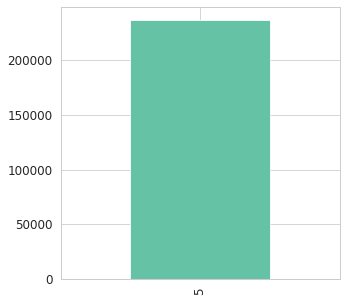

In [ ]:
# find distribution of different ring numbers
ring75_df.rings.value_counts().plot(kind='bar', figsize = (5,5))

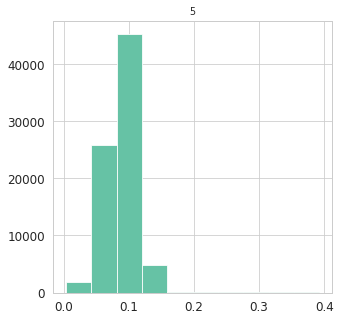

In [ ]:
# examine GFN2 HOMO LUMO GAP Value PER Compound Id
ring75_types = ring75_df.pivot_table(index = 'compound_id', columns = 'rings', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
ring75_types.hist(figsize=(5,5));

In [ ]:
ring75_df["GFN2_HOMO_LUMO_GAP"].describe()

count    236758.000000
mean          0.088510
std           0.022744
min           0.003365
25%           0.074874
50%           0.088644
75%           0.102189
max           0.392467
Name: GFN2_HOMO_LUMO_GAP, dtype: float64

In [ ]:
ring75_df["DFT_HOMO_LUMO_GAP"].describe()

count    236758.000000
mean          0.294510
std           0.026323
min           0.155770
25%           0.277310
50%           0.293144
75%           0.310638
max           0.456954
Name: DFT_HOMO_LUMO_GAP, dtype: float64

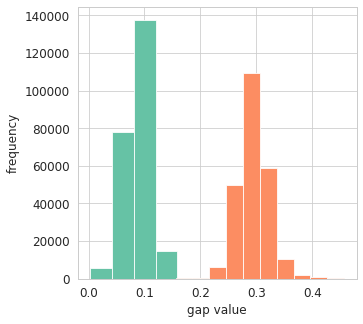

In [ ]:
ring75_df["GFN2_HOMO_LUMO_GAP"].hist(figsize=(5,5))
ring75_df["DFT_HOMO_LUMO_GAP"].hist(figsize=(5,5))
plt.xlabel("gap value")
plt.ylabel("frequency")
plt.show()

### ring 100

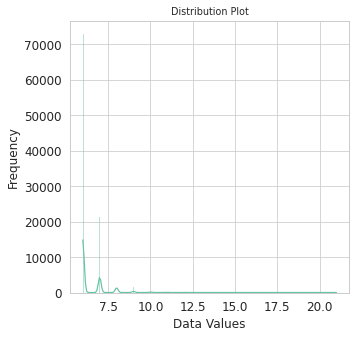

In [ ]:
plt.figure(figsize=(5, 5))
sns.histplot(ring100_df["rings"], kde=True) 
plt.title('Distribution Plot')
plt.xlabel('Data Values')
plt.ylabel('Frequency')
plt.show()

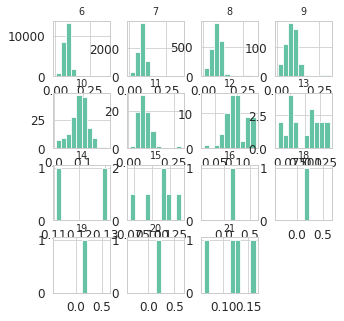

In [ ]:
# examine GFN2 HOMO LUMO GAP Value PER Compound Id
ring100_types = ring100_df.pivot_table(index = 'compound_id', columns = 'rings', values='GFN2_HOMO_LUMO_GAP', aggfunc='mean')
ring100_types.hist(figsize=(5,5))
plt.show()

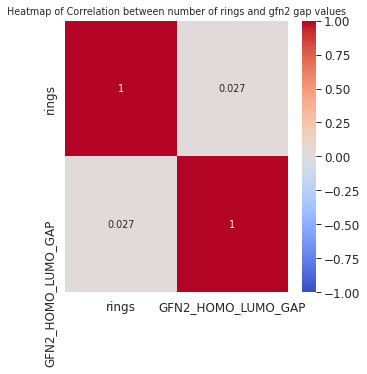

In [ ]:
# Compute the correlation matrix
corr_matrix = ring100_df[['rings', 'GFN2_HOMO_LUMO_GAP']].corr()

# Plot the heatmap
plt.figure(figsize=(5, 5))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Heatmap of Correlation between number of rings and gfn2 gap values')
plt.show()

In [ ]:
ring100_df["GFN2_HOMO_LUMO_GAP"].describe()

count    103628.000000
mean          0.086554
std           0.024764
min           0.004242
25%           0.071880
50%           0.086916
75%           0.101419
max           0.378157
Name: GFN2_HOMO_LUMO_GAP, dtype: float64

In [ ]:
ring100_df["DFT_HOMO_LUMO_GAP"].describe()

count    103628.000000
mean          0.292238
std           0.028287
min           0.159069
25%           0.274506
50%           0.290957
75%           0.309407
max           0.446419
Name: DFT_HOMO_LUMO_GAP, dtype: float64

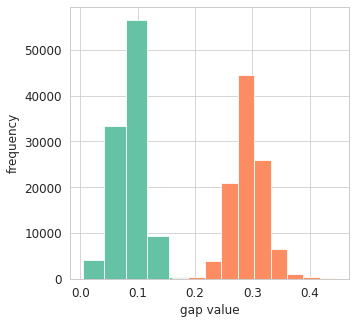

In [ ]:
ring100_df["GFN2_HOMO_LUMO_GAP"].hist(figsize=(5,5))
ring100_df["DFT_HOMO_LUMO_GAP"].hist(figsize=(5,5))
plt.xlabel("gap value")
plt.ylabel("frequency")
plt.show()

### compare across different percentiles

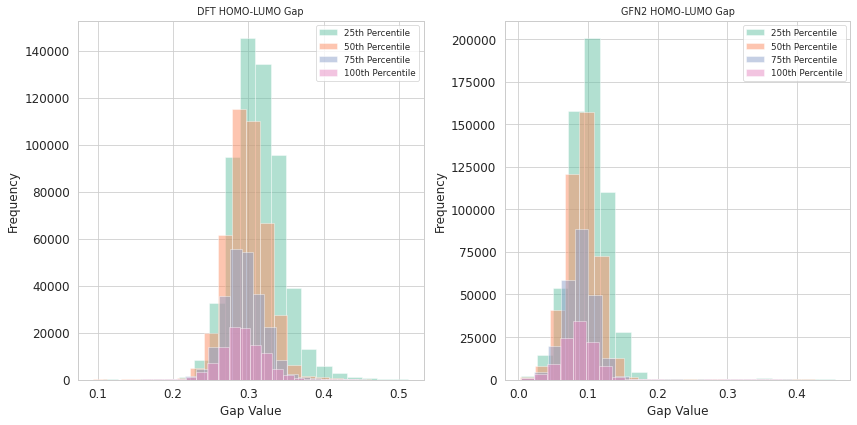

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # 1 row, 2 columns
dataframes = [ring25_df, ring50_df, ring75_df, ring100_df]
labels = ['25th Percentile', '50th Percentile', '75th Percentile', '100th Percentile']

# Plot DFT_HOMO_LUMO_GAP histograms
for df, label in zip(dataframes, labels):
    axes[0].hist(df["DFT_HOMO_LUMO_GAP"], bins=20, alpha=0.5, label=label)

# Plot GFN2_HOMO_LUMO_GAP histograms
for df, label in zip(dataframes, labels):
    axes[1].hist(df["GFN2_HOMO_LUMO_GAP"], bins=20, alpha=0.5, label=label)

axes[0].set_title("DFT HOMO-LUMO Gap")
axes[0].set_xlabel("Gap Value")
axes[0].set_ylabel("Frequency")
axes[0].legend()

axes[1].set_title("GFN2 HOMO-LUMO Gap")
axes[1].set_xlabel("Gap Value")
axes[1].set_ylabel("Frequency")
axes[1].legend()

plt.tight_layout()
plt.show()

In [ ]:
for i, df in enumerate([ring25_df, ring50_df, ring75_df, ring100_df], start=1):
    stats = df['GFN2_HOMO_LUMO_GAP'].describe()
    print(f"GFN2 HOMO-LUMO Gap - {i*25}th Percentile:")
    print(stats, "\n")

GFN2 HOMO-LUMO Gap - 25th Percentile:
count    574816.000000
mean          0.101601
std           0.029656
min           0.004683
25%           0.084697
50%           0.101153
75%           0.117371
max           0.454126
Name: GFN2_HOMO_LUMO_GAP, dtype: float64 

GFN2 HOMO-LUMO Gap - 50th Percentile:
count    415042.000000
mean          0.091988
std           0.022924
min           0.003062
25%           0.078312
50%           0.092280
75%           0.106157
max           0.426394
Name: GFN2_HOMO_LUMO_GAP, dtype: float64 

GFN2 HOMO-LUMO Gap - 75th Percentile:
count    236758.000000
mean          0.088510
std           0.022744
min           0.003365
25%           0.074874
50%           0.088644
75%           0.102189
max           0.392467
Name: GFN2_HOMO_LUMO_GAP, dtype: float64 

GFN2 HOMO-LUMO Gap - 100th Percentile:
count    103628.000000
mean          0.086554
std           0.024764
min           0.004242
25%           0.071880
50%           0.086916
75%           0.101419
max  

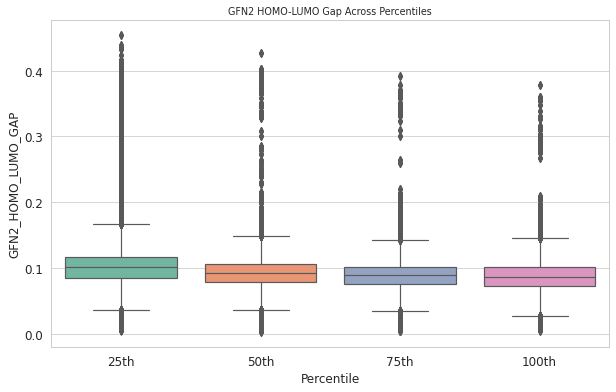

In [ ]:
# Combine data for boxplot
combined_data_gfn2 = pd.concat([df.assign(Percentile=f"{i*25}th") for i, df in enumerate([ring25_df, ring50_df, ring75_df, ring100_df], start=1)])

# Create boxplots
plt.figure(figsize=(10, 6))
sns.boxplot(x='Percentile', y='GFN2_HOMO_LUMO_GAP', data=combined_data_gfn2)
plt.title('GFN2 HOMO-LUMO Gap Across Percentiles')
plt.show()

In [ ]:
for i, df in enumerate([ring25_df, ring50_df, ring75_df, ring100_df], start=1):
    stats = df['DFT_HOMO_LUMO_GAP'].describe()
    print(f"DFT HOMO-LUMO Gap - {i*25}th Percentile:")
    print(stats, "\n")

DFT HOMO-LUMO Gap - 25th Percentile:
count    574816.000000
mean          0.311971
std           0.032382
min           0.106250
25%           0.289985
50%           0.309916
75%           0.332028
max           0.512243
Name: DFT_HOMO_LUMO_GAP, dtype: float64 

DFT HOMO-LUMO Gap - 50th Percentile:
count    415042.000000
mean          0.298669
std           0.026332
min           0.094158
25%           0.281567
50%           0.297640
75%           0.315119
max           0.462676
Name: DFT_HOMO_LUMO_GAP, dtype: float64 

DFT HOMO-LUMO Gap - 75th Percentile:
count    236758.000000
mean          0.294510
std           0.026323
min           0.155770
25%           0.277310
50%           0.293144
75%           0.310638
max           0.456954
Name: DFT_HOMO_LUMO_GAP, dtype: float64 

DFT HOMO-LUMO Gap - 100th Percentile:
count    103628.000000
mean          0.292238
std           0.028287
min           0.159069
25%           0.274506
50%           0.290957
75%           0.309407
max         

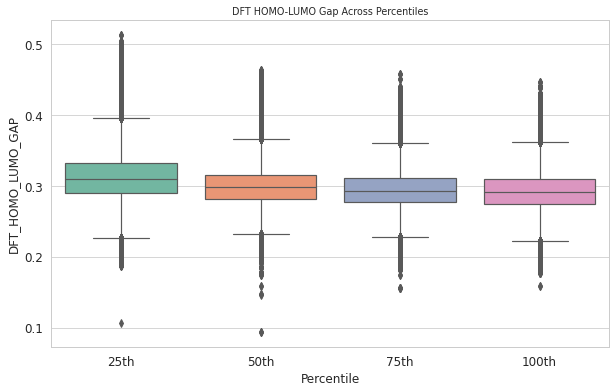

In [ ]:
# Combine data for boxplot
combined_data_dft = pd.concat([df.assign(Percentile=f"{i*25}th") for i, df in enumerate([ring25_df, ring50_df, ring75_df, ring100_df], start=1)])

# Create boxplots
plt.figure(figsize=(10, 6))
sns.boxplot(x='Percentile', y='DFT_HOMO_LUMO_GAP', data=combined_data_dft)
plt.title('DFT HOMO-LUMO Gap Across Percentiles')
plt.show()

# Compare gap values across all functional groups

### Overlaps of GFN2_HOMO_LUMO_GAP

In [ ]:
set_column1 = set(amide_df['GFN2_HOMO_LUMO_GAP'])
set_column2 = set(carboxy_df['GFN2_HOMO_LUMO_GAP'])
set_column3 = set(sulfonyl_df['GFN2_HOMO_LUMO_GAP'])
set_column4 = set(sulfonamide_df['GFN2_HOMO_LUMO_GAP'])
set_column5 = set(alcohol_df['GFN2_HOMO_LUMO_GAP'])
set_column6 = set(acrylate_df['GFN2_HOMO_LUMO_GAP'])
set_column7 = set(aldehyde_df['GFN2_HOMO_LUMO_GAP'])
set_column8 = set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP'])
set_column9 = set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP'])
set_column10 = set(acrylamide_df['GFN2_HOMO_LUMO_GAP'])
set_column11 = set(carbamate_df['GFN2_HOMO_LUMO_GAP'])
set_column12 = set(allamide_df['GFN2_HOMO_LUMO_GAP'])
set_column13 = set(amide_NH2_df ['GFN2_HOMO_LUMO_GAP'])

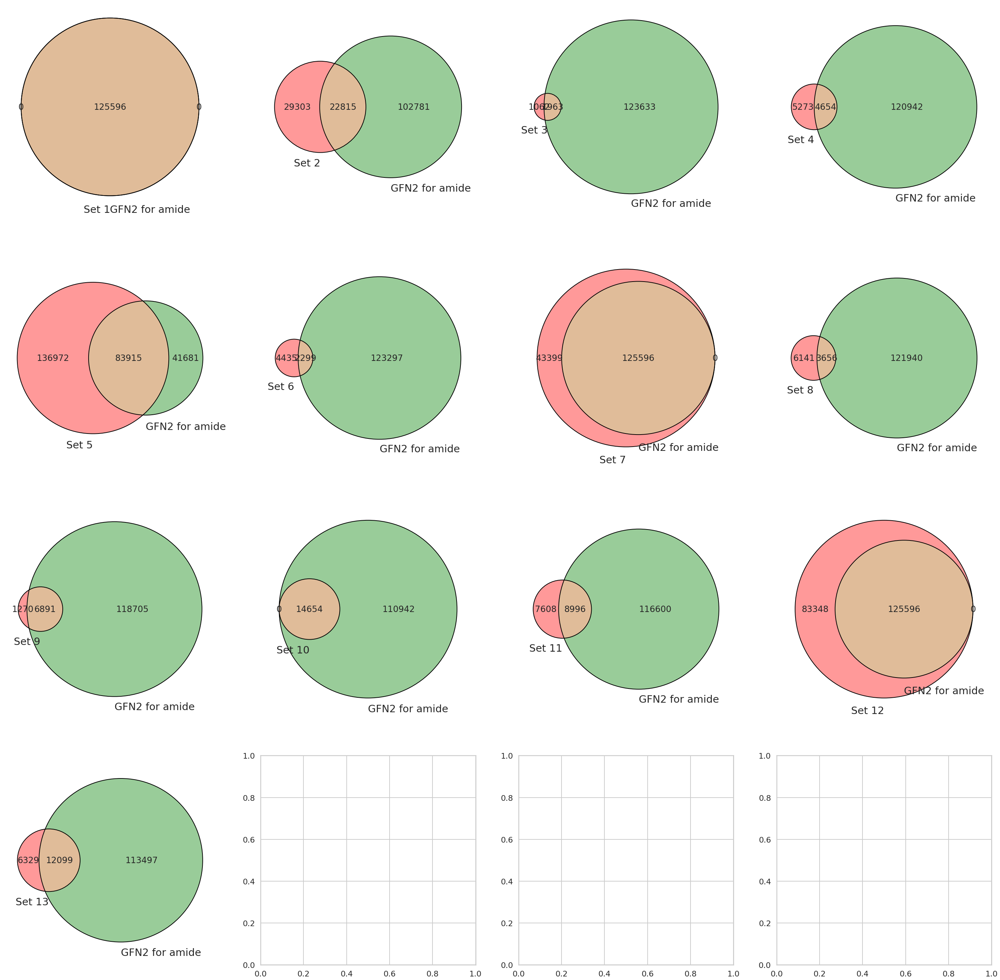

In [ ]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2, venn2_circles

# compare across gap value

# Find the intersection (overlap)
sets = [set(amide_df['GFN2_HOMO_LUMO_GAP']),
        set(carboxy_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonyl_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonamide_df['GFN2_HOMO_LUMO_GAP']),
        set(alcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylate_df['GFN2_HOMO_LUMO_GAP']),
        set(aldehyde_df['GFN2_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylamide_df['GFN2_HOMO_LUMO_GAP']),
        set(carbamate_df['GFN2_HOMO_LUMO_GAP']),
        set(allamide_df['GFN2_HOMO_LUMO_GAP']),
        set(amide_NH2_df['GFN2_HOMO_LUMO_GAP'])]

# visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))


for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set_column1], set_labels=('Set ' + str(index + 1), 'GFN2 for amide'), ax=axes[i, j])
            venn2_circles([sets[index], set_column1], ax=axes[i, j])


# Display the diagram
plt.show()



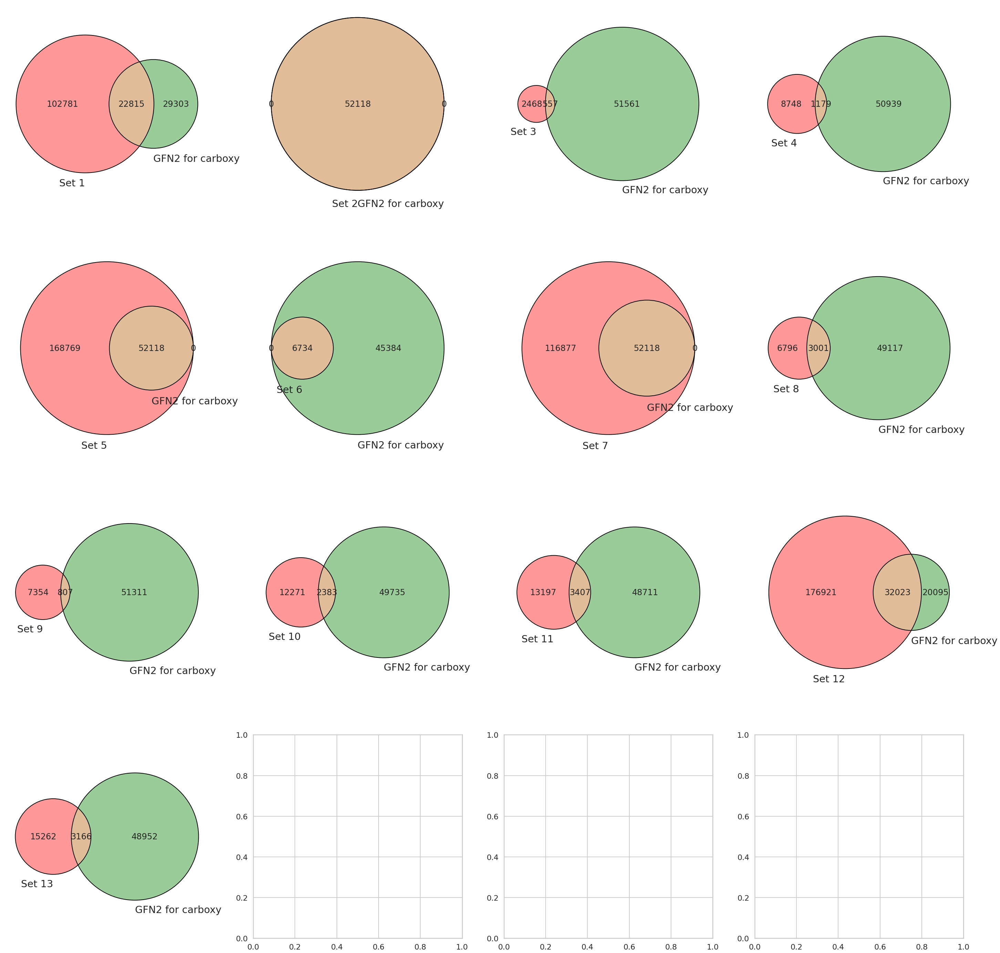

In [ ]:
# compare across gap value

# Find the intersection (overlap)
sets = [set(amide_df['GFN2_HOMO_LUMO_GAP']),
        set(carboxy_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonyl_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonamide_df['GFN2_HOMO_LUMO_GAP']),
        set(alcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylate_df['GFN2_HOMO_LUMO_GAP']),
        set(aldehyde_df['GFN2_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylamide_df['GFN2_HOMO_LUMO_GAP']),
        set(carbamate_df['GFN2_HOMO_LUMO_GAP']),
        set(allamide_df['GFN2_HOMO_LUMO_GAP']),
        set(amide_NH2_df['GFN2_HOMO_LUMO_GAP'])]

# visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set_column2], set_labels=('Set ' + str(index + 1), 'GFN2 for carboxy'), ax=axes[i, j])
            venn2_circles([sets[index], set_column2], ax=axes[i, j])
            
    
# Display the diagram
plt.show()


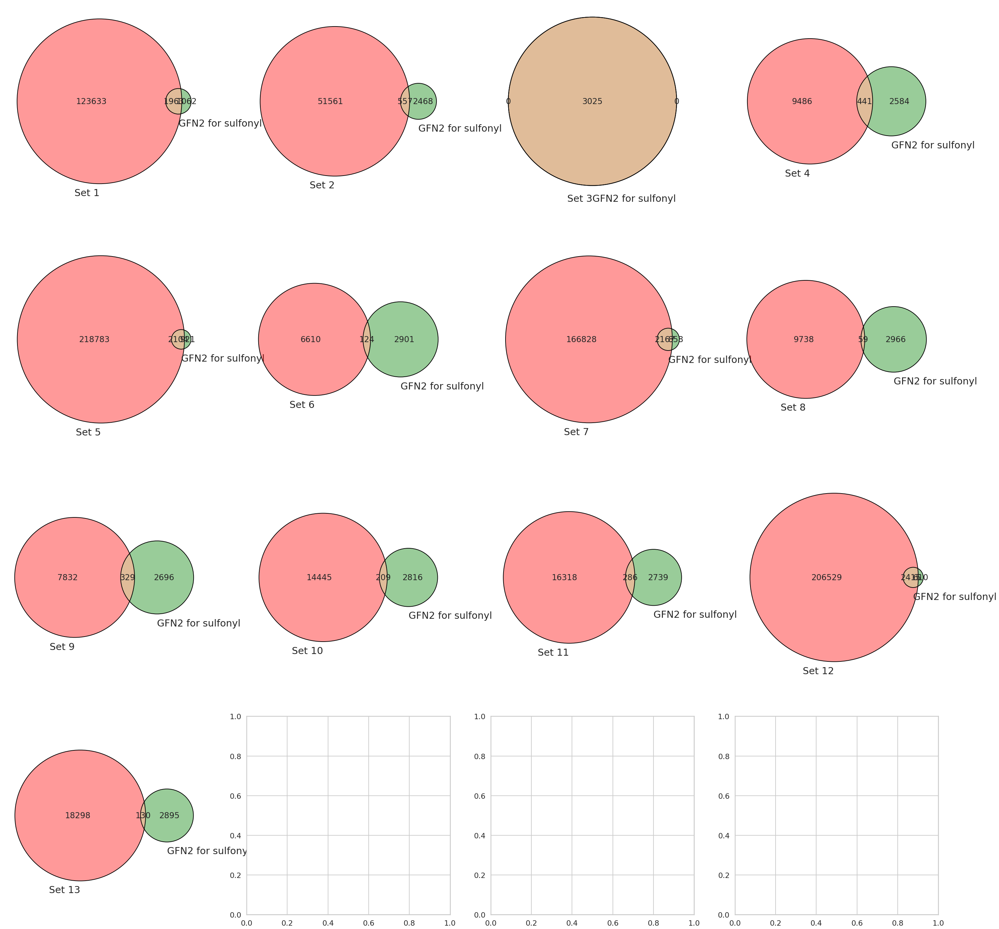

In [ ]:
# compare across gap value

# Find the intersection (overlap)
sets = [set(amide_df['GFN2_HOMO_LUMO_GAP']),
        set(carboxy_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonyl_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonamide_df['GFN2_HOMO_LUMO_GAP']),
        set(alcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylate_df['GFN2_HOMO_LUMO_GAP']),
        set(aldehyde_df['GFN2_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylamide_df['GFN2_HOMO_LUMO_GAP']),
        set(carbamate_df['GFN2_HOMO_LUMO_GAP']),
        set(allamide_df['GFN2_HOMO_LUMO_GAP']),
        set(amide_NH2_df['GFN2_HOMO_LUMO_GAP'])]

# visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set_column3], set_labels=('Set ' + str(index + 1), 'GFN2 for sulfonyl'), ax=axes[i, j])
            venn2_circles([sets[index], set_column3], ax=axes[i, j])
            
    
# Display the diagram
plt.show()


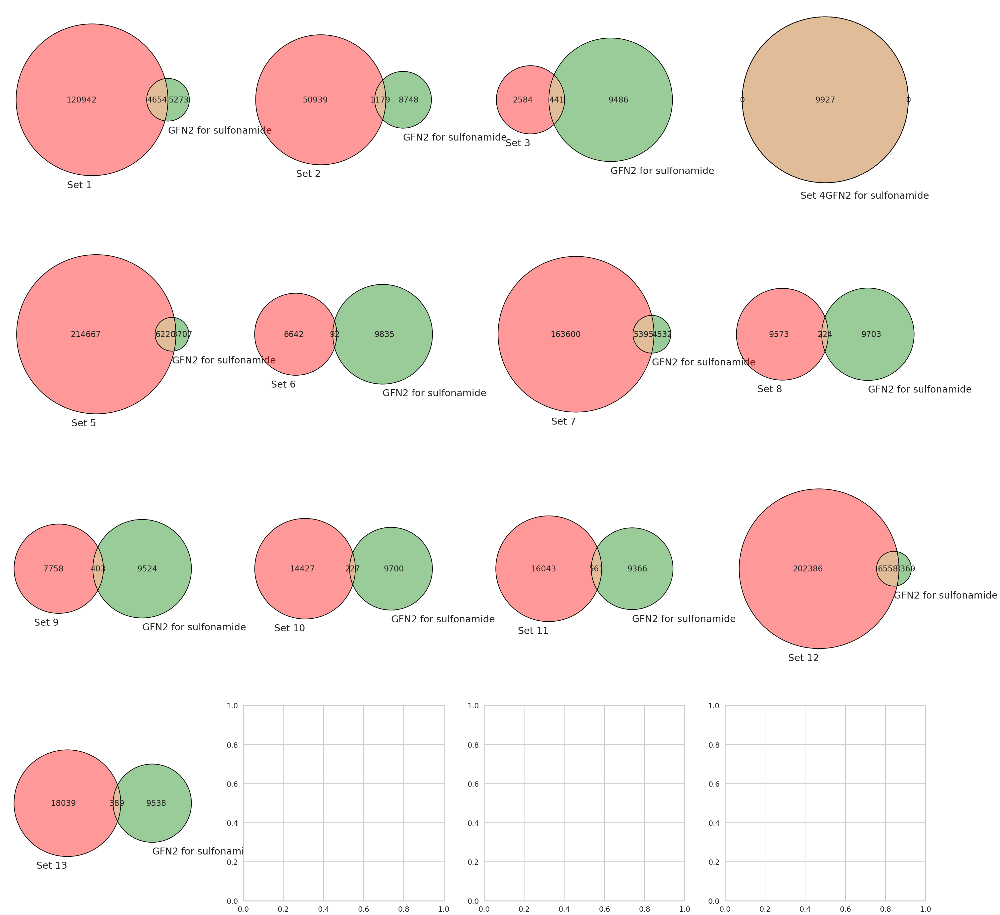

In [ ]:
# compare across gap value

# Find the intersection (overlap)
sets = [set(amide_df['GFN2_HOMO_LUMO_GAP']),
        set(carboxy_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonyl_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonamide_df['GFN2_HOMO_LUMO_GAP']),
        set(alcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylate_df['GFN2_HOMO_LUMO_GAP']),
        set(aldehyde_df['GFN2_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylamide_df['GFN2_HOMO_LUMO_GAP']),
        set(carbamate_df['GFN2_HOMO_LUMO_GAP']),
        set(allamide_df['GFN2_HOMO_LUMO_GAP']),
        set(amide_NH2_df['GFN2_HOMO_LUMO_GAP'])]

# visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set_column4], set_labels=('Set ' + str(index + 1), 'GFN2 for sulfonamide'), ax=axes[i, j])
            venn2_circles([sets[index], set_column4], ax=axes[i, j])
            
    
# Display the diagram
plt.show()

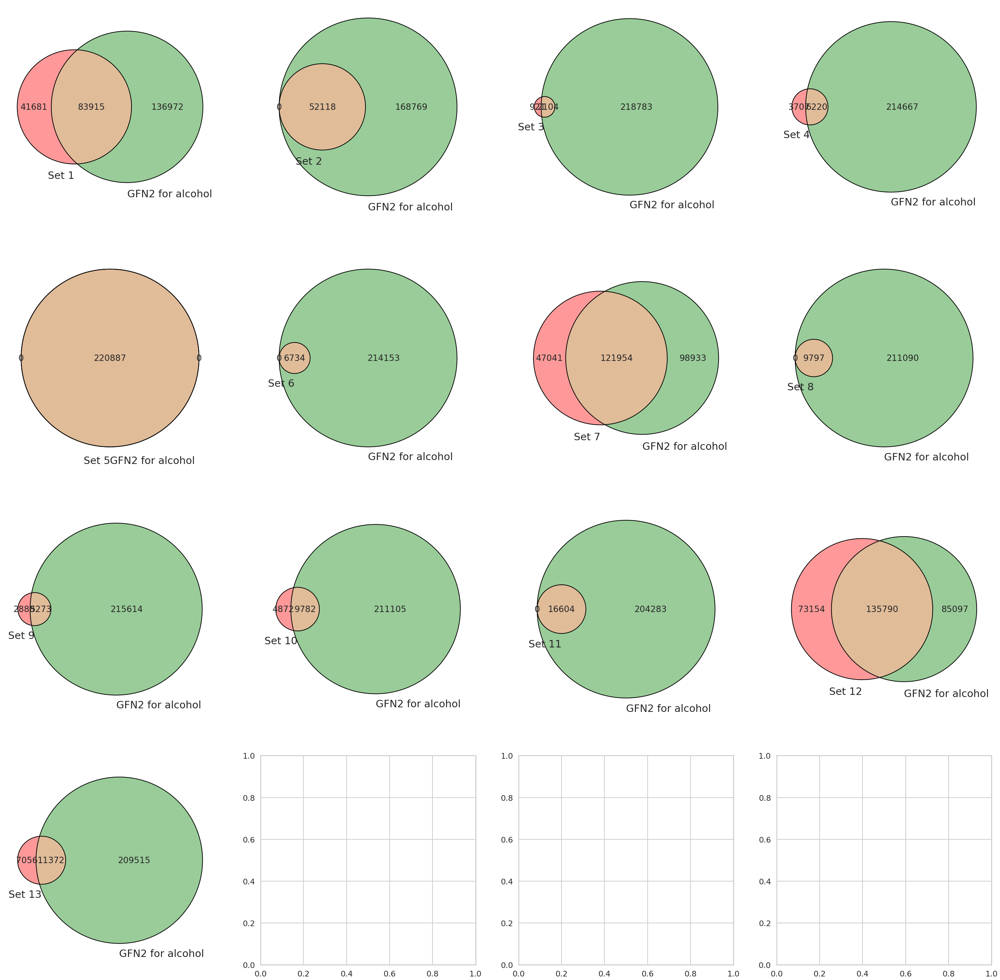

In [ ]:
# compare across gap value

# Find the intersection (overlap)
sets = [set(amide_df['GFN2_HOMO_LUMO_GAP']),
        set(carboxy_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonyl_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonamide_df['GFN2_HOMO_LUMO_GAP']),
        set(alcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylate_df['GFN2_HOMO_LUMO_GAP']),
        set(aldehyde_df['GFN2_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylamide_df['GFN2_HOMO_LUMO_GAP']),
        set(carbamate_df['GFN2_HOMO_LUMO_GAP']),
        set(allamide_df['GFN2_HOMO_LUMO_GAP']),
        set(amide_NH2_df['GFN2_HOMO_LUMO_GAP'])]

# visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set_column5], set_labels=('Set ' + str(index + 1), 'GFN2 for alcohol'), ax=axes[i, j])
            venn2_circles([sets[index], set_column5], ax=axes[i, j])
            
    
# Display the diagram
plt.show()

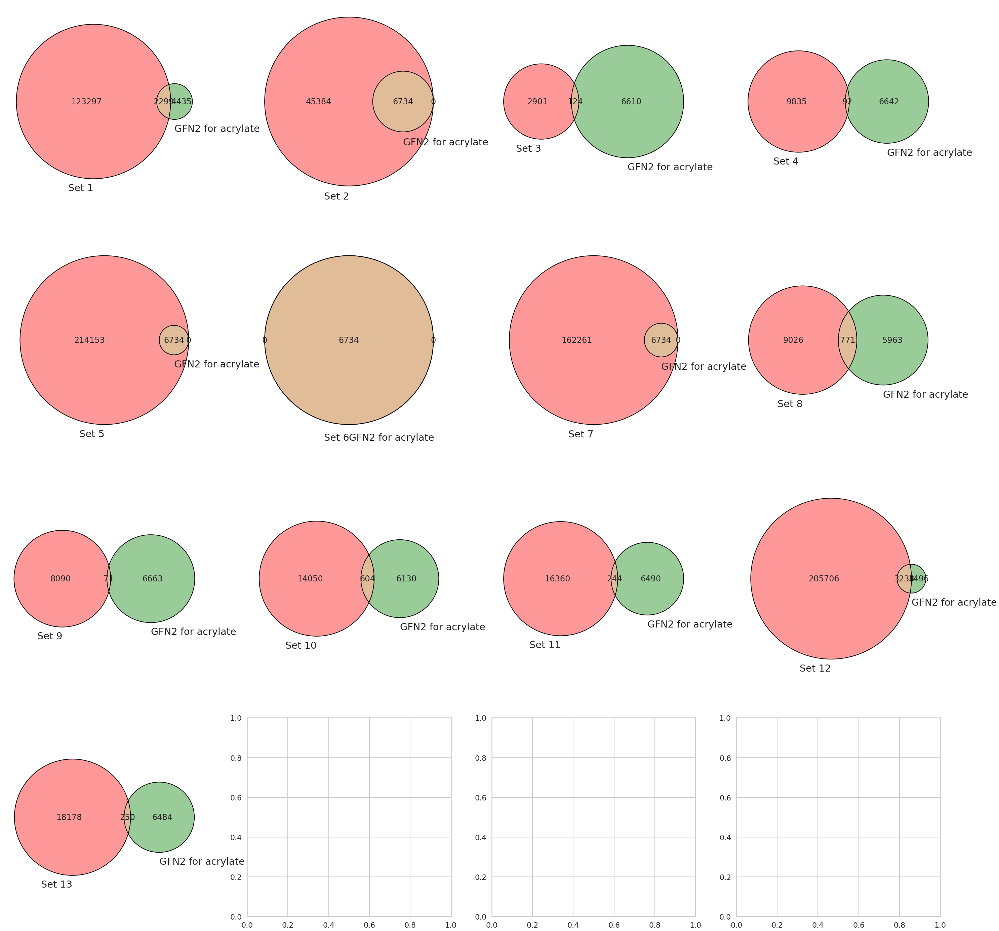

In [ ]:
# compare across gap value

# Find the intersection (overlap)
sets = [set(amide_df['GFN2_HOMO_LUMO_GAP']),
        set(carboxy_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonyl_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonamide_df['GFN2_HOMO_LUMO_GAP']),
        set(alcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylate_df['GFN2_HOMO_LUMO_GAP']),
        set(aldehyde_df['GFN2_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylamide_df['GFN2_HOMO_LUMO_GAP']),
        set(carbamate_df['GFN2_HOMO_LUMO_GAP']),
        set(allamide_df['GFN2_HOMO_LUMO_GAP']),
        set(amide_NH2_df['GFN2_HOMO_LUMO_GAP'])]

# visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set_column6], set_labels=('Set ' + str(index + 1), 'GFN2 for acrylate'), ax=axes[i, j])
            venn2_circles([sets[index], set_column6], ax=axes[i, j])
            
    
# Display the diagram
plt.show()

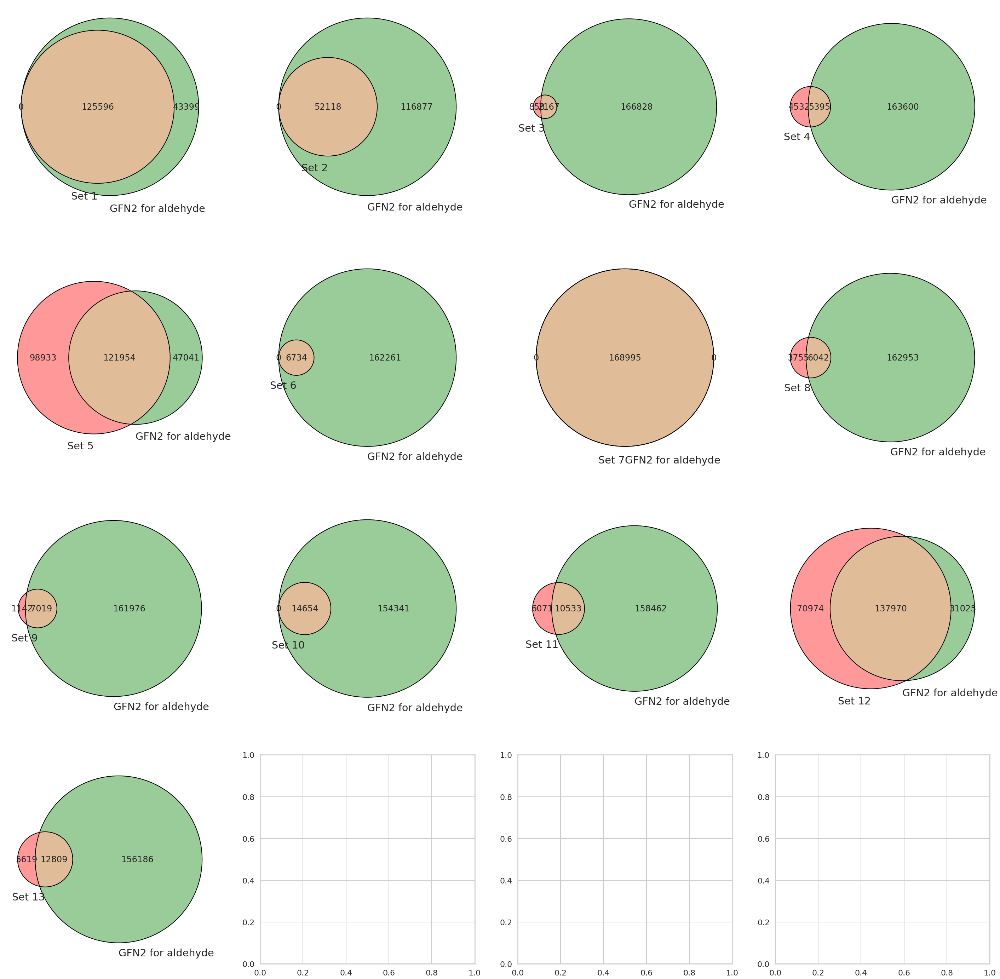

In [ ]:
# compare across gap value

# Find the intersection (overlap)
sets = [set(amide_df['GFN2_HOMO_LUMO_GAP']),
        set(carboxy_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonyl_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonamide_df['GFN2_HOMO_LUMO_GAP']),
        set(alcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylate_df['GFN2_HOMO_LUMO_GAP']),
        set(aldehyde_df['GFN2_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylamide_df['GFN2_HOMO_LUMO_GAP']),
        set(carbamate_df['GFN2_HOMO_LUMO_GAP']),
        set(allamide_df['GFN2_HOMO_LUMO_GAP']),
        set(amide_NH2_df['GFN2_HOMO_LUMO_GAP'])]

# visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set_column7], set_labels=('Set ' + str(index + 1), 'GFN2 for aldehyde'), ax=axes[i, j])
            venn2_circles([sets[index], set_column7], ax=axes[i, j])
            
    
# Display the diagram
plt.show()

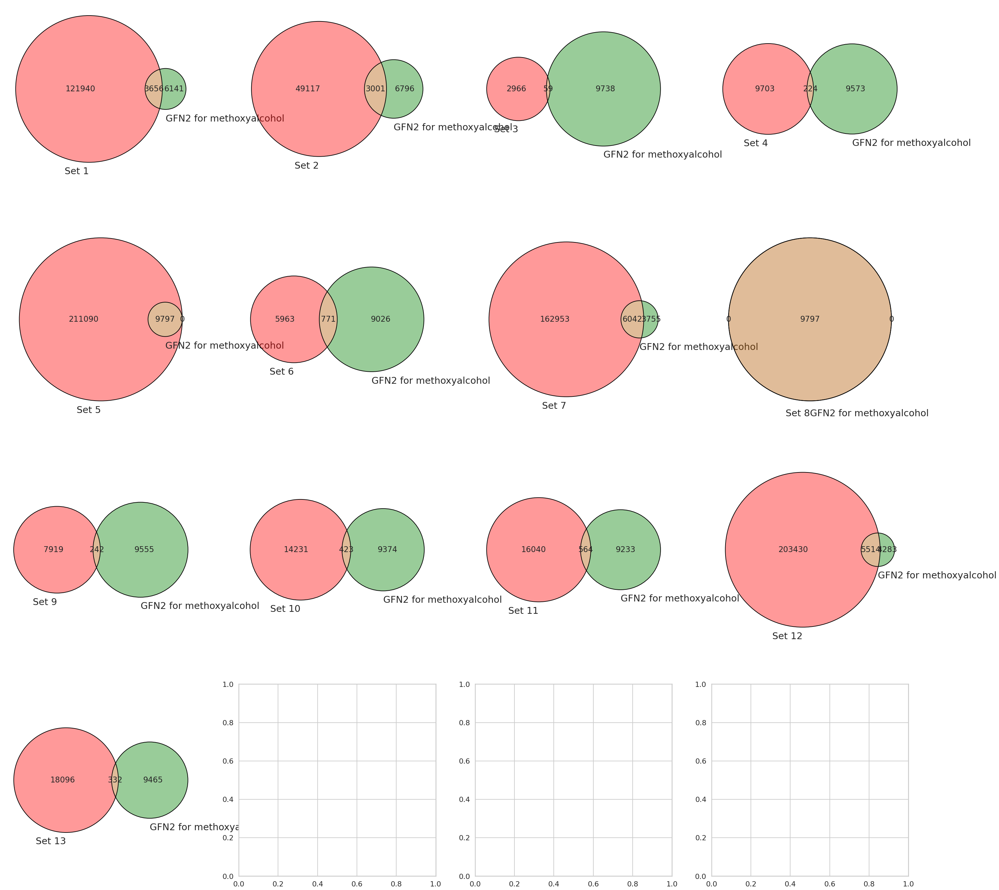

In [ ]:
# compare across gap value

# Find the intersection (overlap)
sets = [set(amide_df['GFN2_HOMO_LUMO_GAP']),
        set(carboxy_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonyl_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonamide_df['GFN2_HOMO_LUMO_GAP']),
        set(alcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylate_df['GFN2_HOMO_LUMO_GAP']),
        set(aldehyde_df['GFN2_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylamide_df['GFN2_HOMO_LUMO_GAP']),
        set(carbamate_df['GFN2_HOMO_LUMO_GAP']),
        set(allamide_df['GFN2_HOMO_LUMO_GAP']),
        set(amide_NH2_df['GFN2_HOMO_LUMO_GAP'])]

# visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set_column8], set_labels=('Set ' + str(index + 1), 'GFN2 for methoxyalcohol'), ax=axes[i, j])
            venn2_circles([sets[index], set_column8], ax=axes[i, j])
            
    
# Display the diagram
plt.show()

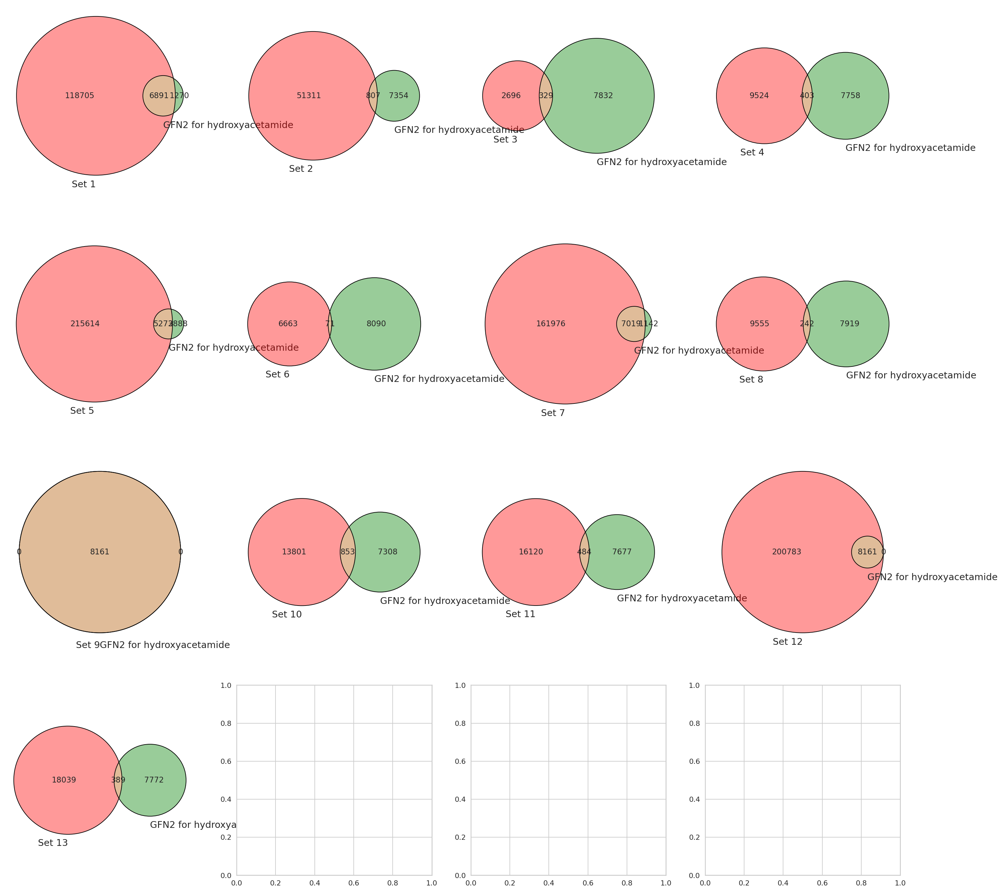

In [ ]:
# compare across gap value

# Find the intersection (overlap)
sets = [set(amide_df['GFN2_HOMO_LUMO_GAP']),
        set(carboxy_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonyl_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonamide_df['GFN2_HOMO_LUMO_GAP']),
        set(alcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylate_df['GFN2_HOMO_LUMO_GAP']),
        set(aldehyde_df['GFN2_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylamide_df['GFN2_HOMO_LUMO_GAP']),
        set(carbamate_df['GFN2_HOMO_LUMO_GAP']),
        set(allamide_df['GFN2_HOMO_LUMO_GAP']),
        set(amide_NH2_df['GFN2_HOMO_LUMO_GAP'])]

# visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set_column9], set_labels=('Set ' + str(index + 1), 'GFN2 for hydroxyacetamide'), ax=axes[i, j])
            venn2_circles([sets[index], set_column9], ax=axes[i, j])
            
    
# Display the diagram
plt.show()

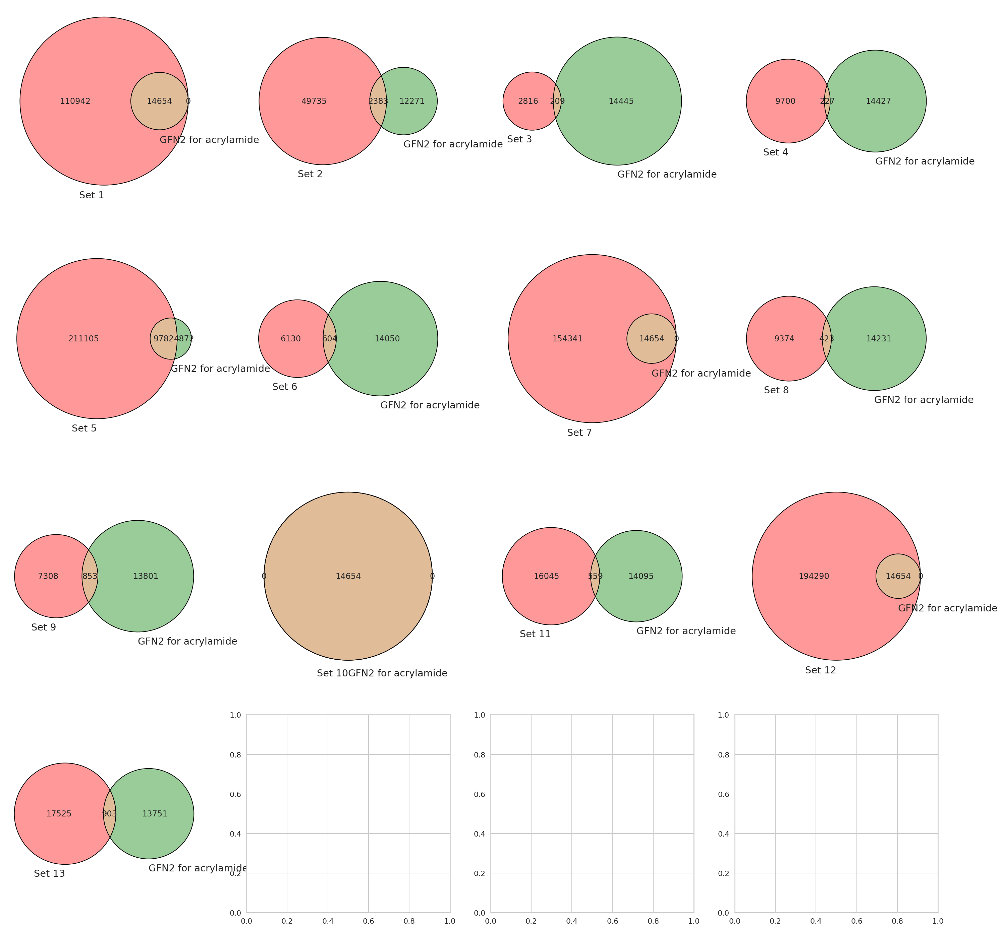

In [ ]:
# compare across gap value

# Find the intersection (overlap)
sets = [set(amide_df['GFN2_HOMO_LUMO_GAP']),
        set(carboxy_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonyl_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonamide_df['GFN2_HOMO_LUMO_GAP']),
        set(alcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylate_df['GFN2_HOMO_LUMO_GAP']),
        set(aldehyde_df['GFN2_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylamide_df['GFN2_HOMO_LUMO_GAP']),
        set(carbamate_df['GFN2_HOMO_LUMO_GAP']),
        set(allamide_df['GFN2_HOMO_LUMO_GAP']),
        set(amide_NH2_df['GFN2_HOMO_LUMO_GAP'])]

# visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set_column10], set_labels=('Set ' + str(index + 1), 'GFN2 for acrylamide'), ax=axes[i, j])
            venn2_circles([sets[index], set_column10], ax=axes[i, j])
            
    
# Display the diagram
plt.show()

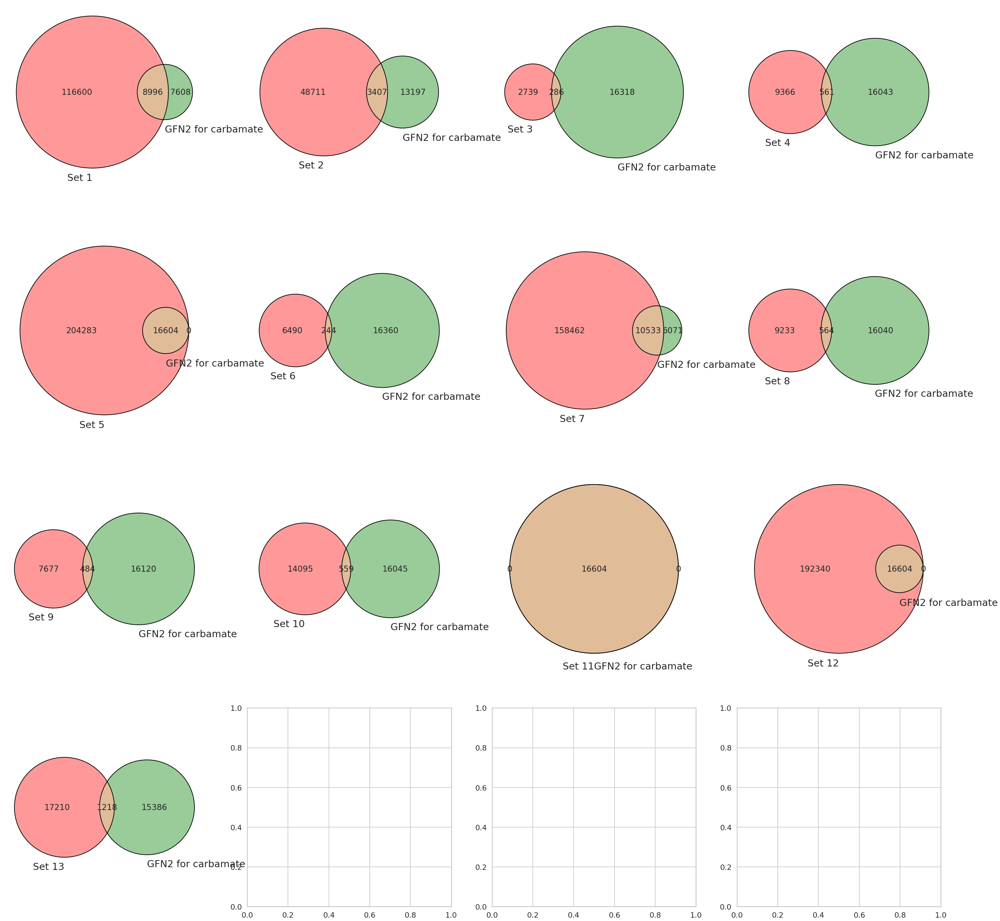

In [ ]:
# compare across gap value

# Find the intersection (overlap)
sets = [set(amide_df['GFN2_HOMO_LUMO_GAP']),
        set(carboxy_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonyl_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonamide_df['GFN2_HOMO_LUMO_GAP']),
        set(alcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylate_df['GFN2_HOMO_LUMO_GAP']),
        set(aldehyde_df['GFN2_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylamide_df['GFN2_HOMO_LUMO_GAP']),
        set(carbamate_df['GFN2_HOMO_LUMO_GAP']),
        set(allamide_df['GFN2_HOMO_LUMO_GAP']),
        set(amide_NH2_df['GFN2_HOMO_LUMO_GAP'])]

# visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set_column11], set_labels=('Set ' + str(index + 1), 'GFN2 for carbamate'), ax=axes[i, j])
            venn2_circles([sets[index], set_column11], ax=axes[i, j])
            
    
# Display the diagram
plt.show()

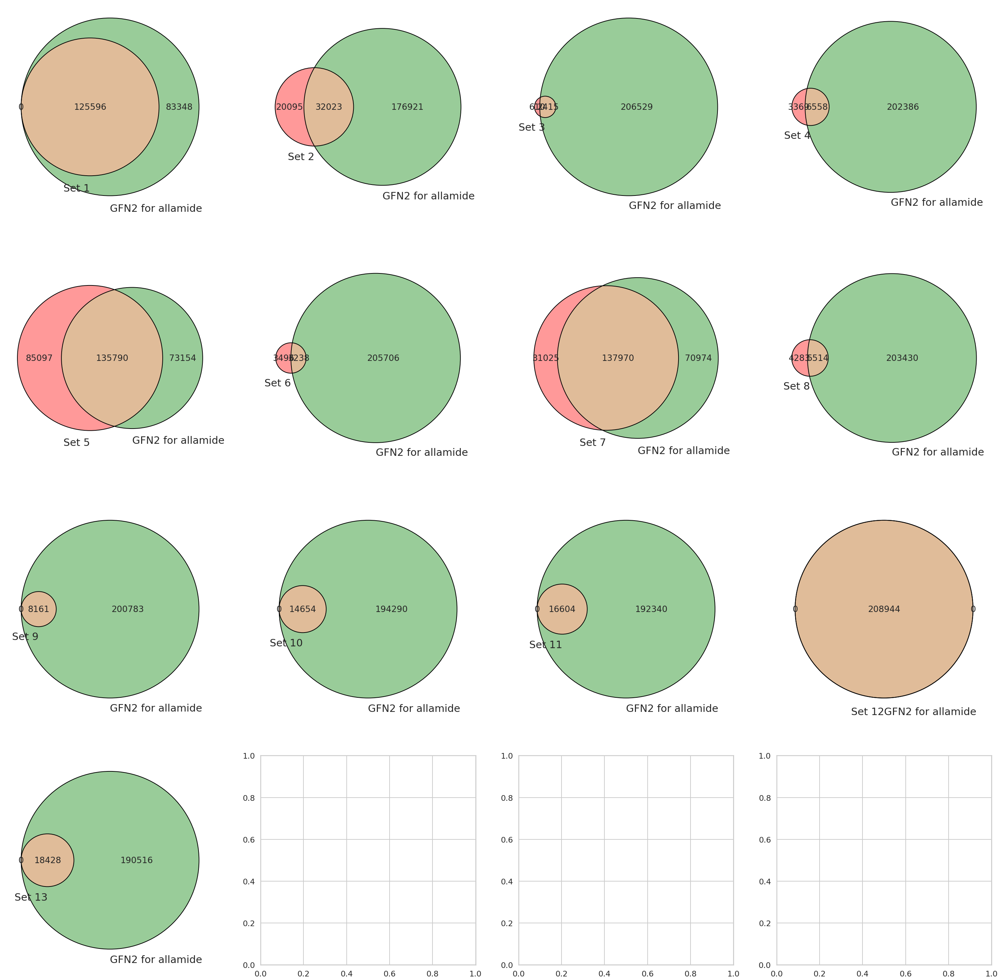

In [ ]:
# compare across gap value

# Find the intersection (overlap)
sets = [set(amide_df['GFN2_HOMO_LUMO_GAP']),
        set(carboxy_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonyl_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonamide_df['GFN2_HOMO_LUMO_GAP']),
        set(alcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylate_df['GFN2_HOMO_LUMO_GAP']),
        set(aldehyde_df['GFN2_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylamide_df['GFN2_HOMO_LUMO_GAP']),
        set(carbamate_df['GFN2_HOMO_LUMO_GAP']),
        set(allamide_df['GFN2_HOMO_LUMO_GAP']),
        set(amide_NH2_df['GFN2_HOMO_LUMO_GAP'])]

# visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set_column12], set_labels=('Set ' + str(index + 1), 'GFN2 for allamide'), ax=axes[i, j])
            venn2_circles([sets[index], set_column12], ax=axes[i, j])
            
    
# Display the diagram
plt.show()

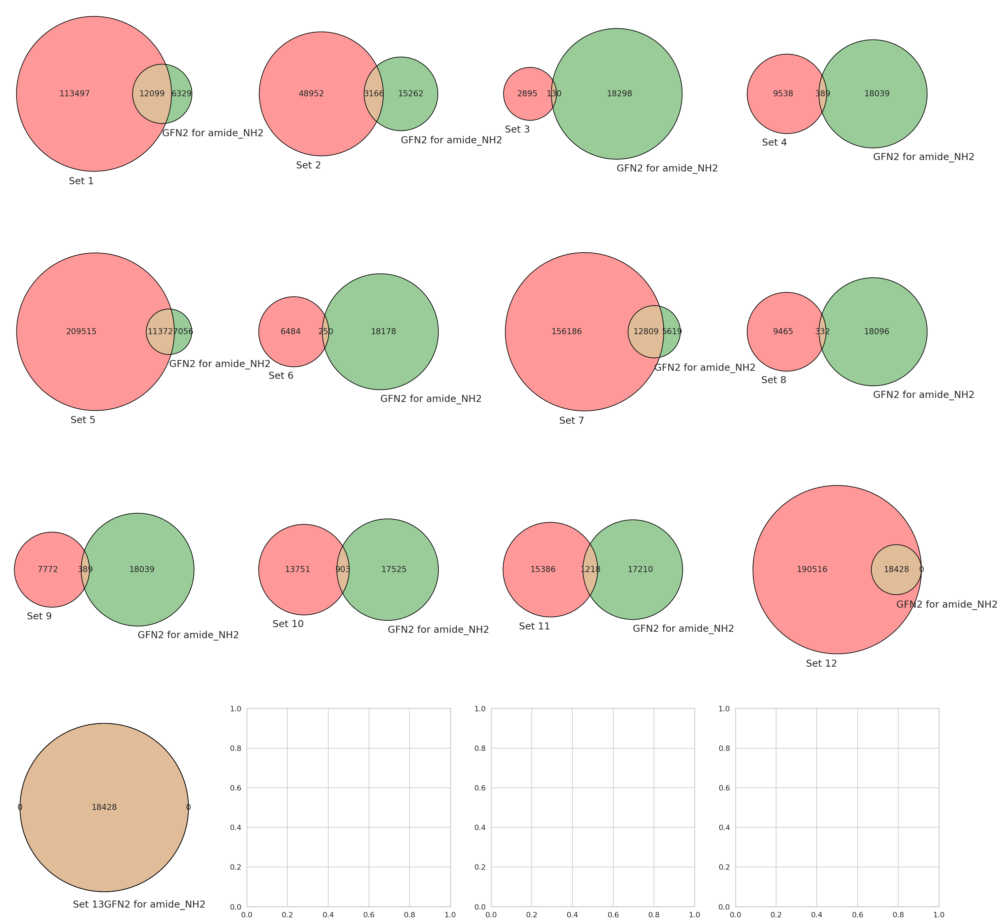

In [ ]:
# compare across gap value

# Find the intersection (overlap)
sets = [set(amide_df['GFN2_HOMO_LUMO_GAP']),
        set(carboxy_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonyl_df['GFN2_HOMO_LUMO_GAP']),
        set(sulfonamide_df['GFN2_HOMO_LUMO_GAP']),
        set(alcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylate_df['GFN2_HOMO_LUMO_GAP']),
        set(aldehyde_df['GFN2_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['GFN2_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['GFN2_HOMO_LUMO_GAP']),
        set(acrylamide_df['GFN2_HOMO_LUMO_GAP']),
        set(carbamate_df['GFN2_HOMO_LUMO_GAP']),
        set(allamide_df['GFN2_HOMO_LUMO_GAP']),
        set(amide_NH2_df['GFN2_HOMO_LUMO_GAP'])]

# visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set_column13], set_labels=('Set ' + str(index + 1), 'GFN2 for amide_NH2'), ax=axes[i, j])
            venn2_circles([sets[index], set_column13], ax=axes[i, j])
            
    
# Display the diagram
plt.show()

### Overlaps of DFT_HOMO_LUMO_GAP

In [ ]:
set1_column1 = set(amide_df['DFT_HOMO_LUMO_GAP'])
set1_column2 = set(carboxy_df['DFT_HOMO_LUMO_GAP'])
set1_column3 = set(sulfonyl_df['DFT_HOMO_LUMO_GAP'])
set1_column4 = set(sulfonamide_df['DFT_HOMO_LUMO_GAP'])
set1_column5 = set(alcohol_df['DFT_HOMO_LUMO_GAP'])
set1_column6 = set(acrylate_df['DFT_HOMO_LUMO_GAP'])
set1_column7 = set(aldehyde_df['DFT_HOMO_LUMO_GAP'])
set1_column8 = set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP'])
set1_column9 = set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP'])
set1_column10 = set(acrylamide_df['DFT_HOMO_LUMO_GAP'])
set1_column11 = set(carbamate_df['DFT_HOMO_LUMO_GAP'])
set1_column12 = set(allamide_df['DFT_HOMO_LUMO_GAP'])
set1_column13 = set(amide_NH2_df ['DFT_HOMO_LUMO_GAP'])

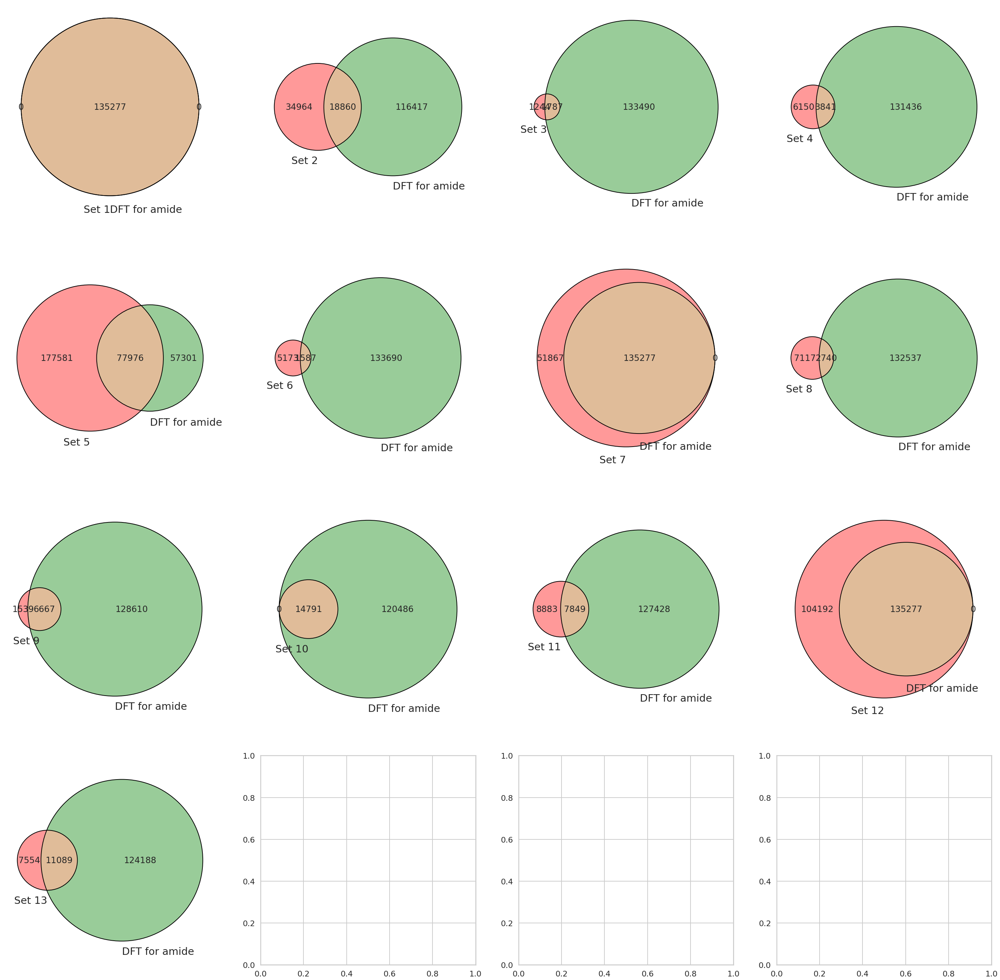

In [ ]:
# Find the intersection (overlap)
sets = [set(amide_df['DFT_HOMO_LUMO_GAP']),
        set(carboxy_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonyl_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonamide_df['DFT_HOMO_LUMO_GAP']),
        set(alcohol_df['DFT_HOMO_LUMO_GAP']),
        set(acrylate_df['DFT_HOMO_LUMO_GAP']),
        set(aldehyde_df['DFT_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP']),
        set(acrylamide_df['DFT_HOMO_LUMO_GAP']),
        set(carbamate_df['DFT_HOMO_LUMO_GAP']),
        set(allamide_df['DFT_HOMO_LUMO_GAP']),
        set(amide_NH2_df['DFT_HOMO_LUMO_GAP'])]

# Visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set1_column1], set_labels=('Set ' + str(index + 1), 'DFT for amide'), ax=axes[i, j])
            venn2_circles([sets[index], set1_column1], ax=axes[i, j])

# Display the diagram
plt.show()


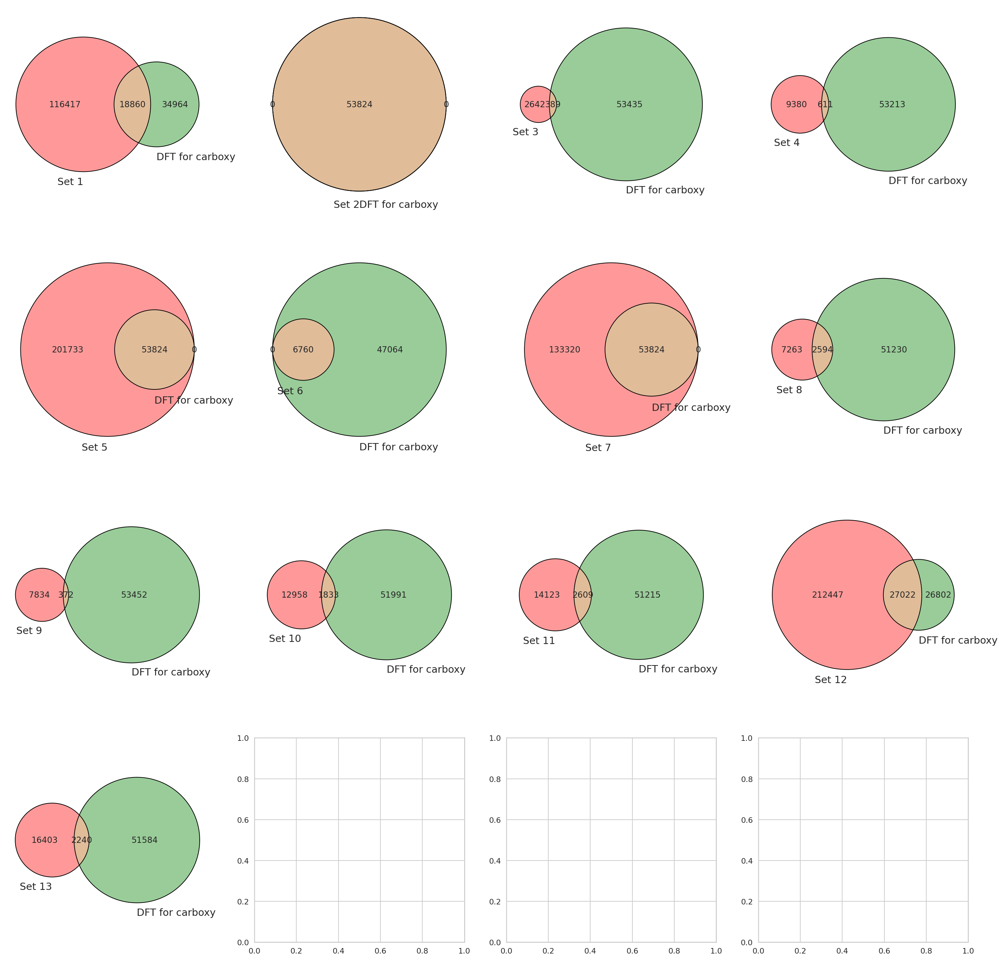

In [ ]:
# Find the intersection (overlap)
sets = [set(amide_df['DFT_HOMO_LUMO_GAP']),
        set(carboxy_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonyl_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonamide_df['DFT_HOMO_LUMO_GAP']),
        set(alcohol_df['DFT_HOMO_LUMO_GAP']),
        set(acrylate_df['DFT_HOMO_LUMO_GAP']),
        set(aldehyde_df['DFT_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP']),
        set(acrylamide_df['DFT_HOMO_LUMO_GAP']),
        set(carbamate_df['DFT_HOMO_LUMO_GAP']),
        set(allamide_df['DFT_HOMO_LUMO_GAP']),
        set(amide_NH2_df['DFT_HOMO_LUMO_GAP'])]

# Visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set1_column2], set_labels=('Set ' + str(index + 1), 'DFT for carboxy'), ax=axes[i, j])
            venn2_circles([sets[index], set1_column2], ax=axes[i, j])

# Display the diagram
plt.show()

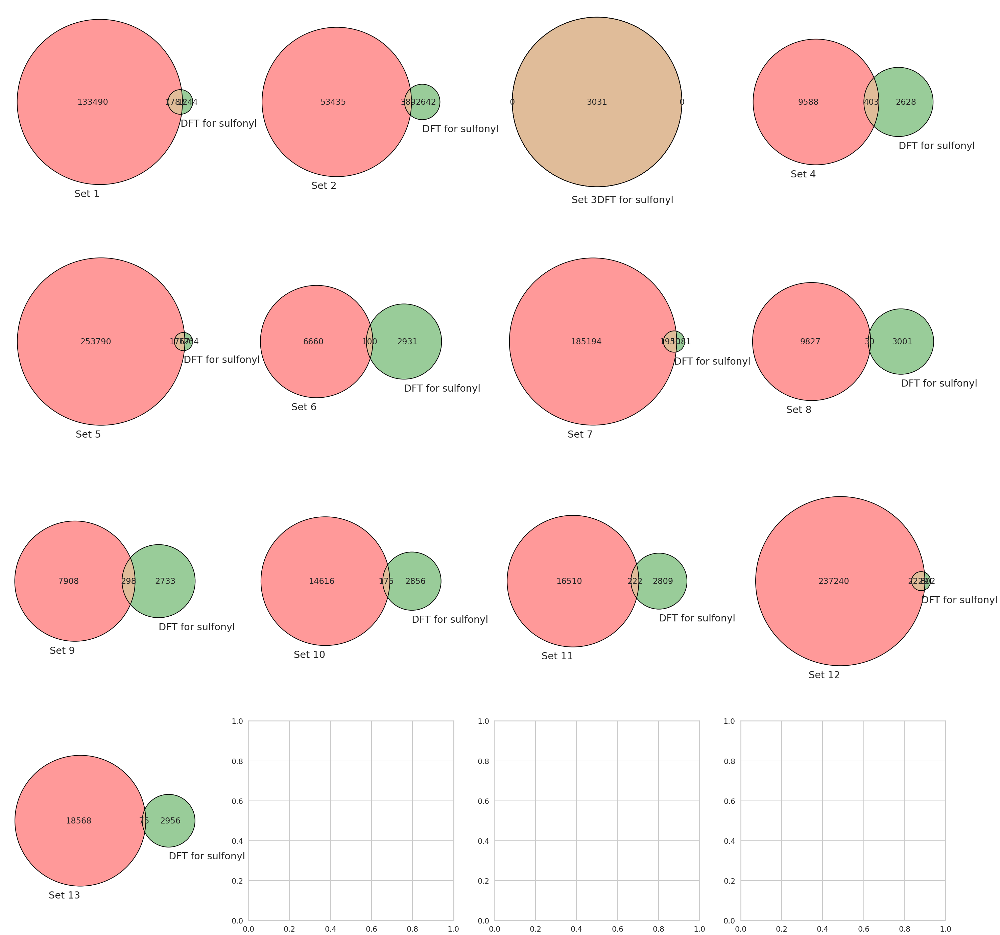

In [ ]:
# Find the intersection (overlap)
sets = [set(amide_df['DFT_HOMO_LUMO_GAP']),
        set(carboxy_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonyl_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonamide_df['DFT_HOMO_LUMO_GAP']),
        set(alcohol_df['DFT_HOMO_LUMO_GAP']),
        set(acrylate_df['DFT_HOMO_LUMO_GAP']),
        set(aldehyde_df['DFT_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP']),
        set(acrylamide_df['DFT_HOMO_LUMO_GAP']),
        set(carbamate_df['DFT_HOMO_LUMO_GAP']),
        set(allamide_df['DFT_HOMO_LUMO_GAP']),
        set(amide_NH2_df['DFT_HOMO_LUMO_GAP'])]

# Visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set1_column3], set_labels=('Set ' + str(index + 1), 'DFT for sulfonyl'), ax=axes[i, j])
            venn2_circles([sets[index], set1_column3], ax=axes[i, j])

# Display the diagram
plt.show()

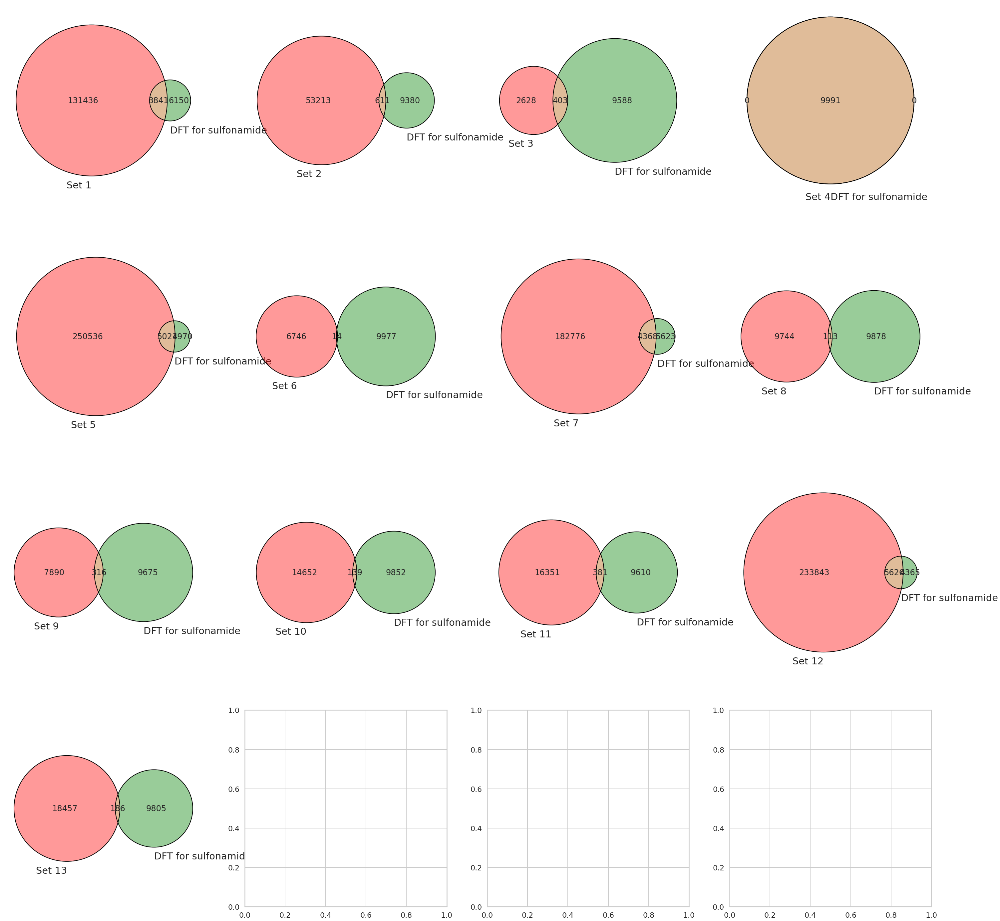

In [ ]:
# Find the intersection (overlap)
sets = [set(amide_df['DFT_HOMO_LUMO_GAP']),
        set(carboxy_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonyl_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonamide_df['DFT_HOMO_LUMO_GAP']),
        set(alcohol_df['DFT_HOMO_LUMO_GAP']),
        set(acrylate_df['DFT_HOMO_LUMO_GAP']),
        set(aldehyde_df['DFT_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP']),
        set(acrylamide_df['DFT_HOMO_LUMO_GAP']),
        set(carbamate_df['DFT_HOMO_LUMO_GAP']),
        set(allamide_df['DFT_HOMO_LUMO_GAP']),
        set(amide_NH2_df['DFT_HOMO_LUMO_GAP'])]

# Visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set1_column4], set_labels=('Set ' + str(index + 1), 'DFT for sulfonamide'), ax=axes[i, j])
            venn2_circles([sets[index], set1_column4], ax=axes[i, j])

# Display the diagram
plt.show()

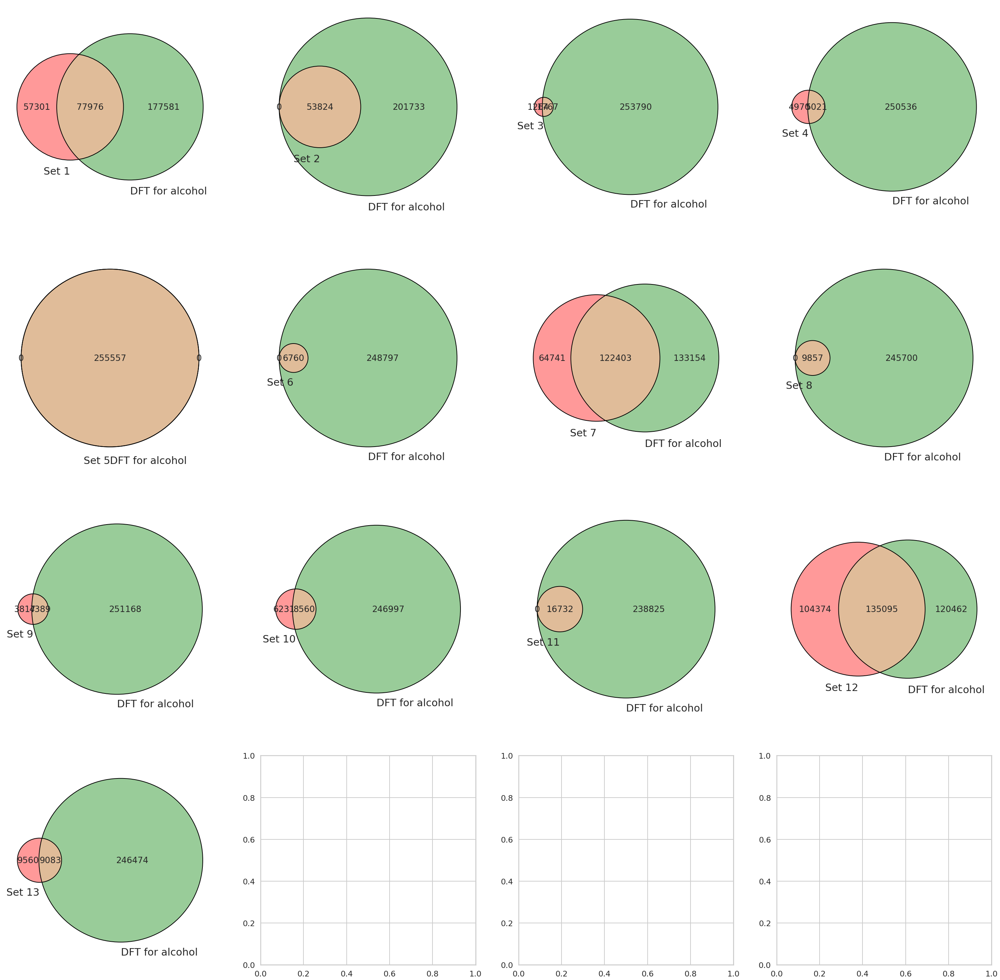

In [ ]:
# Find the intersection (overlap)
sets = [set(amide_df['DFT_HOMO_LUMO_GAP']),
        set(carboxy_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonyl_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonamide_df['DFT_HOMO_LUMO_GAP']),
        set(alcohol_df['DFT_HOMO_LUMO_GAP']),
        set(acrylate_df['DFT_HOMO_LUMO_GAP']),
        set(aldehyde_df['DFT_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP']),
        set(acrylamide_df['DFT_HOMO_LUMO_GAP']),
        set(carbamate_df['DFT_HOMO_LUMO_GAP']),
        set(allamide_df['DFT_HOMO_LUMO_GAP']),
        set(amide_NH2_df['DFT_HOMO_LUMO_GAP'])]

# Visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set1_column5], set_labels=('Set ' + str(index + 1), 'DFT for alcohol'), ax=axes[i, j])
            venn2_circles([sets[index], set1_column5], ax=axes[i, j])

# Display the diagram
plt.show()

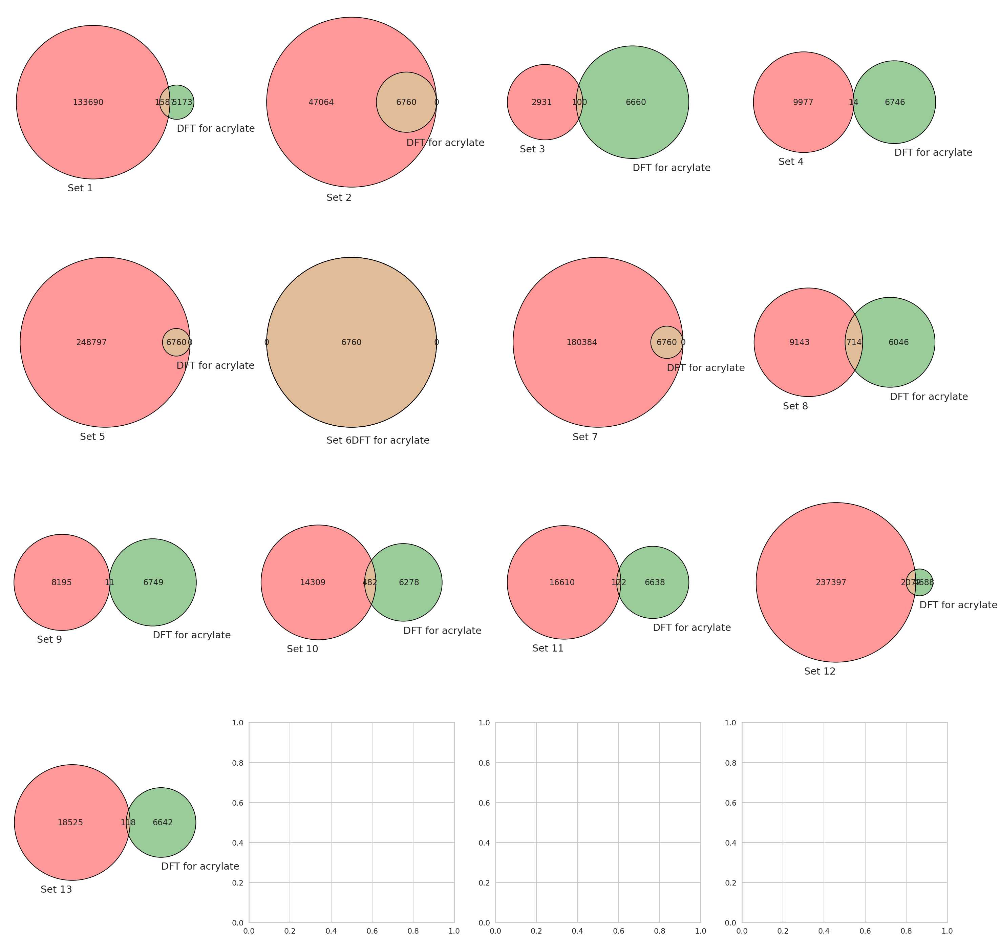

In [ ]:
# Find the intersection (overlap)
sets = [set(amide_df['DFT_HOMO_LUMO_GAP']),
        set(carboxy_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonyl_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonamide_df['DFT_HOMO_LUMO_GAP']),
        set(alcohol_df['DFT_HOMO_LUMO_GAP']),
        set(acrylate_df['DFT_HOMO_LUMO_GAP']),
        set(aldehyde_df['DFT_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP']),
        set(acrylamide_df['DFT_HOMO_LUMO_GAP']),
        set(carbamate_df['DFT_HOMO_LUMO_GAP']),
        set(allamide_df['DFT_HOMO_LUMO_GAP']),
        set(amide_NH2_df['DFT_HOMO_LUMO_GAP'])]

# Visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set1_column6], set_labels=('Set ' + str(index + 1), 'DFT for acrylate'), ax=axes[i, j])
            venn2_circles([sets[index], set1_column6], ax=axes[i, j])

# Display the diagram
plt.show()

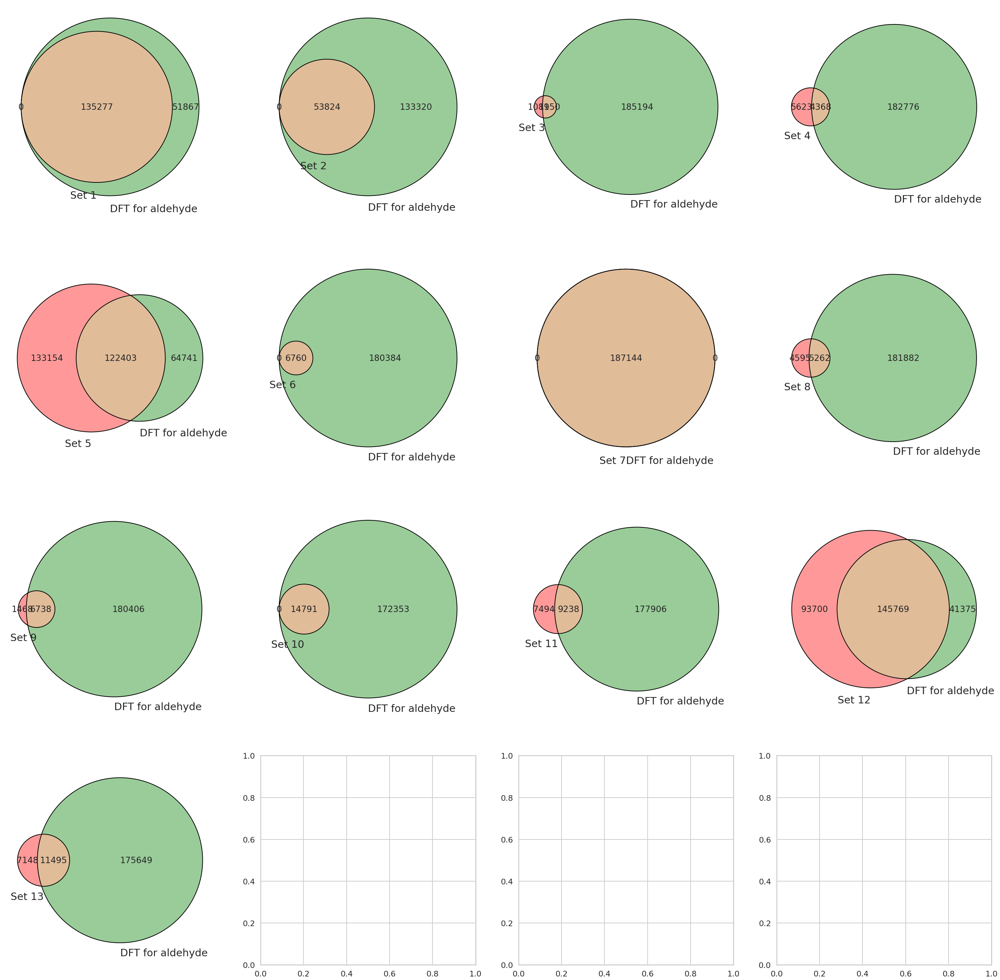

In [ ]:
# Find the intersection (overlap)
sets = [set(amide_df['DFT_HOMO_LUMO_GAP']),
        set(carboxy_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonyl_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonamide_df['DFT_HOMO_LUMO_GAP']),
        set(alcohol_df['DFT_HOMO_LUMO_GAP']),
        set(acrylate_df['DFT_HOMO_LUMO_GAP']),
        set(aldehyde_df['DFT_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP']),
        set(acrylamide_df['DFT_HOMO_LUMO_GAP']),
        set(carbamate_df['DFT_HOMO_LUMO_GAP']),
        set(allamide_df['DFT_HOMO_LUMO_GAP']),
        set(amide_NH2_df['DFT_HOMO_LUMO_GAP'])]

# Visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set1_column7], set_labels=('Set ' + str(index + 1), 'DFT for aldehyde'), ax=axes[i, j])
            venn2_circles([sets[index], set1_column7], ax=axes[i, j])

# Display the diagram
plt.show()

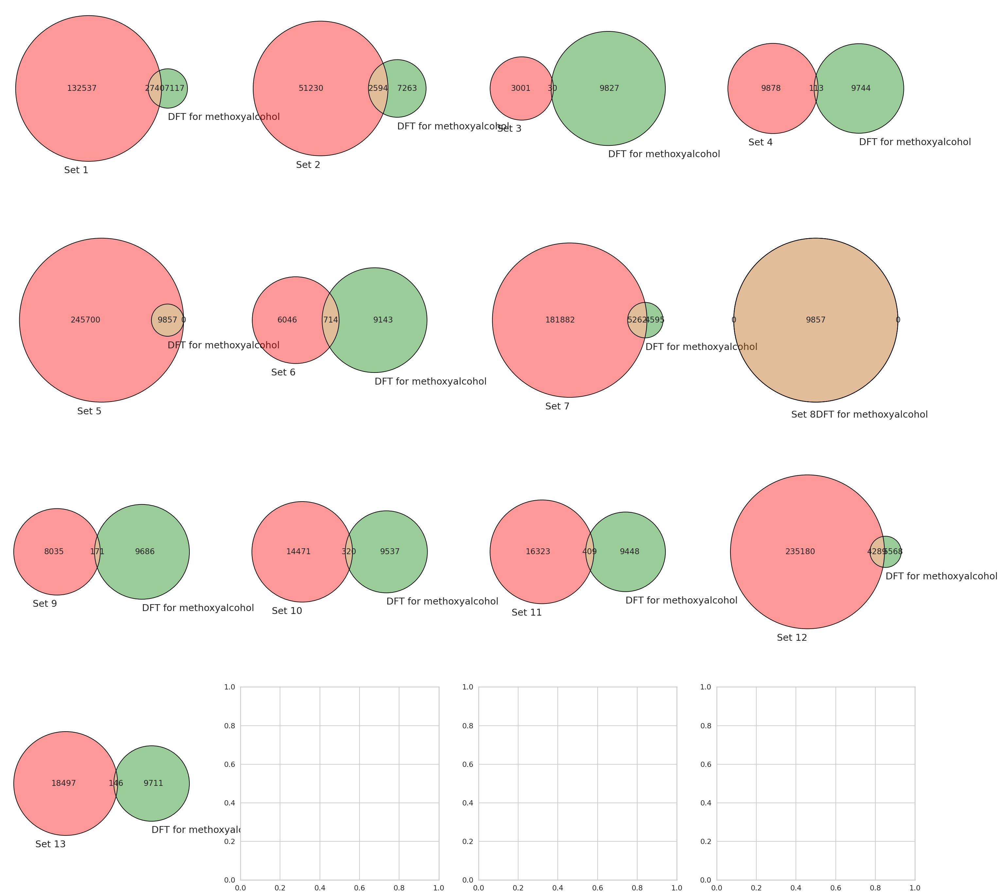

In [ ]:
# Find the intersection (overlap)
sets = [set(amide_df['DFT_HOMO_LUMO_GAP']),
        set(carboxy_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonyl_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonamide_df['DFT_HOMO_LUMO_GAP']),
        set(alcohol_df['DFT_HOMO_LUMO_GAP']),
        set(acrylate_df['DFT_HOMO_LUMO_GAP']),
        set(aldehyde_df['DFT_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP']),
        set(acrylamide_df['DFT_HOMO_LUMO_GAP']),
        set(carbamate_df['DFT_HOMO_LUMO_GAP']),
        set(allamide_df['DFT_HOMO_LUMO_GAP']),
        set(amide_NH2_df['DFT_HOMO_LUMO_GAP'])]

# Visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set1_column8], set_labels=('Set ' + str(index + 1), 'DFT for methoxyalcohol'), ax=axes[i, j])
            venn2_circles([sets[index], set1_column8], ax=axes[i, j])

# Display the diagram
plt.show()

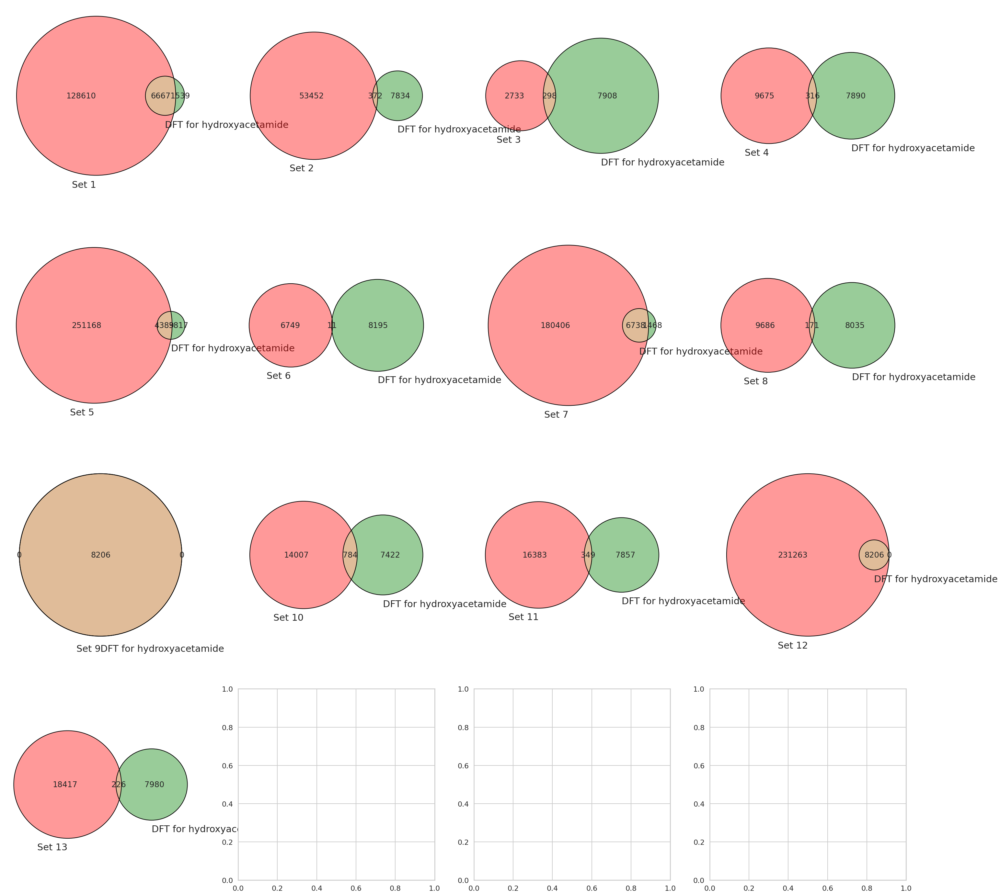

In [ ]:
# Find the intersection (overlap)
sets = [set(amide_df['DFT_HOMO_LUMO_GAP']),
        set(carboxy_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonyl_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonamide_df['DFT_HOMO_LUMO_GAP']),
        set(alcohol_df['DFT_HOMO_LUMO_GAP']),
        set(acrylate_df['DFT_HOMO_LUMO_GAP']),
        set(aldehyde_df['DFT_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP']),
        set(acrylamide_df['DFT_HOMO_LUMO_GAP']),
        set(carbamate_df['DFT_HOMO_LUMO_GAP']),
        set(allamide_df['DFT_HOMO_LUMO_GAP']),
        set(amide_NH2_df['DFT_HOMO_LUMO_GAP'])]

# Visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set1_column9], set_labels=('Set ' + str(index + 1), 'DFT for hydroxyacetamide'), ax=axes[i, j])
            venn2_circles([sets[index], set1_column9], ax=axes[i, j])

# Display the diagram
plt.show()

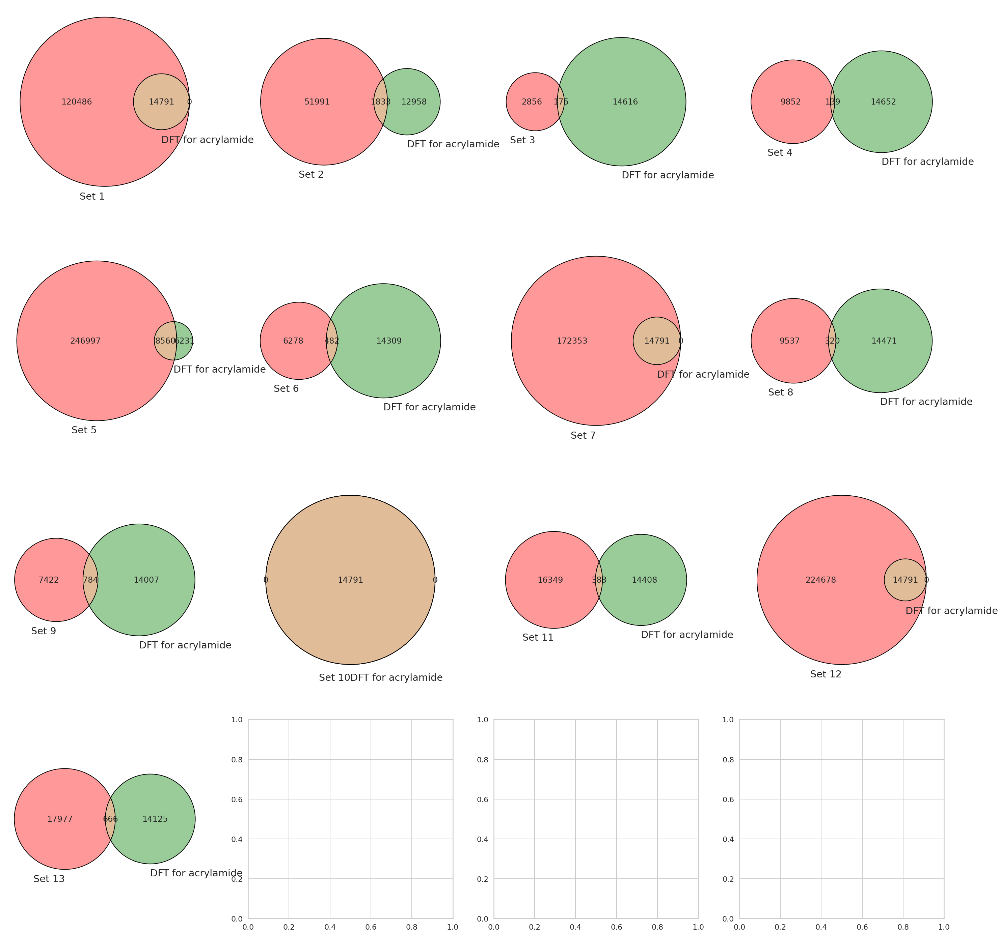

In [ ]:
# Find the intersection (overlap)
sets = [set(amide_df['DFT_HOMO_LUMO_GAP']),
        set(carboxy_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonyl_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonamide_df['DFT_HOMO_LUMO_GAP']),
        set(alcohol_df['DFT_HOMO_LUMO_GAP']),
        set(acrylate_df['DFT_HOMO_LUMO_GAP']),
        set(aldehyde_df['DFT_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP']),
        set(acrylamide_df['DFT_HOMO_LUMO_GAP']),
        set(carbamate_df['DFT_HOMO_LUMO_GAP']),
        set(allamide_df['DFT_HOMO_LUMO_GAP']),
        set(amide_NH2_df['DFT_HOMO_LUMO_GAP'])]

# Visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set1_column10], set_labels=('Set ' + str(index + 1), 'DFT for acrylamide'), ax=axes[i, j])
            venn2_circles([sets[index], set1_column10], ax=axes[i, j])

# Display the diagram
plt.show()

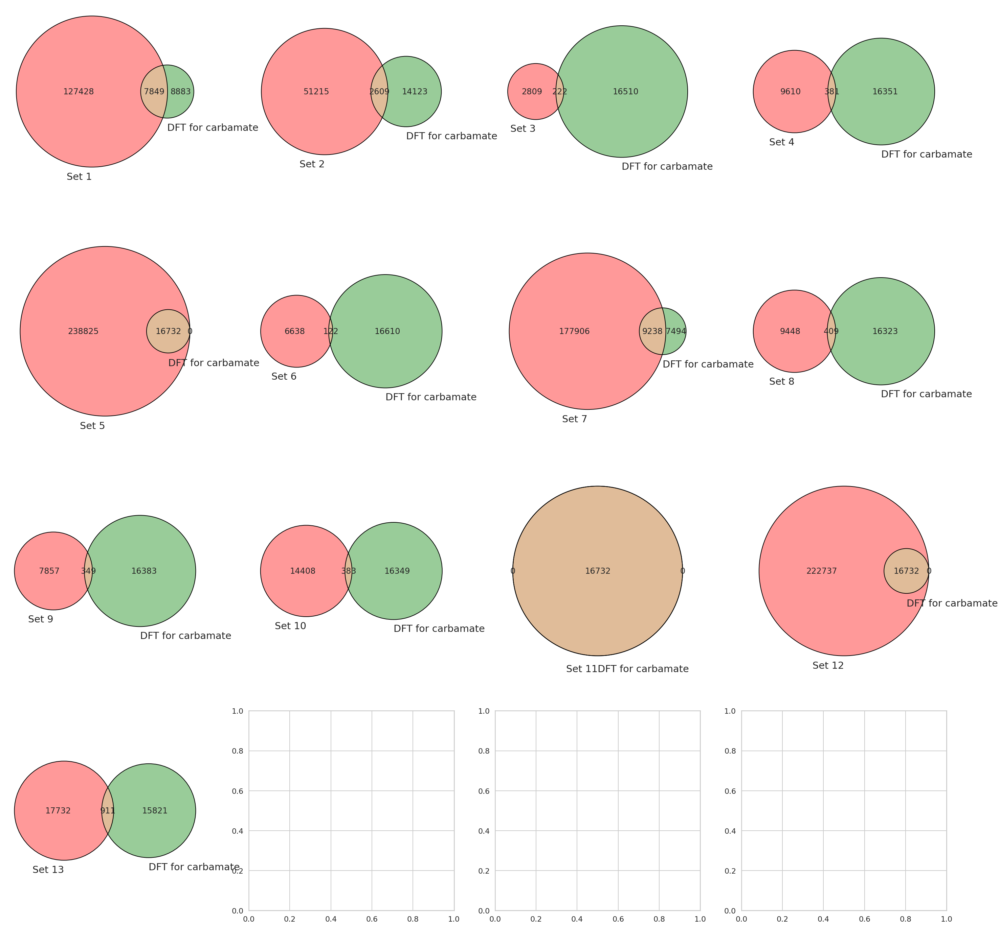

In [ ]:
# Find the intersection (overlap)
sets = [set(amide_df['DFT_HOMO_LUMO_GAP']),
        set(carboxy_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonyl_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonamide_df['DFT_HOMO_LUMO_GAP']),
        set(alcohol_df['DFT_HOMO_LUMO_GAP']),
        set(acrylate_df['DFT_HOMO_LUMO_GAP']),
        set(aldehyde_df['DFT_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP']),
        set(acrylamide_df['DFT_HOMO_LUMO_GAP']),
        set(carbamate_df['DFT_HOMO_LUMO_GAP']),
        set(allamide_df['DFT_HOMO_LUMO_GAP']),
        set(amide_NH2_df['DFT_HOMO_LUMO_GAP'])]

# Visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set1_column11], set_labels=('Set ' + str(index + 1), 'DFT for carbamate'), ax=axes[i, j])
            venn2_circles([sets[index], set1_column11], ax=axes[i, j])

# Display the diagram
plt.show()

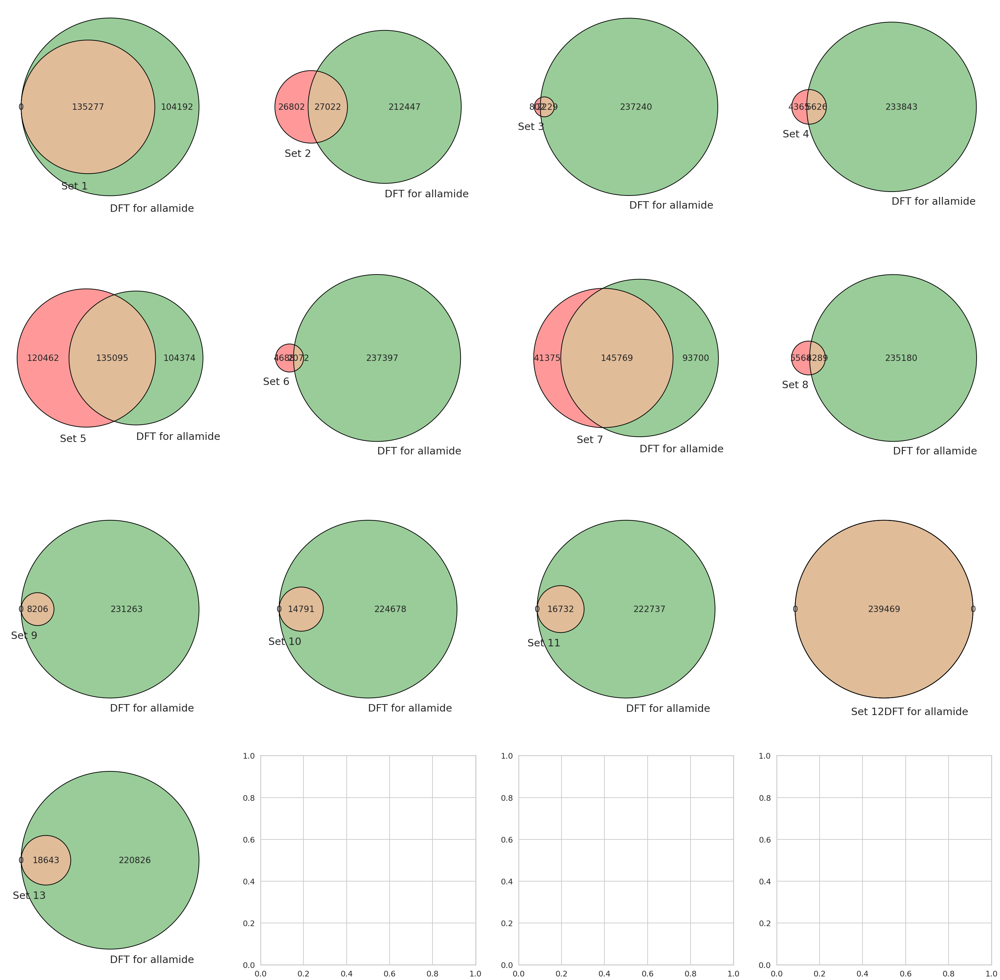

In [ ]:
# Find the intersection (overlap)
sets = [set(amide_df['DFT_HOMO_LUMO_GAP']),
        set(carboxy_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonyl_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonamide_df['DFT_HOMO_LUMO_GAP']),
        set(alcohol_df['DFT_HOMO_LUMO_GAP']),
        set(acrylate_df['DFT_HOMO_LUMO_GAP']),
        set(aldehyde_df['DFT_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP']),
        set(acrylamide_df['DFT_HOMO_LUMO_GAP']),
        set(carbamate_df['DFT_HOMO_LUMO_GAP']),
        set(allamide_df['DFT_HOMO_LUMO_GAP']),
        set(amide_NH2_df['DFT_HOMO_LUMO_GAP'])]

# Visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set1_column12], set_labels=('Set ' + str(index + 1), 'DFT for allamide'), ax=axes[i, j])
            venn2_circles([sets[index], set1_column12], ax=axes[i, j])

# Display the diagram
plt.show()

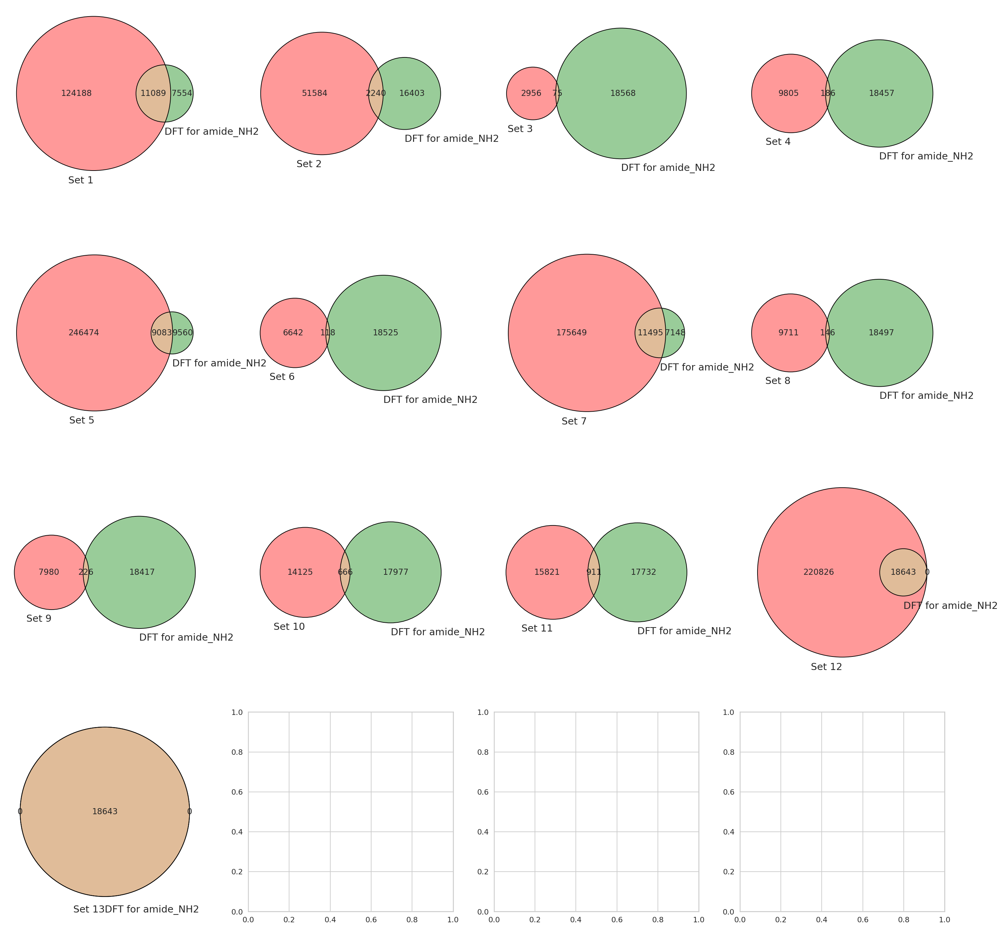

In [ ]:
# Find the intersection (overlap)
sets = [set(amide_df['DFT_HOMO_LUMO_GAP']),
        set(carboxy_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonyl_df['DFT_HOMO_LUMO_GAP']),
        set(sulfonamide_df['DFT_HOMO_LUMO_GAP']),
        set(alcohol_df['DFT_HOMO_LUMO_GAP']),
        set(acrylate_df['DFT_HOMO_LUMO_GAP']),
        set(aldehyde_df['DFT_HOMO_LUMO_GAP']),
        set(methoxyalcohol_df['DFT_HOMO_LUMO_GAP']),
        set(hydroxyacetamide_df['DFT_HOMO_LUMO_GAP']),
        set(acrylamide_df['DFT_HOMO_LUMO_GAP']),
        set(carbamate_df['DFT_HOMO_LUMO_GAP']),
        set(allamide_df['DFT_HOMO_LUMO_GAP']),
        set(amide_NH2_df['DFT_HOMO_LUMO_GAP'])]

# Visualize it
fig, axes = plt.subplots(4, 4, figsize=(50, 50))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        if index < len(sets):
            venn2([sets[index], set1_column13], set_labels=('Set ' + str(index + 1), 'DFT for amide_NH2'), ax=axes[i, j])
            venn2_circles([sets[index], set1_column13], ax=axes[i, j])

# Display the diagram
plt.show()

# Model

## Model Packages

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as numpy
sns.set_context("poster")
sns.set_style("whitegrid")
sns.set_palette("Set2")

import pandas as pd
import os, json, sys, glob, pickle

from atomsci.ddm.pipeline import parameter_parser as parse
from atomsci.ddm.pipeline import perf_data
from atomsci.ddm.pipeline import model_pipeline as mp
import atomsci.ddm.utils.curate_data as curate_data
import atomsci.ddm.utils.struct_utils as struct_utils
from atomsci.ddm.pipeline import perf_plots as pp

/home/jupyter/atomsci/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Skipped loading modules with pytorch-geometric dependency, missing a dependency. No module named 'torch_geometric'
Skipped loading modules with pytorch-geometric dependency, missing a dependency. cannot import name 'DMPNN' from 'deepchem.models.torch_models' (/home/jupyter/atomsci/lib/python3.8/site-packages/deepchem/models/torch_models/__init__.py)
Skipped loading modules with pytorch-lightning dependency, missing a dependency. No module named 'pytorch_lightning'
Skipped loading some Jax models, missing a dependency. jax requires jaxlib to be installed. See https://github.com/google/jax#installation for installation instructions.
2023-12-06 17:00:21,689 Model tracker client not supported in your environment; will save models in filesy

In [51]:
def find_file(file_name, start_path='/'):
    for root, dirs, files in os.walk(start_path):
        if file_name in files:
            return os.path.join(root, file_name)
        
file_path = find_file('select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz', '/')
print(file_path)

/home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz


## Amide

### load amide_df and set wd

In [2]:
test_amide = pd.read_csv('amide_df.csv')
test_amide.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,amides,HA_count
0,CHEMBL100013,CKPLPYKNMZXMFH-NDEPHWFRSA-N,Nc1nccc2ccc(C(=O)N3Cc4ccccc4C[C@H]3C(=O)Nc3ccc...,0.090916,0.283768,4,0
1,CHEMBL100017,ZQYURDSEXOLQFN-SFTDATJTSA-N,CC(C)N1CC(=O)[C@@H](NC(=O)[C@H](Cc2ccccc2)NC(=...,0.098687,0.345032,4,0
2,CHEMBL100029,GFRHLCDSWKISNK-UHFFFAOYSA-N,O=C(Cc1c(-c2ccccc2)[nH]c2ccccc12)N1CCCCC1,0.108617,0.297044,4,0
3,CHEMBL100033,MRISQXIQFOEPLQ-MCHVOXOFSA-N,CO[C@@H](Cc1ccccc1)[C@@H](C)/C=C(C)/C=C/[C@H](...,0.121755,0.325069,4,0
4,CHEMBL100034,CVKKUZMEEKVVIR-YTCPBCGMSA-N,CCCCNC(=O)N(CC(C)C)C[C@@H](O)[C@H](Cc1ccccc1)N...,0.074936,0.281398,4,3


### random split

In [ ]:
## Random split, graphconv, NN

from atomsci.ddm.pipeline import predict_from_model as pfm
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz'
mpath = '/content'
input_df = test_amide
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

Standardizing SMILES strings for 135277 compounds.


2023-12-05 00:57:49,849 /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz, 1.5.1
2023-12-05 00:57:49,882 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz version = "1.5", AMPL version = "1.5"
2023-12-05 00:57:55,214 ['ampl_version', 'time_generated', 'best_epoch', 'time_built', 'dataset_hash', 'dataset_metadata', 'training_metrics'] are not part of the accepted list of parameters and will be ignored
2023-12-05 00:57:55,527 Featurization = DynamicFeaturization with graphconv features


num_model_tasks is deprecated and its value is ignored.


In [5]:
results_df.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,amides,HA_count,orig_smiles,GFN2_HOMO_LUMO_GAP_pred,DFT_HOMO_LUMO_GAP_pred
0,CHEMBL100013,CKPLPYKNMZXMFH-NDEPHWFRSA-N,Nc1nccc2ccc(C(=O)N3Cc4ccccc4C[C@H]3C(=O)Nc3ccc...,0.090916,0.283768,4,0,Nc1nccc2ccc(C(=O)N3Cc4ccccc4C[C@H]3C(=O)Nc3ccc...,0.102450,0.293432
1,CHEMBL100017,ZQYURDSEXOLQFN-SFTDATJTSA-N,CC(C)N1CC(=O)[C@@H](NC(=O)[C@H](Cc2ccccc2)NC(=...,0.098687,0.345032,4,0,CC(C)N1CC(=O)[C@@H](NC(=O)[C@H](Cc2ccccc2)NC(=...,0.116440,0.360778
2,CHEMBL100029,GFRHLCDSWKISNK-UHFFFAOYSA-N,O=C(Cc1c(-c2ccccc2)[nH]c2ccccc12)N1CCCCC1,0.108617,0.297044,4,0,O=C(Cc1c(-c2ccccc2)[nH]c2ccccc12)N1CCCCC1,0.112792,0.299733
3,CHEMBL100033,MRISQXIQFOEPLQ-MCHVOXOFSA-N,CO[C@@H](Cc1ccccc1)[C@@H](C)/C=C(C)/C=C/[C@H](...,0.121755,0.325069,4,0,CO[C@@H](Cc1ccccc1)[C@@H](C)/C=C(C)/C=C/[C@H](...,0.119717,0.335615
4,CHEMBL100034,CVKKUZMEEKVVIR-YTCPBCGMSA-N,CCCCNC(=O)N(CC(C)C)C[C@@H](O)[C@H](Cc1ccccc1)N...,0.074936,0.281398,4,3,CCCCNC(=O)N(CC(C)C)C[C@@H](O)[C@H](Cc1ccccc1)N...,0.078621,0.290336


In [ ]:
## random split DFT R2

dft_amide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_amide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_amide_R_sq_randsplit = numpy.corrcoef(dft_amide_actual, dft_amide_predict)
corr_amide_R_sq_randsplit = corr_matrix_amide_R_sq_randsplit[0,1]
dft_amide_R_sq_randsplit = corr_amide_R_sq_randsplit**2

print(dft_amide_R_sq_randsplit)

In [ ]:
## new random split using ECFP

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz'
mpath = '/content'
input_df = test_amide
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

In [ ]:
## new random split DFT R2

dft_amide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_amide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_amide_R_sq_randsplit_new = numpy.corrcoef(dft_amide_actual, dft_amide_predict)
corr_amide_R_sq_randsplit_new = corr_matrix_amide_R_sq_randsplit_new[0,1]
dft_amide_R_sq_randsplit_new = corr_amide_R_sq_randsplit_new **2

print(dft_amide_R_sq_randsplit_new)

### fingerprint

In [ ]:
## Fingerprint split, graphconv, NN

from atomsci.ddm.pipeline import predict_from_model as pfm
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz'
mpath = '/content'
input_df = test_amide
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

In [ ]:
## fingerprint DFT R2

dft_amide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_amide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_amide_R_sq_finger = numpy.corrcoef(dft_amide_actual, dft_amide_predict)
corr_amide_R_sq_finger = corr_matrix_amide_R_sq_finger[0,1]
dft_amide_R_sq_finger = corr_amide_R_sq_finger**2

print(dft_amide_R_sq_finger)

In [ ]:
## new fingerprint using ECFP

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz'
mpath = '/content'
input_df = test_amide
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

In [ ]:
## new fingerprint DFT R2

dft_amide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_amide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_amide_R_sq_finger_new = numpy.corrcoef(dft_amide_actual, dft_amide_predict)
corr_amide_R_sq_finger_new = corr_matrix_amide_R_sq_finger_new[0,1]
dft_amide_R_sq_finger_new = corr_amide_R_sq_finger_new**2

print(dft_amide_R_sq_finger_new)

### scaffold

In [ ]:
## Scaffold split, graphconv, NN

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz'
mpath = '/content'
input_df = test_amide
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

In [ ]:
## scaffold DFT R2

dft_amide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_amide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_amide_R_sq_scaffold = numpy.corrcoef(dft_amide_actual, dft_amide_predict)
corr_amide_R_sq_scaffold = corr_matrix_amide_R_sq_scaffold[0,1]
dft_amide_R_sq_scaffold = corr_amide_R_sq_scaffold**2

print(dft_amide_R_sq_scaffold)

In [ ]:
## new Scaffold split, graphconv, NN with ECFP

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz'
mpath = '/content'
input_df = test_amide
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

In [ ]:
## new scaffold DFT R2

dft_amide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_amide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_amide_R_sq_scaffold_new = numpy.corrcoef(dft_amide_actual, dft_amide_predict)
corr_amide_R_sq_scaffold_new = corr_matrix_amide_R_sq_scaffold_new[0,1]
dft_amide_R_sq_scaffold_new = corr_amide_R_sq_scaffold_new**2

print(dft_amide_R_sq_scaffold_new)

### summary of amide

In [ ]:
from tabulate import tabulate

amide_result = {"Model": ["random split", "random split with ECFP",
                          "fingerprint", "fingerprint with ECFP",
                          "scaffold", "scaffold with ECFP"],
               "Result": [dft_amide_R_sq_randsplit, dft_amide_R_sq_randsplit_new,
                          dft_amide_R_sq_finger, dft_amide_R_sq_finger_new,
                          dft_amide_R_sq_scaffold,dft_amide_R_sq_scaffold_new]}

result_df_amide = pd.DataFrame(amide_result).round(5)
result_df_amide.columns = ['Model', 'Tested R_squared value']

print(tabulate(result_df_amide, headers='keys', tablefmt='fancy_grid', showindex=False))

In [ ]:
from IPython.display import HTML, display

amide_result = {
    "Model": ["random split", "random split with ECFP",
              "fingerprint", "fingerprint with ECFP",
              "scaffold", "scaffold with ECFP"],
    "Result": [dft_amide_R_sq_randsplit, dft_amide_R_sq_randsplit_new,
               dft_amide_R_sq_finger, dft_amide_R_sq_finger_new,
               dft_amide_R_sq_scaffold, dft_amide_R_sq_scaffold_new]
}

result_df_amide = pd.DataFrame(amide_result)
result_df_amide.columns = ['Model', 'Tested R squared value']

# Adjusting the index to start at 1
result_df_amide.index = range(1, len(result_df_amide) + 1)

# Convert DataFrame to HTML and add custom styling
result_df_amide_pre = result_df_amide.style.set_table_styles(
    [
        # Styles for the table headers
        {'selector': 'th', 
         'props': [('background-color', 'lightgreen'), 
                   ('color', 'black'),
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]},

        {'selector': '.col0', 
         'props': [('text-align', 'left')]},

        # Styles for the 'Tested R_squared value' column
        {'selector': '.col1', 
         'props': [('text-align', 'center')]},

        # Styles for the caption
        {'selector': 'caption', 
         'props': [('caption-side', 'top'),
                   ('font-size', '1.2em'), 
                   ('font-weight', 'bold'), 
                   ('color', 'black'), 
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]}
    ]
).set_caption("Amide").render()

display(HTML(result_df_amide_pre))

In [ ]:
result_df_amide.to_csv('result_df_amide.csv', index=False)


## Carboxy

### load carboxy_df

In [20]:
test_carboxy = pd.read_csv('carboxy_df.csv')
test_carboxy.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,carboxy,HA_count
0,CHEMBL1000,ZKLPARSLTMPFCP-NRFANRHFSA-N,O=C(O)COCCN1CCN([C@@H](c2ccccc2)c2ccc(Cl)cc2)CC1,0.115170,0.340824,4,0
1,CHEMBL100003,FCFUFMMLEUYHMD-CDZMIXDFSA-N,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,0.080096,0.275410,4,0
2,CHEMBL100004,CUHAMGYOMBKPLA-BQOWYSNXSA-N,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,0.069851,0.272307,4,0
3,CHEMBL100005,KXSQTEDQWJHEDB-SFHVURJKSA-N,COC(=O)[C@@H](Cc1ccc2c(c1)OCO2)c1c2ccccc2nc2cc...,0.068298,0.256438,4,0
4,CHEMBL100010,BXNXEXWOZMNHST-YPMHNXCESA-N,COC(=O)C1=C(c2ccccc2)C[C@@H]2CC[C@H]1C2,0.124809,0.336471,4,0


### random split

In [21]:
## Random split, graphconv, NN for carboxy

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz'
mpath = '/content'
input_df = test_carboxy
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

Standardizing SMILES strings for 53824 compounds.


2023-12-04 19:34:13,543 /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz, 1.5.1
2023-12-04 19:34:13,547 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [22]:
##DFT R2 for random split

dft_carboxy_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_carboxy_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_carboxy_R_sq_randsplit = numpy.corrcoef(dft_carboxy_actual, dft_carboxy_predict)
corr_carboxy_R_sq_randsplit = corr_matrix_carboxy_R_sq_randsplit[0,1]
dft_carboxy_R_sq_randsplit = corr_carboxy_R_sq_randsplit**2

print(dft_carboxy_R_sq_randsplit)

0.9531888753796754


In [23]:
## new Random split, graphconv, NN for carboxy for ECFP

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz'
mpath = '/content'
input_df = test_carboxy
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

Standardizing SMILES strings for 53824 compounds.


2023-12-04 19:39:29,953 /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz, 1.5.1
2023-12-04 19:39:29,959 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpil7vjqf1/best_model/checkpoint1.pt']
/var/tmp/tmpil7vjqf1/best_model/checkpoint1.pt


In [24]:
## new DFT R2 for random split

dft_carboxy_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_carboxy_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_carboxy_R_sq_randsplit_new = numpy.corrcoef(dft_carboxy_actual, dft_carboxy_predict)
corr_carboxy_R_sq_randsplit_new = corr_matrix_carboxy_R_sq_randsplit_new[0,1]
dft_carboxy_R_sq_randsplit_new = corr_carboxy_R_sq_randsplit_new**2

print(dft_carboxy_R_sq_randsplit_new)

0.8884279080709268


### fingerprint

In [25]:
## Fingerprint split, graphconv, NN

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz'
mpath = '/content'
input_df = test_carboxy
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)


Standardizing SMILES strings for 53824 compounds.


2023-12-04 19:43:08,089 /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz, 1.5.1
2023-12-04 19:43:08,094 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [26]:
## DFT R2 for fingerprint

dft_carboxy_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_carboxy_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_carboxy_R_sq_finger = numpy.corrcoef(dft_carboxy_actual, dft_carboxy_predict)
corr_carboxy_R_sq_finger = corr_matrix_carboxy_R_sq_finger[0,1]
dft_carboxy_R_sq_finger = corr_carboxy_R_sq_finger**2

print(dft_carboxy_R_sq_finger)

0.9081818389031546


In [27]:
## new Fingerprint split, graphconv, NN

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz'
mpath = '/content'
input_df = test_carboxy
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

Standardizing SMILES strings for 53824 compounds.


2023-12-04 19:48:28,820 /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz, 1.5.1
2023-12-04 19:48:28,824 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpc52c8ez1/best_model/checkpoint1.pt']
/var/tmp/tmpc52c8ez1/best_model/checkpoint1.pt


In [28]:
## new DFT R2 for fingerprint

dft_carboxy_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_carboxy_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_carboxy_R_sq_finger_new = numpy.corrcoef(dft_carboxy_actual, dft_carboxy_predict)
corr_carboxy_R_sq_finger_new = corr_matrix_carboxy_R_sq_finger_new[0,1]
dft_carboxy_R_sq_finger_new = corr_carboxy_R_sq_finger_new**2

print(dft_carboxy_R_sq_finger_new)

0.6808021214119643


### scaffold

In [29]:
## Scaffold split, graphconv, NN

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz'
mpath = '/content'
input_df = test_carboxy
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

Standardizing SMILES strings for 53824 compounds.


2023-12-04 19:52:35,827 /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz, 1.5.1
2023-12-04 19:52:35,832 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [30]:
## DFT R2 for scaffold

dft_carboxy_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_carboxy_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_carboxy_R_sq_scaffold = numpy.corrcoef(dft_carboxy_actual, dft_carboxy_predict)
corr_carboxy_R_sq_scaffold = corr_matrix_carboxy_R_sq_scaffold[0,1]
dft_carboxy_R_sq_scaffold = corr_carboxy_R_sq_scaffold**2

print(dft_carboxy_R_sq_scaffold)

0.9429314278589906


In [31]:
## new Scaffold split, graphconv, NN for carboxy

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz'
mpath = '/content'
input_df = test_carboxy
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

Standardizing SMILES strings for 53824 compounds.


2023-12-04 19:57:57,316 /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz, 1.5.1
2023-12-04 19:57:57,321 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpgfnd7fh4/best_model/checkpoint1.pt']
/var/tmp/tmpgfnd7fh4/best_model/checkpoint1.pt


In [32]:
## new DFT R2 for scaffold

dft_carboxy_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_carboxy_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_carboxy_R_sq_scaffold_new = numpy.corrcoef(dft_carboxy_actual, dft_carboxy_predict)
corr_carboxy_R_sq_scaffold_new = corr_matrix_carboxy_R_sq_scaffold_new[0,1]
dft_carboxy_R_sq_scaffold_new = corr_carboxy_R_sq_scaffold_new**2

print(dft_carboxy_R_sq_scaffold_new)

0.879394493699793


### summary of carboxy

In [33]:
carboxy_result = {
    "Model": ["random split", "random split with ECFP",
              "fingerprint", "fingerprint with ECFP",
              "scaffold", "scaffold with ECFP"],
    "Result": [dft_carboxy_R_sq_randsplit, dft_carboxy_R_sq_randsplit_new,
               dft_carboxy_R_sq_finger, dft_carboxy_R_sq_finger_new,
               dft_carboxy_R_sq_scaffold, dft_carboxy_R_sq_scaffold_new]
}

result_df_carboxy = pd.DataFrame(carboxy_result)
result_df_carboxy.columns = ['Model', 'Tested R squared value']

# Adjusting the index to start at 1
result_df_carboxy.index = range(1, len(result_df_carboxy) + 1)

# Convert DataFrame to HTML and add custom styling
result_df_carboxy_pre = result_df_carboxy.style.set_table_styles(
    [
        # Styles for the table headers
        {'selector': 'th', 
         'props': [('background-color', 'lightblue'), 
                   ('color', 'black'),
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]},

        {'selector': '.col0', 
         'props': [('text-align', 'left')]},

        # Styles for the 'Tested R_squared value' column
        {'selector': '.col1', 
         'props': [('text-align', 'center')]},

        # Styles for the caption
        {'selector': 'caption', 
         'props': [('caption-side', 'top'),
                   ('font-size', '1.2em'), 
                   ('font-weight', 'bold'), 
                   ('color', 'black'), 
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]}
    ]
).set_caption("Carboxy").render()

display(HTML(result_df_carboxy_pre))

,Model,Tested R squared value
1,random split,0.953189
2,random split with ECFP,0.888428
3,fingerprint,0.908182
4,fingerprint with ECFP,0.680802
5,scaffold,0.942931
6,scaffold with ECFP,0.879394


In [ ]:
result_df_carboxy.to_csv('result_df_carboxy.csv', index=False)


## Sulfonyl

### load sulfonyl_df

In [34]:
test_sulfonyl = pd.read_csv('sulfonyl_df.csv')
test_sulfonyl.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,sulfonyl,HA_count
0,CHEMBL100048,DMVZKUWZKVVEEN-YNFNHKPXSA-N,CC(C)(C)NC(=O)[C@@H]1C[C@@H]2SCC[C@@H]2CN1C[C@...,0.111387,0.339670,5,0
1,CHEMBL100785,YZYVANNIBNPGCY-BYPYZUCNSA-N,CS(=O)(=O)C[C@@H]1CNc2nc(N)nc(O)c2N1,0.121349,0.325292,5,0
2,CHEMBL104021,NKRKWSFHPLAZOP-OAQYLSRUSA-N,COc1ccc(S(=O)(=O)N(CC(C)C)[C@H](CCS(=O)(=O)Cc2...,0.130364,0.351203,5,0
3,CHEMBL105274,ZBWXVZRLDRIDFW-WJOKGBTCSA-N,O=C(Nc1ccc([N+](=O)[O-])cc1)N[C@]1(C(=O)NCC2(c...,0.047727,0.257600,5,0
4,CHEMBL10695,ZHFUFTBSJHICEZ-POYBYMJQSA-N,CO[C@H]1C(=O)N2C(C(=O)O)=C(CF)CS(=O)(=O)[C@H]12,0.106773,0.324301,5,0


### random split

In [35]:
## Random split, graphconv, NN for sulfonyl

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz'
mpath = '/content'
input_df = test_sulfonyl
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

Standardizing SMILES strings for 3031 compounds.


2023-12-04 20:01:47,656 /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz, 1.5.1
2023-12-04 20:01:47,664 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [36]:
results_df.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,sulfonyl,HA_count,orig_smiles,GFN2_HOMO_LUMO_GAP_pred,DFT_HOMO_LUMO_GAP_pred
0,CHEMBL100048,DMVZKUWZKVVEEN-YNFNHKPXSA-N,CC(C)(C)NC(=O)[C@@H]1C[C@@H]2SCC[C@@H]2CN1C[C@...,0.111387,0.339670,5,0,CC(C)(C)NC(=O)[C@@H]1C[C@@H]2SCC[C@@H]2CN1C[C@...,0.116127,0.344016
1,CHEMBL100785,YZYVANNIBNPGCY-BYPYZUCNSA-N,CS(=O)(=O)C[C@@H]1CNc2nc(N)nc(O)c2N1,0.121349,0.325292,5,0,CS(=O)(=O)C[C@@H]1CNc2nc(N)nc(O)c2N1,0.125675,0.332299
2,CHEMBL104021,NKRKWSFHPLAZOP-OAQYLSRUSA-N,COc1ccc(S(=O)(=O)N(CC(C)C)[C@H](CCS(=O)(=O)Cc2...,0.130364,0.351203,5,0,COc1ccc(S(=O)(=O)N(CC(C)C)[C@H](CCS(=O)(=O)Cc2...,0.129397,0.344062
3,CHEMBL105274,ZBWXVZRLDRIDFW-WJOKGBTCSA-N,O=C(Nc1ccc([N+](=O)[O-])cc1)N[C@]1(C(=O)NCC2(c...,0.047727,0.257600,5,0,O=C(Nc1ccc([N+](=O)[O-])cc1)N[C@]1(C(=O)NCC2(c...,0.056805,0.266268
4,CHEMBL10695,ZHFUFTBSJHICEZ-POYBYMJQSA-N,CO[C@H]1C(=O)N2C(C(=O)O)=C(CF)CS(=O)(=O)[C@H]12,0.106773,0.324301,5,0,CO[C@H]1C(=O)N2C(C(=O)O)=C(CF)CS(=O)(=O)[C@H]12,0.118767,0.342377


In [37]:
## DFT R2 for sulfonyl

dft_sulfonyl_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_sulfonyl_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_sulfonyl_R_sq_randsplit = numpy.corrcoef(dft_sulfonyl_actual, dft_sulfonyl_predict)
corr_sulfonyl_R_sq_randsplit = corr_matrix_sulfonyl_R_sq_randsplit[0,1]
dft_sulfonyl_R_sq_randsplit = corr_sulfonyl_R_sq_randsplit**2

print(dft_sulfonyl_R_sq_randsplit)

0.9524883783081832


In [38]:
## new Random split, graphconv, NN for sulfonyl with ECFP

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz'
mpath = '/content'
input_df = test_sulfonyl
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

Standardizing SMILES strings for 3031 compounds.


2023-12-04 20:02:12,028 /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz, 1.5.1
2023-12-04 20:02:12,037 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpq0gqmupr/best_model/checkpoint1.pt']
/var/tmp/tmpq0gqmupr/best_model/checkpoint1.pt


In [39]:
## DFT R2 for sulfonyl

dft_sulfonyl_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_sulfonyl_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_sulfonyl_R_sq_randsplit_new = numpy.corrcoef(dft_sulfonyl_actual, dft_sulfonyl_predict)
corr_sulfonyl_R_sq_randsplit_new = corr_matrix_sulfonyl_R_sq_randsplit_new[0,1]
dft_sulfonyl_R_sq_randsplit_new = corr_sulfonyl_R_sq_randsplit_new**2

print(dft_sulfonyl_R_sq_randsplit_new)

0.8857319161161841


### fingerprint

In [40]:
## Fingerprint split, graphconv, NN for sulfonyl

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz'
mpath = '/content'
input_df = test_sulfonyl
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)


Standardizing SMILES strings for 3031 compounds.


2023-12-04 20:02:27,558 /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz, 1.5.1
2023-12-04 20:02:27,567 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [41]:
## DFT R2 for sulfonyl

dft_sulfonyl_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_sulfonyl_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_sulfonyl_R_sq_finger = numpy.corrcoef(dft_sulfonyl_actual, dft_sulfonyl_predict)
corr_sulfonyl_R_sq_finger = corr_matrix_sulfonyl_R_sq_finger[0,1]
dft_sulfonyl_R_sq_finger = corr_sulfonyl_R_sq_finger**2

print(dft_sulfonyl_R_sq_finger)

0.928436268241654


In [42]:
## new Fingerprint split, graphconv, NN for sulfonyl

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz'
mpath = '/content'
input_df = test_sulfonyl
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

Standardizing SMILES strings for 3031 compounds.


2023-12-04 20:02:50,873 /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz, 1.5.1
2023-12-04 20:02:50,877 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpop16zq_l/best_model/checkpoint1.pt']
/var/tmp/tmpop16zq_l/best_model/checkpoint1.pt


In [43]:
## DFT R2 for sulfonyl

dft_sulfonyl_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_sulfonyl_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_sulfonyl_R_sq_finger_new = numpy.corrcoef(dft_sulfonyl_actual, dft_sulfonyl_predict)
corr_sulfonyl_R_sq_finger_new = corr_matrix_sulfonyl_R_sq_finger_new[0,1]
dft_sulfonyl_R_sq_finger_new = corr_sulfonyl_R_sq_finger_new**2

print(dft_sulfonyl_R_sq_finger_new)

0.7730804908428173


### scaffold

In [44]:
## Scaffold split, graphconv, NN

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz'
mpath = '/content'
input_df = test_sulfonyl
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

Standardizing SMILES strings for 3031 compounds.


2023-12-04 20:03:13,990 /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz, 1.5.1
2023-12-04 20:03:13,994 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [45]:
## DFT R2 for sulfonyl

dft_sulfonyl_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_sulfonyl_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_sulfonyl_R_sq_scaffold = numpy.corrcoef(dft_sulfonyl_actual, dft_sulfonyl_predict)
corr_sulfonyl_R_sq_scaffold = corr_matrix_sulfonyl_R_sq_scaffold[0,1]
dft_sulfonyl_R_sq_scaffold = corr_sulfonyl_R_sq_scaffold**2

print(dft_sulfonyl_R_sq_scaffold)

0.9425346673022036


In [46]:
## new Scaffold split, graphconv, NN

mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz'
mpath = '/content'
input_df = test_sulfonyl
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path = mfile, 
                            input_df = input_df, 
                            smiles_col = smiles_col, 
                            response_col = response_col)

Standardizing SMILES strings for 3031 compounds.


2023-12-04 20:03:38,239 /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz, 1.5.1
2023-12-04 20:03:38,242 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmphawrro9_/best_model/checkpoint1.pt']
/var/tmp/tmphawrro9_/best_model/checkpoint1.pt


In [47]:
## new DFT R2 for sulfonyl

dft_sulfonyl_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_sulfonyl_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_sulfonyl_R_sq_scaffold_new = numpy.corrcoef(dft_sulfonyl_actual, dft_sulfonyl_predict)
corr_sulfonyl_R_sq_scaffold_new = corr_matrix_sulfonyl_R_sq_scaffold_new[0,1]
dft_sulfonyl_R_sq_scaffold_new = corr_sulfonyl_R_sq_scaffold_new**2

print(dft_sulfonyl_R_sq_scaffold_new)

0.8766125885217916


### summary for sulfonyl

In [48]:
sulfonyl_result = {
    "Model": ["random split", "random split with ECFP",
              "fingerprint", "fingerprint with ECFP",
              "scaffold", "scaffold with ECFP"],
    "Result": [dft_sulfonyl_R_sq_randsplit, dft_sulfonyl_R_sq_randsplit_new,
               dft_sulfonyl_R_sq_finger, dft_sulfonyl_R_sq_finger_new,
               dft_sulfonyl_R_sq_scaffold, dft_sulfonyl_R_sq_scaffold_new]
}

result_df_sulfonyl = pd.DataFrame(sulfonyl_result)
result_df_sulfonyl.columns = ['Model', 'Tested R squared value']

# Adjusting the index to start at 1
result_df_sulfonyl.index = range(1, len(result_df_sulfonyl) + 1)

# Convert DataFrame to HTML and add custom styling
result_df_sulfonyl_pre = result_df_sulfonyl.style.set_table_styles(
    [
        # Styles for the table headers
        {'selector': 'th', 
         'props': [('background-color', 'lightyellow'), 
                   ('color', 'black'),
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]},

        {'selector': '.col0', 
         'props': [('text-align', 'left')]},

        # Styles for the 'Tested R_squared value' column
        {'selector': '.col1', 
         'props': [('text-align', 'center')]},

        # Styles for the caption
        {'selector': 'caption', 
         'props': [('caption-side', 'top'),
                   ('font-size', '1.2em'), 
                   ('font-weight', 'bold'), 
                   ('color', 'black'), 
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]}
    ]
).set_caption("Sulfonyl").render()

display(HTML(result_df_sulfonyl_pre))

,Model,Tested R squared value
1,random split,0.952488
2,random split with ECFP,0.885732
3,fingerprint,0.928436
4,fingerprint with ECFP,0.773080
5,scaffold,0.942535
6,scaffold with ECFP,0.876613


In [ ]:
result_df_sulfonyl.to_csv('result_df_sulfonyl.csv', index=False)

## Sulfonamide

### load sulfonamide_df

In [49]:
test_sulfonamide = pd.read_csv('sulfonamide_df.csv')
test_sulfonamide.head()

,inchi_key,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,sulfonamide,HA_count
0,YLHWBQKQACUIES-HHIXDIKQSA-N,CC(C)(C)NC(=O)[C@@H]1C[C@@H]2CCCC[C@@H]2CN1C[C...,0.012711,0.242151,5,0
1,XWSXEKBJKIHRDY-GHTZIAJQSA-N,CS(=O)(=O)Nc1cc([C@H](O)CN[C@@H](Cc2ccccc2)c2c...,0.116613,0.345872,5,0
2,OTWIMDQGKSIAIJ-UHFFFAOYSA-N,Cc1ccc(NS(=O)(=O)Cc2ccccc2)c(=O)n1CC(=O)NCc1cc...,0.108129,0.299886,5,0
3,WMNULCMOLQDEFP-GDLZYMKVSA-N,CS(=O)(=O)NCCn1cc(C(=O)c2ccn3c2CS[C@@H]3c2cccn...,0.102410,0.299544,5,0
4,CVJMAXDBGIRLPL-MNOVXSKESA-N,CC(C)C[C@@H](C(=O)N(C)C)[C@H](CN(C)S(C)(=O)=O)...,0.167068,0.393336,5,0


### random split for sulfonamide

In [50]:
# Random split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz'
mpath = '/content'
input_df = test_sulfonamide  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)


Standardizing SMILES strings for 9991 compounds.


2023-12-04 20:04:24,565 /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz, 1.5.1
2023-12-04 20:04:24,570 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [51]:
# DFT R2
dft_sulfonamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_sulfonamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_sulfonamide_R_sq_randsplit = numpy.corrcoef(dft_sulfonamide_actual, dft_sulfonamide_predict)
corr_sulfonamide_R_sq_randsplit = corr_matrix_sulfonamide_R_sq_randsplit[0, 1]
dft_sulfonamide_R_sq_randsplit = corr_sulfonamide_R_sq_randsplit ** 2

print(dft_sulfonamide_R_sq_randsplit)

0.9367290085377503


In [52]:
# new Random split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz'
mpath = '/content'
input_df = test_sulfonamide  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 9991 compounds.


2023-12-04 20:05:31,339 /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz, 1.5.1
2023-12-04 20:05:31,349 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpo7k30rux/best_model/checkpoint1.pt']
/var/tmp/tmpo7k30rux/best_model/checkpoint1.pt


In [53]:
# new DFT R2
dft_sulfonamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_sulfonamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_sulfonamide_R_sq_randsplit_new = numpy.corrcoef(dft_sulfonamide_actual, dft_sulfonamide_predict)
corr_sulfonamide_R_sq_randsplit_new = corr_matrix_sulfonamide_R_sq_randsplit_new[0, 1]
dft_sulfonamide_R_sq_randsplit_new = corr_sulfonamide_R_sq_randsplit_new ** 2

print(dft_sulfonamide_R_sq_randsplit_new)

0.8694036879252892


### fingerprint for sulfonamide

In [54]:
# Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz'
mpath = '/content'
input_df = test_sulfonamide  # Replace 'test_carboxy' with 'test_sulfonamide'
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 9991 compounds.


2023-12-04 20:06:17,255 /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz, 1.5.1
2023-12-04 20:06:17,264 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [55]:
# DFT R2
dft_sulfonamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_sulfonamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_sulfonamide_R_sq_finger = numpy.corrcoef(dft_sulfonamide_actual, dft_sulfonamide_predict)
corr_sulfonamide_R_sq_finger = corr_matrix_sulfonamide_R_sq_finger[0, 1]
dft_sulfonamide_R_sq_finger = corr_sulfonamide_R_sq_finger ** 2

print(dft_sulfonamide_R_sq_finger)

0.8993033432148347


In [56]:
# new Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz'
mpath = '/content'
input_df = test_sulfonamide  # Replace 'test_carboxy' with 'test_sulfonamide'
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 9991 compounds.


2023-12-04 20:07:23,350 /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz, 1.5.1
2023-12-04 20:07:23,360 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmp6495yco_/best_model/checkpoint1.pt']
/var/tmp/tmp6495yco_/best_model/checkpoint1.pt


In [57]:
# new fingerprint DFT R2
dft_sulfonamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_sulfonamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_sulfonamide_R_sq_finger_new = numpy.corrcoef(dft_sulfonamide_actual, dft_sulfonamide_predict)
corr_sulfonamide_R_sq_finger_new = corr_matrix_sulfonamide_R_sq_finger_new[0, 1]
dft_sulfonamide_R_sq_finger_new = corr_sulfonamide_R_sq_finger_new ** 2

print(dft_sulfonamide_R_sq_finger_new)

0.7816907474636091


### scaffold

In [58]:
# Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz'
mpath = '/content'
input_df = test_sulfonamide  # Replace 'test_carboxy' with 'test_sulfonamide'
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 9991 compounds.


2023-12-04 20:08:09,816 /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz, 1.5.1
2023-12-04 20:08:09,826 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [59]:
## scaffold DFT R2
dft_sulfonamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_sulfonamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_sulfonamide_R_sq_scaffold = numpy.corrcoef(dft_sulfonamide_actual, dft_sulfonamide_predict)
corr_sulfonamide_R_sq_scaffold = corr_matrix_sulfonamide_R_sq_scaffold[0, 1]
dft_sulfonamide_R_sq_scaffold = corr_sulfonamide_R_sq_scaffold ** 2

print(dft_sulfonamide_R_sq_scaffold)

0.9219730570654399


In [60]:
# new Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz'
mpath = '/content'
input_df = test_sulfonamide  # Replace 'test_carboxy' with 'test_sulfonamide'
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 9991 compounds.


2023-12-04 20:09:18,552 /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz, 1.5.1
2023-12-04 20:09:18,561 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmp37lnnlni/best_model/checkpoint1.pt']
/var/tmp/tmp37lnnlni/best_model/checkpoint1.pt


In [61]:
# new scaffold DFT R2
dft_sulfonamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_sulfonamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_sulfonamide_R_sq_scaffold_new = numpy.corrcoef(dft_sulfonamide_actual, dft_sulfonamide_predict)
corr_sulfonamide_R_sq_scaffold_new = corr_matrix_sulfonamide_R_sq_scaffold_new[0, 1]
dft_sulfonamide_R_sq_scaffold_new = corr_sulfonamide_R_sq_scaffold_new ** 2

print(dft_sulfonamide_R_sq_scaffold_new)

0.8589365697191746


### summary with sulfonamide

In [62]:
sulfonamide_result = {
    "Model": ["random split", "random split with ECFP",
              "fingerprint", "fingerprint with ECFP",
              "scaffold", "scaffold with ECFP"],
    "Result": [dft_sulfonamide_R_sq_randsplit, dft_sulfonamide_R_sq_randsplit_new,
               dft_sulfonamide_R_sq_finger, dft_sulfonamide_R_sq_finger_new,
               dft_sulfonamide_R_sq_scaffold, dft_sulfonamide_R_sq_scaffold_new]
}

result_df_sulfonamide = pd.DataFrame(sulfonamide_result)
result_df_sulfonamide.columns = ['Model', 'Tested R squared value']

# Adjusting the index to start at 1
result_df_sulfonamide.index = range(1, len(result_df_sulfonamide) + 1)

# Convert DataFrame to HTML and add custom styling
result_df_sulfonamide_pre = result_df_sulfonamide.style.set_table_styles(
    [
        # Styles for the table headers
        {'selector': 'th', 
         'props': [('background-color', 'lightpink'), 
                   ('color', 'black'),
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]},

        {'selector': '.col0', 
         'props': [('text-align', 'left')]},

        # Styles for the 'Tested R_squared value' column
        {'selector': '.col1', 
         'props': [('text-align', 'center')]},

        # Styles for the caption
        {'selector': 'caption', 
         'props': [('caption-side', 'top'),
                   ('font-size', '1.2em'), 
                   ('font-weight', 'bold'), 
                   ('color', 'black'), 
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]}
    ]
).set_caption("Sulfonamide").render()

display(HTML(result_df_sulfonamide_pre))

,Model,Tested R squared value
1,random split,0.936729
2,random split with ECFP,0.869404
3,fingerprint,0.899303
4,fingerprint with ECFP,0.781691
5,scaffold,0.921973
6,scaffold with ECFP,0.858937


In [ ]:
result_df_sulfonamide.to_csv('result_df_sulfonamide.csv', index=False)

## Alcohol

### load alcohol_df

In [63]:
test_alcohol = pd.read_csv('alcohol_df.csv')
test_alcohol.head()

,inchi_key,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,alcohol,HA_count
0,GHBOEFUAGSHXPO-XZOTUCIWSA-N,COc1ccc2c(c1)OC[C@H]1[C@@H]2C2=C(OC1(C)C)C1=C(...,0.044924,0.242930,2,0
1,ZKLPARSLTMPFCP-NRFANRHFSA-N,O=C(O)COCCN1CCN([C@@H](c2ccccc2)c2ccc(Cl)cc2)CC1,0.115170,0.340824,2,0
2,FCFUFMMLEUYHMD-CDZMIXDFSA-N,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,0.080096,0.275410,2,0
3,CUHAMGYOMBKPLA-BQOWYSNXSA-N,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,0.069851,0.272307,2,0
4,KXSQTEDQWJHEDB-SFHVURJKSA-N,COC(=O)[C@@H](Cc1ccc2c(c1)OCO2)c1c2ccccc2nc2cc...,0.068298,0.256438,2,0


### random split for alcohol

In [64]:
# Random split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz'
mpath = '/content'
input_df = test_alcohol  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)


Standardizing SMILES strings for 255557 compounds.


2023-12-04 20:18:01,325 /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz, 1.5.1
2023-12-04 20:18:01,331 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [65]:
results_df.head()

,inchi_key,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,alcohol,HA_count,compound_id,orig_smiles,GFN2_HOMO_LUMO_GAP_pred,DFT_HOMO_LUMO_GAP_pred
0,GHBOEFUAGSHXPO-XZOTUCIWSA-N,COc1ccc2c(c1)OC[C@H]1[C@@H]2C2=C(OC1(C)C)C1=C(...,0.044924,0.242930,2,0,compound_000000,COc1ccc2c(c1)OC[C@H]1[C@@H]2C2=C(OC1(C)C)C1=C(...,0.054241,0.250731
1,ZKLPARSLTMPFCP-NRFANRHFSA-N,O=C(O)COCCN1CCN([C@@H](c2ccccc2)c2ccc(Cl)cc2)CC1,0.115170,0.340824,2,0,compound_000001,O=C(O)COCCN1CCN([C@@H](c2ccccc2)c2ccc(Cl)cc2)CC1,0.107191,0.333820
2,FCFUFMMLEUYHMD-CDZMIXDFSA-N,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,0.080096,0.275410,2,0,compound_000002,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,0.087754,0.289424
3,CUHAMGYOMBKPLA-BQOWYSNXSA-N,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,0.069851,0.272307,2,0,compound_000003,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,0.076236,0.281648
4,KXSQTEDQWJHEDB-SFHVURJKSA-N,COC(=O)[C@@H](Cc1ccc2c(c1)OCO2)c1c2ccccc2nc2cc...,0.068298,0.256438,2,0,compound_000004,COC(=O)[C@@H](Cc1ccc2c(c1)OCO2)c1c2ccccc2nc2cc...,0.074078,0.260241


In [66]:
# DFT R2
dft_alcohol_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_alcohol_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_alcohol_R_sq_randsplit = numpy.corrcoef(dft_alcohol_actual, dft_alcohol_predict)
corr_alcohol_R_sq_randsplit = corr_matrix_alcohol_R_sq_randsplit[0, 1]
dft_alcohol_R_sq_randsplit = corr_alcohol_R_sq_randsplit ** 2

print(dft_alcohol_R_sq_randsplit)

0.9505708982191994


In [67]:
# new Random split, graphconv, NN with ECFP
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz'
mpath = '/content'
input_df = test_alcohol  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)


Standardizing SMILES strings for 255557 compounds.


2023-12-04 20:43:06,100 /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz, 1.5.1
2023-12-04 20:43:06,111 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpb7svgizk/best_model/checkpoint1.pt']
/var/tmp/tmpb7svgizk/best_model/checkpoint1.pt


In [68]:
# new DFT R2
dft_alcohol_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_alcohol_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_alcohol_R_sq_randsplit_new = numpy.corrcoef(dft_alcohol_actual, dft_alcohol_predict)
corr_alcohol_R_sq_randsplit_new = corr_matrix_alcohol_R_sq_randsplit_new[0, 1]
dft_alcohol_R_sq_randsplit_new = corr_alcohol_R_sq_randsplit_new ** 2

print(dft_alcohol_R_sq_randsplit_new)

0.8832978565878541


### fingerprint for alcohol

In [69]:
# Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz'
mpath = '/content'
input_df = test_alcohol 
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 255557 compounds.


2023-12-04 21:00:56,997 /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz, 1.5.1
2023-12-04 21:00:57,001 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [70]:
# DFT R2
dft_alcohol_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_alcohol_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_alcohol_R_sq_finger = numpy.corrcoef(dft_alcohol_actual, dft_alcohol_predict)
corr_alcohol_R_sq_finger = corr_matrix_alcohol_R_sq_finger[0, 1]
dft_alcohol_R_sq_finger = corr_alcohol_R_sq_finger ** 2

print(dft_alcohol_R_sq_finger)

0.9244444818103962


In [71]:
# new Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz'
mpath = '/content'
input_df = test_alcohol 
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 255557 compounds.


2023-12-04 21:26:20,233 /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz, 1.5.1
2023-12-04 21:26:20,238 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpq1pqq_7h/best_model/checkpoint1.pt']
/var/tmp/tmpq1pqq_7h/best_model/checkpoint1.pt


In [72]:
# new DFT R2
dft_alcohol_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_alcohol_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_alcohol_R_sq_finger_new = numpy.corrcoef(dft_alcohol_actual, dft_alcohol_predict)
corr_alcohol_R_sq_finger_new = corr_matrix_alcohol_R_sq_finger_new[0, 1]
dft_alcohol_R_sq_finger_new = corr_alcohol_R_sq_finger_new ** 2

print(dft_alcohol_R_sq_finger_new)

0.7744977998933823


### scaffold for alcohol

In [ ]:
# Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz'
mpath = '/content'
input_df = test_alcohol  # Replace 'test_sulfonamide' with 'test_alcohol'
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 255557 compounds.


2023-12-04 21:44:17,405 /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz, 1.5.1
2023-12-04 21:44:17,410 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [ ]:
# DFT R2
dft_alcohol_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_alcohol_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_alcohol_R_sq_scaffold = numpy.corrcoef(dft_alcohol_actual, dft_alcohol_predict)
corr_alcohol_R_sq_scaffold = corr_matrix_alcohol_R_sq_scaffold[0, 1]
dft_alcohol_R_sq_scaffold = corr_alcohol_R_sq_scaffold ** 2

print(dft_alcohol_R_sq_scaffold)

In [ ]:
# new Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz'
mpath = '/content'
input_df = test_alcohol  # Replace 'test_sulfonamide' with 'test_alcohol'
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

In [ ]:
# new DFT R2
dft_alcohol_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_alcohol_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_alcohol_R_sq_scaffold_new = numpy.corrcoef(dft_alcohol_actual, dft_alcohol_predict)
corr_alcohol_R_sq_scaffold_new = corr_matrix_alcohol_R_sq_scaffold_new[0, 1]
dft_alcohol_R_sq_scaffold_new = corr_alcohol_R_sq_scaffold_new ** 2

print(dft_alcohol_R_sq_scaffold_new)

### summary for alcohol

In [ ]:
alcohol_result = {
    "Model": ["random split", "random split with ECFP",
              "fingerprint", "fingerprint with ECFP",
              "scaffold", "scaffold with ECFP"],
    "Result": [dft_alcohol_R_sq_randsplit, dft_alcohol_R_sq_randsplit_new,
               dft_alcohol_R_sq_finger, dft_alcohol_R_sq_finger_new,
               dft_alcohol_R_sq_scaffold, dft_alcohol_R_sq_scaffold_new]
}

result_df_alcohol = pd.DataFrame(alcohol_result)
result_df_alcohol.columns = ['Model', 'Tested R squared value']

# Adjusting the index to start at 1
result_df_alcohol.index = range(1, len(result_df_alcohol) + 1)

# Convert DataFrame to HTML and add custom styling
result_df_alcohol_pre = result_df_alcohol.style.set_table_styles(
    [
        # Styles for the table headers
        {'selector': 'th', 
         'props': [('background-color', 'orange'), 
                   ('color', 'black'),
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]},

        {'selector': '.col0', 
         'props': [('text-align', 'left')]},

        # Styles for the 'Tested R_squared value' column
        {'selector': '.col1', 
         'props': [('text-align', 'center')]},

        # Styles for the caption
        {'selector': 'caption', 
         'props': [('caption-side', 'top'),
                   ('font-size', '1.2em'), 
                   ('font-weight', 'bold'), 
                   ('color', 'black'), 
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]}
    ]
).set_caption("Alcohol").render()

display(HTML(result_df_alcohol_pre))

## Acrylate

### load acrylate_df

In [82]:
test_acrylate = pd.read_csv('acrylate_df.csv')
test_acrylate.head()

,inchi_key,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,acrylate,HA_count
0,FCFUFMMLEUYHMD-CDZMIXDFSA-N,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,0.080096,0.275410,5,0
1,CUHAMGYOMBKPLA-BQOWYSNXSA-N,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,0.069851,0.272307,5,0
2,BXNXEXWOZMNHST-YPMHNXCESA-N,COC(=O)C1=C(c2ccccc2)C[C@@H]2CC[C@H]1C2,0.124809,0.336471,5,0
3,FPXKPEYPNBANNM-ZSPVLXODSA-N,CCOC(=O)C1=C(c2ccccc2)N=C(C)/C(=C(\O)OCC)[C@@H]1C,0.085456,0.293351,5,0
4,PQSBDJPGIKFWMA-QOJBNDRUSA-N,CCOC(=O)C1=C(C)N=C(C)/C(=C(/O)OCC)[C@H]1c1cccc...,0.085304,0.291882,5,0


### random split for acrylate

In [83]:
# Random split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz'
mpath = '/content'
input_df = test_acrylate  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 6760 compounds.


2023-12-04 11:02:28,485 /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz, 1.5.1
2023-12-04 11:02:28,490 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [84]:
results_df.head()

,inchi_key,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,acrylate,HA_count,compound_id,orig_smiles,GFN2_HOMO_LUMO_GAP_pred,DFT_HOMO_LUMO_GAP_pred
0,FCFUFMMLEUYHMD-CDZMIXDFSA-N,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,0.080096,0.275410,5,0,compound_000000,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,0.087754,0.289424
1,CUHAMGYOMBKPLA-BQOWYSNXSA-N,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,0.069851,0.272307,5,0,compound_000001,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,0.076236,0.281648
2,BXNXEXWOZMNHST-YPMHNXCESA-N,COC(=O)C1=C(c2ccccc2)C[C@@H]2CC[C@H]1C2,0.124809,0.336471,5,0,compound_000002,COC(=O)C1=C(c2ccccc2)C[C@@H]2CC[C@H]1C2,0.127247,0.345304
3,FPXKPEYPNBANNM-ZSPVLXODSA-N,CCOC(=O)C1=C(c2ccccc2)N=C(C)/C(=C(\O)OCC)[C@@H]1C,0.085456,0.293351,5,0,compound_000003,CCOC(=O)C1=C(c2ccccc2)N=C(C)/C(=C(\O)OCC)[C@@H]1C,0.082666,0.282609
4,PQSBDJPGIKFWMA-QOJBNDRUSA-N,CCOC(=O)C1=C(C)N=C(C)/C(=C(/O)OCC)[C@H]1c1cccc...,0.085304,0.291882,5,0,compound_000004,CCOC(=O)C1=C(C)N=C(C)/C(=C(/O)OCC)[C@H]1c1cccc...,0.084385,0.287206


In [85]:
# DFT R2
dft_acrylate_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_acrylate_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_acrylate_R_sq_randsplit= numpy.corrcoef(dft_acrylate_actual, dft_acrylate_predict)
corr_acrylate_R_sq_randsplit = corr_matrix_acrylate_R_sq_randsplit[0, 1]
dft_acrylate_R_sq_randsplit = corr_acrylate_R_sq_randsplit ** 2

print(dft_acrylate_R_sq_randsplit)


0.9431329153838437


In [86]:
# new Random split, graphconv, NN with ECFP
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz'
mpath = '/content'
input_df = test_acrylate  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 6760 compounds.


2023-12-04 11:03:13,396 /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz, 1.5.1
2023-12-04 11:03:13,400 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpc0kfigpp/best_model/checkpoint1.pt']
/var/tmp/tmpc0kfigpp/best_model/checkpoint1.pt


In [87]:
# new DFT R2
dft_acrylate_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_acrylate_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_acrylate_R_sq_randsplit_new = numpy.corrcoef(dft_acrylate_actual, dft_acrylate_predict)
corr_acrylate_R_sq_randsplit_new = corr_matrix_acrylate_R_sq_randsplit_new[0, 1]
dft_acrylate_R_sq_randsplit_new = corr_acrylate_R_sq_randsplit_new ** 2

print(dft_acrylate_R_sq_randsplit_new)

0.8282325526424709


### fingerprint for acrylate

In [88]:
# Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz'
mpath = '/content'
input_df = test_acrylate  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 6760 compounds.


2023-12-04 11:03:43,833 /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz, 1.5.1
2023-12-04 11:03:43,841 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [89]:
# DFT R2
dft_acrylate_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_acrylate_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_acrylate_R_sq_finger = numpy.corrcoef(dft_acrylate_actual, dft_acrylate_predict)
corr_acrylate_R_sq_finger = corr_matrix_acrylate_R_sq_finger[0, 1]
dft_acrylate_R_sq_finger = corr_acrylate_R_sq_finger ** 2

print(dft_acrylate_R_sq_finger)

0.8795861380857279


In [90]:
# new Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz'
mpath = '/content'
input_df = test_acrylate  # Replace 'test_alcohol' with 'test_acrylate'
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 6760 compounds.


2023-12-04 11:04:28,166 /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz, 1.5.1
2023-12-04 11:04:28,175 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpk8rrjtnf/best_model/checkpoint1.pt']
/var/tmp/tmpk8rrjtnf/best_model/checkpoint1.pt


In [91]:
# new DFT R2
dft_acrylate_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_acrylate_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_acrylate_R_sq_finger_new = numpy.corrcoef(dft_acrylate_actual, dft_acrylate_predict)
corr_acrylate_R_sq_finger_new = corr_matrix_acrylate_R_sq_finger_new[0, 1]
dft_acrylate_R_sq_finger_new = corr_acrylate_R_sq_finger_new ** 2

print(dft_acrylate_R_sq_finger_new)

0.5348544983030038


### scaffold for acrylate

In [92]:
# Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz'
mpath = '/content'
input_df = test_acrylate 
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 6760 compounds.


2023-12-04 11:04:58,149 /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz, 1.5.1
2023-12-04 11:04:58,158 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmp7ysmcy0c/best_model/checkpoint1.pt']
/var/tmp/tmp7ysmcy0c/best_model/checkpoint1.pt


In [93]:
# DFT R2
dft_acrylate_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_acrylate_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_acrylate_R_sq_scaffold = numpy.corrcoef(dft_acrylate_actual, dft_acrylate_predict)
corr_acrylate_R_sq_scaffold = corr_matrix_acrylate_R_sq_scaffold[0, 1]
dft_acrylate_R_sq_scaffold = corr_acrylate_R_sq_scaffold ** 2

print(dft_acrylate_R_sq_scaffold)

0.8031018207680185


In [94]:
# new Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz'
mpath = '/content'
input_df = test_acrylate  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 6760 compounds.


2023-12-04 11:05:29,042 /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz, 1.5.1
2023-12-04 11:05:29,052 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [95]:
# new DFT R2
dft_acrylate_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_acrylate_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_acrylate_R_sq_scaffold_new = numpy.corrcoef(dft_acrylate_actual, dft_acrylate_predict)
corr_acrylate_R_sq_scaffold_new = corr_matrix_acrylate_R_sq_scaffold_new[0, 1]
dft_acrylate_R_sq_scaffold_new = corr_acrylate_R_sq_scaffold_new ** 2

print(dft_acrylate_R_sq_scaffold_new)

0.9231501319758294


### summary for acrylate

In [96]:
from IPython.display import HTML, display
acrylate_result = {
    "Model": ["random split", "random split with ECFP",
              "fingerprint", "fingerprint with ECFP",
              "scaffold", "scaffold with ECFP"],
    "Result": [dft_acrylate_R_sq_randsplit, dft_acrylate_R_sq_randsplit_new,
               dft_acrylate_R_sq_finger, dft_acrylate_R_sq_finger_new,
               dft_acrylate_R_sq_scaffold, dft_acrylate_R_sq_scaffold_new]
}

result_df_acrylate = pd.DataFrame(acrylate_result)
result_df_acrylate.columns = ['Model', 'Tested R squared value']

# Adjusting the index to start at 1
result_df_acrylate.index = range(1, len(result_df_acrylate) + 1)

# Convert DataFrame to HTML and add custom styling
result_df_acrylate_pre = result_df_acrylate.style.set_table_styles(
    [
        # Styles for the table headers
        {'selector': 'th', 
         'props': [('background-color', 'lightgrey'), 
                   ('color', 'black'),
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]},

        {'selector': '.col0', 
         'props': [('text-align', 'left')]},

        # Styles for the 'Tested R_squared value' column
        {'selector': '.col1', 
         'props': [('text-align', 'center')]},

        # Styles for the caption
        {'selector': 'caption', 
         'props': [('caption-side', 'top'),
                   ('font-size', '1.2em'), 
                   ('font-weight', 'bold'), 
                   ('color', 'black'), 
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]}
    ]
).set_caption("Acrylate").render()

display(HTML(result_df_acrylate_pre))

,Model,Tested R squared value
1,random split,0.943133
2,random split with ECFP,0.828233
3,fingerprint,0.879586
4,fingerprint with ECFP,0.534854
5,scaffold,0.803102
6,scaffold with ECFP,0.923150


## Aldehyde

### load aldehyde_df

In [97]:
test_aldehyde = pd.read_csv('aldehyde_df.csv')
test_aldehyde.head()

,inchi_key,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,aldehyde,HA_count
0,GHBOEFUAGSHXPO-XZOTUCIWSA-N,COc1ccc2c(c1)OC[C@H]1[C@@H]2C2=C(OC1(C)C)C1=C(...,0.044924,0.242930,3,0
1,ZKLPARSLTMPFCP-NRFANRHFSA-N,O=C(O)COCCN1CCN([C@@H](c2ccccc2)c2ccc(Cl)cc2)CC1,0.115170,0.340824,3,0
2,FCFUFMMLEUYHMD-CDZMIXDFSA-N,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,0.080096,0.275410,3,0
3,CUHAMGYOMBKPLA-BQOWYSNXSA-N,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,0.069851,0.272307,3,0
4,KXSQTEDQWJHEDB-SFHVURJKSA-N,COC(=O)[C@@H](Cc1ccc2c(c1)OCO2)c1c2ccccc2nc2cc...,0.068298,0.256438,3,0


### random split for aldehyde_df

In [98]:
from atomsci.ddm.pipeline import predict_from_model as pfm
# Random split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz'
mpath = '/content'
input_df = test_aldehyde  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)


Standardizing SMILES strings for 187144 compounds.


2023-12-04 11:12:33,159 /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz, 1.5.1
2023-12-04 11:12:33,164 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [99]:
results_df.head()

,inchi_key,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,aldehyde,HA_count,compound_id,orig_smiles,GFN2_HOMO_LUMO_GAP_pred,DFT_HOMO_LUMO_GAP_pred
0,GHBOEFUAGSHXPO-XZOTUCIWSA-N,COc1ccc2c(c1)OC[C@H]1[C@@H]2C2=C(OC1(C)C)C1=C(...,0.044924,0.242930,3,0,compound_000000,COc1ccc2c(c1)OC[C@H]1[C@@H]2C2=C(OC1(C)C)C1=C(...,0.054241,0.250731
1,ZKLPARSLTMPFCP-NRFANRHFSA-N,O=C(O)COCCN1CCN([C@@H](c2ccccc2)c2ccc(Cl)cc2)CC1,0.115170,0.340824,3,0,compound_000001,O=C(O)COCCN1CCN([C@@H](c2ccccc2)c2ccc(Cl)cc2)CC1,0.107191,0.333820
2,FCFUFMMLEUYHMD-CDZMIXDFSA-N,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,0.080096,0.275410,3,0,compound_000002,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,0.087754,0.289424
3,CUHAMGYOMBKPLA-BQOWYSNXSA-N,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,0.069851,0.272307,3,0,compound_000003,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,0.076236,0.281648
4,KXSQTEDQWJHEDB-SFHVURJKSA-N,COC(=O)[C@@H](Cc1ccc2c(c1)OCO2)c1c2ccccc2nc2cc...,0.068298,0.256438,3,0,compound_000004,COC(=O)[C@@H](Cc1ccc2c(c1)OCO2)c1c2ccccc2nc2cc...,0.074078,0.260241


In [100]:
# DFT R2
dft_aldehyde_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_aldehyde_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_aldehyde_R_sq_randsplit = numpy.corrcoef(dft_aldehyde_actual, dft_aldehyde_predict)
corr_aldehyde_R_sq_randsplit = corr_matrix_aldehyde_R_sq_randsplit[0, 1]
dft_aldehyde_R_sq_randsplit = corr_aldehyde_R_sq_randsplit ** 2

print(dft_aldehyde_R_sq_randsplit)


0.9457844104360168


In [101]:
# new Random split, graphconv, NN with ECFP
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz'
mpath = '/content'
input_df = test_aldehyde  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 187144 compounds.


2023-12-04 11:31:28,434 /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz, 1.5.1
2023-12-04 11:31:28,438 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmp8_zj3a3b/best_model/checkpoint1.pt']
/var/tmp/tmp8_zj3a3b/best_model/checkpoint1.pt


In [102]:
# new DFT R2
dft_aldehyde_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_aldehyde_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_aldehyde_R_sq_randsplit_new = numpy.corrcoef(dft_aldehyde_actual, dft_aldehyde_predict)
corr_aldehyde_R_sq_randsplit_new = corr_matrix_aldehyde_R_sq_randsplit_new[0, 1]
dft_aldehyde_R_sq_randsplit_new = corr_aldehyde_R_sq_randsplit_new ** 2

print(dft_aldehyde_R_sq_randsplit_new)

0.8809670857437756


### fingerprint for aldehyde

In [103]:
# Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz'
mpath = '/content'
input_df = test_aldehyde  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)



Standardizing SMILES strings for 187144 compounds.


2023-12-04 11:44:57,472 /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz, 1.5.1
2023-12-04 11:44:57,476 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [104]:
# DFT R2
dft_aldehyde_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_aldehyde_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_aldehyde_R_sq_finger = numpy.corrcoef(dft_aldehyde_actual, dft_aldehyde_predict)
corr_aldehyde_R_sq_finger = corr_matrix_aldehyde_R_sq_finger[0, 1]
dft_aldehyde_R_sq_finger = corr_aldehyde_R_sq_finger ** 2

print(dft_aldehyde_R_sq_finger)

0.9156408278884476


In [105]:
# new Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz'
mpath = '/content'
input_df = test_aldehyde  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 187144 compounds.


2023-12-04 12:03:55,355 /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz, 1.5.1
2023-12-04 12:03:55,360 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpf0dj8eeo/best_model/checkpoint1.pt']
/var/tmp/tmpf0dj8eeo/best_model/checkpoint1.pt


In [106]:
# new DFT R2
dft_aldehyde_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_aldehyde_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_aldehyde_R_sq_finger_new = numpy.corrcoef(dft_aldehyde_actual, dft_aldehyde_predict)
corr_aldehyde_R_sq_finger_new = corr_matrix_aldehyde_R_sq_finger_new[0, 1]
dft_aldehyde_R_sq_finger_new = corr_aldehyde_R_sq_finger_new ** 2

print(dft_aldehyde_R_sq_finger_new)

0.7401908949298696


### scaffold for aldehyde

In [107]:
# Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz'
mpath = '/content'
input_df = test_aldehyde 
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)


Standardizing SMILES strings for 187144 compounds.


2023-12-04 12:17:35,283 /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz, 1.5.1
2023-12-04 12:17:35,287 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmp3q7t97wg/best_model/checkpoint1.pt']
/var/tmp/tmp3q7t97wg/best_model/checkpoint1.pt


In [108]:
# DFT R2
dft_aldehyde_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_aldehyde_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_aldehyde_R_sq_scaffold = numpy.corrcoef(dft_aldehyde_actual, dft_aldehyde_predict)
corr_aldehyde_R_sq_scaffold = corr_matrix_aldehyde_R_sq_scaffold[0, 1]
dft_aldehyde_R_sq_scaffold = corr_aldehyde_R_sq_scaffold ** 2

print(dft_aldehyde_R_sq_scaffold)

0.865453087158205


In [116]:
# new Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz'
mpath = '/content'
input_df = test_aldehyde
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 187144 compounds.


2023-12-04 13:08:13,344 /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz, 1.5.1
2023-12-04 13:08:13,349 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [117]:
# new DFT R2
dft_aldehyde_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_aldehyde_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_aldehyde_R_sq_scaffold_new = numpy.corrcoef(dft_aldehyde_actual, dft_aldehyde_predict)
corr_aldehyde_R_sq_scaffold_new = corr_matrix_aldehyde_R_sq_scaffold_new[0, 1]
dft_aldehyde_R_sq_scaffold_new = corr_aldehyde_R_sq_scaffold_new ** 2

print(dft_aldehyde_R_sq_scaffold_new)

0.9329587687840193


### summary for aldehyde

In [118]:
from IPython.display import HTML, display
aldehyde_result = {
    "Model": ["random split", "random split with ECFP",
              "fingerprint", "fingerprint with ECFP",
              "scaffold", "scaffold with ECFP"],
    "Result": [dft_aldehyde_R_sq_randsplit, dft_aldehyde_R_sq_randsplit_new,
               dft_aldehyde_R_sq_finger, dft_aldehyde_R_sq_finger_new,
               dft_aldehyde_R_sq_scaffold, dft_aldehyde_R_sq_scaffold_new]
}

result_df_aldehyde = pd.DataFrame(aldehyde_result)
result_df_aldehyde.columns = ['Model', 'Tested R squared value']

# Adjusting the index to start at 1
result_df_aldehyde.index = range(1, len(result_df_aldehyde) + 1)

# Convert DataFrame to HTML and add custom styling
result_df_aldehyde_pre = result_df_aldehyde.style.set_table_styles(
    [
        # Styles for the table headers
        {'selector': 'th', 
         'props': [('background-color', 'deeppink'), 
                   ('color', 'black'),
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]},

        {'selector': '.col0', 
         'props': [('text-align', 'left')]},

        # Styles for the 'Tested R_squared value' column
        {'selector': '.col1', 
         'props': [('text-align', 'center')]},

        # Styles for the caption
        {'selector': 'caption', 
         'props': [('caption-side', 'top'),
                   ('font-size', '1.2em'), 
                   ('font-weight', 'bold'), 
                   ('color', 'black'), 
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]}
    ]
).set_caption("Aldehyde").render()

display(HTML(result_df_aldehyde_pre))

,Model,Tested R squared value
1,random split,0.945784
2,random split with ECFP,0.880967
3,fingerprint,0.915641
4,fingerprint with ECFP,0.740191
5,scaffold,0.865453
6,scaffold with ECFP,0.932959


## Methoxyalcohol

### load methoxyalcohol_df

In [119]:
test_methoxyalcohol = pd.read_csv('methoxyalcohol_df.csv')
test_methoxyalcohol.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,methoxyalcohol,HA_count
0,CHEMBL100003,FCFUFMMLEUYHMD-CDZMIXDFSA-N,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,0.080096,0.275410,3,0
1,CHEMBL100004,CUHAMGYOMBKPLA-BQOWYSNXSA-N,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,0.069851,0.272307,3,0
2,CHEMBL100005,KXSQTEDQWJHEDB-SFHVURJKSA-N,COC(=O)[C@@H](Cc1ccc2c(c1)OCO2)c1c2ccccc2nc2cc...,0.068298,0.256438,3,0
3,CHEMBL100071,FPXKPEYPNBANNM-ZSPVLXODSA-N,CCOC(=O)C1=C(c2ccccc2)N=C(C)/C(=C(\O)OCC)[C@@H]1C,0.085456,0.293351,3,0
4,CHEMBL100086,OSVMSQACZRYAPT-OKDASEJXSA-N,COc1cccc(CN2CCN([C@H]3CC[C@@](O)(c4ccc5c(c4)OC...,0.099855,0.330473,3,0


### random split for methoxyalcohol

In [120]:
# Random split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz'
mpath = '/content'
input_df = test_methoxyalcohol  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)


Standardizing SMILES strings for 9857 compounds.


2023-12-04 13:21:10,323 /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz, 1.5.1
2023-12-04 13:21:10,328 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [121]:
results_df.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,methoxyalcohol,HA_count,orig_smiles,GFN2_HOMO_LUMO_GAP_pred,DFT_HOMO_LUMO_GAP_pred
0,CHEMBL100003,FCFUFMMLEUYHMD-CDZMIXDFSA-N,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,0.080096,0.275410,3,0,CCC[C@@H]1C(C(=O)OCC)=C(C)N=C(C)/C1=C(\O)OC,0.087754,0.289424
1,CHEMBL100004,CUHAMGYOMBKPLA-BQOWYSNXSA-N,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,0.069851,0.272307,3,0,CCO/C(O)=C1/C(C)=NC(C)=C(C(=O)OCCSc2ccccc2)[C@...,0.076236,0.281648
2,CHEMBL100005,KXSQTEDQWJHEDB-SFHVURJKSA-N,COC(=O)[C@@H](Cc1ccc2c(c1)OCO2)c1c2ccccc2nc2cc...,0.068298,0.256438,3,0,COC(=O)[C@@H](Cc1ccc2c(c1)OCO2)c1c2ccccc2nc2cc...,0.074078,0.260241
3,CHEMBL100071,FPXKPEYPNBANNM-ZSPVLXODSA-N,CCOC(=O)C1=C(c2ccccc2)N=C(C)/C(=C(\O)OCC)[C@@H]1C,0.085456,0.293351,3,0,CCOC(=O)C1=C(c2ccccc2)N=C(C)/C(=C(\O)OCC)[C@@H]1C,0.082666,0.282609
4,CHEMBL100086,OSVMSQACZRYAPT-OKDASEJXSA-N,COc1cccc(CN2CCN([C@H]3CC[C@@](O)(c4ccc5c(c4)OC...,0.099855,0.330473,3,0,COc1cccc(CN2CCN([C@H]3CC[C@@](O)(c4ccc5c(c4)OC...,0.109987,0.335530


In [123]:
# DFT R2
dft_methoxyalcohol_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_methoxyalcohol_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_methoxyalcohol_R_sq_randsplit = numpy.corrcoef(dft_methoxyalcohol_actual, dft_methoxyalcohol_predict)
corr_methoxyalcohol_R_sq_randsplit = corr_matrix_methoxyalcohol_R_sq_randsplit[0, 1]
dft_methoxyalcohol_R_sq_randsplit = corr_methoxyalcohol_R_sq_randsplit ** 2

print(dft_methoxyalcohol_R_sq_randsplit)

0.9604179305207522


In [124]:
# new Random split, graphconv, NN with ECFP
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz'
mpath = '/content'
input_df = test_methoxyalcohol  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 9857 compounds.


2023-12-04 13:26:33,845 /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz, 1.5.1
2023-12-04 13:26:33,850 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmph603j45i/best_model/checkpoint1.pt']
/var/tmp/tmph603j45i/best_model/checkpoint1.pt


In [125]:
# new DFT R2
dft_methoxyalcohol_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_methoxyalcohol_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_methoxyalcohol_R_sq_randsplit_new = numpy.corrcoef(dft_methoxyalcohol_actual, dft_methoxyalcohol_predict)
corr_methoxyalcohol_R_sq_randsplit_new = corr_matrix_methoxyalcohol_R_sq_randsplit_new[0, 1]
dft_methoxyalcohol_R_sq_randsplit_new = corr_methoxyalcohol_R_sq_randsplit_new ** 2

print(dft_methoxyalcohol_R_sq_randsplit_new)

0.8985018201996927


### fingerprint for methoxyalcohol

In [126]:
# Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz'
mpath = '/content'
input_df = test_methoxyalcohol  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 9857 compounds.


2023-12-04 13:27:25,458 /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz, 1.5.1
2023-12-04 13:27:25,468 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [127]:
# DFT R2
dft_methoxyalcohol_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_methoxyalcohol_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_methoxyalcohol_R_sq_finger = numpy.corrcoef(dft_methoxyalcohol_actual, dft_methoxyalcohol_predict)
corr_methoxyalcohol_R_sq_finger = corr_matrix_methoxyalcohol_R_sq_finger[0, 1]
dft_methoxyalcohol_R_sq_finger = corr_methoxyalcohol_R_sq_finger ** 2

print(dft_methoxyalcohol_R_sq_finger)

0.9257580324606207


In [128]:
# new Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz'
mpath = '/content'
input_df = test_methoxyalcohol  # Replace 'test_alcohol' with 'test_acrylate'
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 9857 compounds.


2023-12-04 13:28:36,201 /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz, 1.5.1
2023-12-04 13:28:36,210 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmp3j4cqvtk/best_model/checkpoint1.pt']
/var/tmp/tmp3j4cqvtk/best_model/checkpoint1.pt


In [129]:
# new DFT R2
dft_methoxyalcohol_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_methoxyalcohol_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_methoxyalcohol_R_sq_finger_new = numpy.corrcoef(dft_methoxyalcohol_actual, dft_methoxyalcohol_predict)
corr_methoxyalcohol_R_sq_finger_new = corr_matrix_methoxyalcohol_R_sq_finger_new[0, 1]
dft_methoxyalcohol_R_sq_finger_new = corr_methoxyalcohol_R_sq_finger_new ** 2

print(dft_methoxyalcohol_R_sq_finger_new)

0.656250879222809


### scaffold for methoxyalcohol

In [130]:
# Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz'
mpath = '/content'
input_df = test_methoxyalcohol 
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 9857 compounds.


2023-12-04 13:29:25,174 /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz, 1.5.1
2023-12-04 13:29:25,185 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpw208vlqh/best_model/checkpoint1.pt']
/var/tmp/tmpw208vlqh/best_model/checkpoint1.pt


In [131]:
# DFT R2
dft_methoxyalcohol_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_methoxyalcohol_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_methoxyalcohol_R_sq_scaffold = numpy.corrcoef(dft_methoxyalcohol_actual, dft_methoxyalcohol_predict)
corr_methoxyalcohol_R_sq_scaffold = corr_matrix_methoxyalcohol_R_sq_scaffold[0, 1]
dft_methoxyalcohol_R_sq_scaffold = corr_methoxyalcohol_R_sq_scaffold ** 2

print(dft_methoxyalcohol_R_sq_scaffold)

0.8802560865331415


In [132]:
# new Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz'
mpath = '/content'
input_df = test_methoxyalcohol  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 9857 compounds.


2023-12-04 13:30:15,192 /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz, 1.5.1
2023-12-04 13:30:15,201 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [133]:
# new DFT R2
dft_methoxyalcohol_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_methoxyalcohol_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_methoxyalcohol_R_sq_scaffold_new = numpy.corrcoef(dft_methoxyalcohol_actual, dft_methoxyalcohol_predict)
corr_methoxyalcohol_R_sq_scaffold_new = corr_matrix_methoxyalcohol_R_sq_scaffold_new[0, 1]
dft_methoxyalcohol_R_sq_scaffold_new = corr_methoxyalcohol_R_sq_scaffold_new ** 2

print(dft_methoxyalcohol_R_sq_scaffold_new)

0.9460071782992034


### summary for methoxyalcohol

In [134]:
methoxyalcohol_result = {
    "Model": ["random split", "random split with ECFP",
              "fingerprint", "fingerprint with ECFP",
              "scaffold", "scaffold with ECFP"],
    "Result": [dft_methoxyalcohol_R_sq_randsplit, dft_methoxyalcohol_R_sq_randsplit_new,
               dft_methoxyalcohol_R_sq_finger, dft_methoxyalcohol_R_sq_finger_new,
               dft_methoxyalcohol_R_sq_scaffold, dft_methoxyalcohol_R_sq_scaffold_new]
}

result_df_methoxyalcohol = pd.DataFrame(methoxyalcohol_result)
result_df_methoxyalcohol.columns = ['Model', 'Tested R squared value']

# Adjusting the index to start at 1
result_df_methoxyalcohol.index = range(1, len(result_df_methoxyalcohol) + 1)

# Convert DataFrame to HTML and add custom styling
result_df_methoxyalcohol_pre = result_df_methoxyalcohol.style.set_table_styles(
    [
        # Styles for the table headers
        {'selector': 'th', 
         'props': [('background-color', ''), 
                   ('color', 'black'),
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]},

        {'selector': '.col0', 
         'props': [('text-align', 'left')]},

        # Styles for the 'Tested R_squared value' column
        {'selector': '.col1', 
         'props': [('text-align', 'center')]},

        # Styles for the caption
        {'selector': 'caption', 
         'props': [('caption-side', 'top'),
                   ('font-size', '1.2em'), 
                   ('font-weight', 'bold'), 
                   ('color', 'black'), 
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]}
    ]
).set_caption("Methoxyalcohol").render()

display(HTML(result_df_methoxyalcohol_pre))

,Model,Tested R squared value
1,random split,0.960418
2,random split with ECFP,0.898502
3,fingerprint,0.925758
4,fingerprint with ECFP,0.656251
5,scaffold,0.880256
6,scaffold with ECFP,0.946007


## Hydroxyacetamide

### load hydroxyacetamide_df

In [9]:
test_hydroxyacetamide = pd.read_csv('hydroxyacetamide_df.csv')
test_hydroxyacetamide.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,hydroxyacetamide,HA_count
0,CHEMBL100035,RCHSCTGFXSOIJV-VAWYXSNFSA-N,C/C(=C\c1ccc(NS(=O)(=O)c2ccccc2)cc1)C(=O)NO,0.106016,0.301878,4,0
1,CHEMBL100081,QDBZCMIHMMMYES-UHFFFAOYSA-N,COc1ccc(S(=O)(=O)N(Cc2ccc(OCCN3CCCCC3)cc2)c2c(...,0.095261,0.316184,4,0
2,CHEMBL100100,ZRDGYJAMDSHROJ-RPBOFIJWSA-N,CN(C)c1cccc2c(S(=O)(=O)N(C)C[C@H](C(=O)NO)[C@@...,0.084431,0.276140,4,0
3,CHEMBL100134,AWDZLFOJMUGNPS-UHFFFAOYSA-N,CCN(CC)CC#CCN(c1c(C)cc(Br)cc1C(=O)NO)S(=O)(=O)...,0.069052,0.299307,4,0
4,CHEMBL100146,ZLOBLTFULLQWKZ-DEOSSOPVSA-N,COc1ccc(S(=O)(=O)N2Cc3ccccc3N(C(=O)CCc3ccccc3)...,0.127725,0.342554,4,0


### random split for hydroxyacetamide

In [ ]:
from atomsci.ddm.pipeline import predict_from_model as pfm
# Random split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz'
mpath = '/content'
input_df = test_hydroxyacetamide  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)


In [ ]:
results_df.head()

In [ ]:
# DFT R2
dft_hydroxyacetamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_hydroxyacetamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_hydroxyacetamide_R_sq_randsplit = numpy.corrcoef(dft_hydroxyacetamide_actual, dft_hydroxyacetamide_predict)
corr_hydroxyacetamide_R_sq_randsplit = corr_matrix_hydroxyacetamide_R_sq_randsplit[0, 1]
dft_hydroxyacetamide_R_sq_randsplit = corr_hydroxyacetamide_R_sq_randsplit ** 2

print(dft_hydroxyacetamide_R_sq_randsplit)

In [ ]:
# new Random split, graphconv, NN with ECFP
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz'
mpath = '/content'
input_df = test_hydroxyacetamide 
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

In [ ]:
# new DFT R2
dft_hydroxyacetamidectual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_hydroxyacetamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_hydroxyacetamide_R_sq_randsplit_new = numpy.corrcoef(dft_hydroxyacetamide_actual, dft_hydroxyacetamide_predict)
corr_hydroxyacetamide_R_sq_randsplit_new = corr_matrix_hydroxyacetamide_R_sq_randsplit_new[0, 1]
dft_hydroxyacetamide_R_sq_randsplit_new = corr_hydroxyacetamide_R_sq_randsplit_new ** 2

print(dft_hydroxyacetamide_R_sq_randsplit_new)

### fingerprint split for hydroxyacetamide

In [ ]:
# Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz'
mpath = '/content'
input_df = test_hydroxyacetamide  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

In [ ]:
# DFT R2
dft_hydroxyacetamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_hydroxyacetamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_hydroxyacetamide_R_sq_finger = numpy.corrcoef(dft_hydroxyacetamide_actual, dft_hydroxyacetamide_predict)
corr_hydroxyacetamide_R_sq_finger = corr_matrix_hydroxyacetamide_R_sq_finger[0, 1]
dft_hydroxyacetamide_R_sq_finger = corr_hydroxyacetamide_R_sq_finger ** 2

print(dft_hydroxyacetamide_R_sq_finger)

In [ ]:
# new Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz'
mpath = '/content'
input_df = test_hydroxyacetamide  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

In [ ]:
# new DFT R2
dft_hydroxyacetamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_hydroxyacetamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_hydroxyacetamide_R_sq_finger_new = numpy.corrcoef(dft_hydroxyacetamide_actual, dft_hydroxyacetamide_predict)
corr_hydroxyacetamide_R_sq_finger_new = corr_matrix_hydroxyacetamide_R_sq_finger_new[0, 1]
dft_hydroxyacetamide_R_sq_finger_new = corr_hydroxyacetamide_R_sq_finger_new ** 2

print(dft_hydroxyacetamide_R_sq_finger_new)

### scaffold split for hydroxyacetamide

In [ ]:
# Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz'
mpath = '/content'
input_df = test_hydroxyacetamide  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

In [ ]:
# DFT R2
dft_hydroxyacetamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_hydroxyacetamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_hydroxyacetamide_R_sq_scaffold = numpy.corrcoef(dft_hydroxyacetamide_actual, dft_hydroxyacetamide_predict)
corr_hydroxyacetamide_R_sq_scaffold = corr_matrix_hydroxyacetamide_R_sq_scaffold[0, 1]
dft_hydroxyacetamide_R_sq_scaffold = corr_hydroxyacetamide_R_sq_scaffold ** 2

print(dft_hydroxyacetamide_R_sq_scaffold)

In [ ]:
# new Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz'
mpath = '/content'
input_df = test_hydroxyacetamide  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

In [ ]:
# new DFT R2
dft_hydroxyacetamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_hydroxyacetamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_hydroxyacetamide_R_sq_scaffold_new = numpy.corrcoef(dft_hydroxyacetamide_actual, dft_hydroxyacetamide_predict)
corr_hydroxyacetamide_R_sq_scaffold_new = corr_matrix_hydroxyacetamide_R_sq_scaffold_new[0, 1]
dft_hydroxyacetamide_R_sq_scaffold_new = corr_hydroxyacetamide_R_sq_scaffold_new ** 2

print(dft_hydroxyacetamide_R_sq_scaffold_new)

### summary for hydroxyacetamide

In [ ]:
hydroxyacetamide_result = {
    "Model": ["random split", "random split with ECFP",
              "fingerprint", "fingerprint with ECFP",
              "scaffold", "scaffold with ECFP"],
    "Result": [dft_hydroxyacetamide_R_sq_randsplit, dft_hydroxyacetamide_R_sq_randsplit_new,
               dft_hydroxyacetamide_R_sq_finger, dft_hydroxyacetamide_R_sq_finger_new,
               dft_hydroxyacetamide_R_sq_scaffold, dft_hydroxyacetamide_R_sq_scaffold_new]
}

result_df_hydroxyacetamide = pd.DataFrame(hydroxyacetamide_result)
result_df_hydroxyacetamide.columns = ['Model', 'Tested R squared value']

# Adjusting the index to start at 1
result_df_hydroxyacetamide.index = range(1, len(result_df_hydroxyacetamide) + 1)

# Convert DataFrame to HTML and add custom styling
result_df_hydroxyacetamide_pre = result_df_hydroxyacetamide.style.set_table_styles(
    [
        # Styles for the table headers
        {'selector': 'th', 
         'props': [('background-color', 'orange'), 
                   ('color', 'black'),
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]},

        {'selector': '.col0', 
         'props': [('text-align', 'left')]},

        # Styles for the 'Tested R_squared value' column
        {'selector': '.col1', 
         'props': [('text-align', 'center')]},

        # Styles for the caption
        {'selector': 'caption', 
         'props': [('caption-side', 'top'),
                   ('font-size', '1.2em'), 
                   ('font-weight', 'bold'), 
                   ('color', 'black'), 
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]}
    ]
).set_caption("Hydroxyacetamide").render()

display(HTML(result_df_hydroxyacetamide_pre))

## Acrylamide

### load acrylamide_df

In [71]:
test_acrylamide = pd.read_csv('acrylamide_df.csv')
test_acrylamide.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,acrylamide,HA_count
0,CHEMBL100035,RCHSCTGFXSOIJV-VAWYXSNFSA-N,C/C(=C\c1ccc(NS(=O)(=O)c2ccccc2)cc1)C(=O)NO,0.106016,0.301878,5,0
1,CHEMBL100045,YLUGVAMRGOIDDQ-JGCGQSQUSA-N,CCC1=C(C(N)=O)[C@@H](c2ccc([N+](=O)[O-])cc2)C(...,0.018623,0.245533,5,3
2,CHEMBL100059,JKDGRXBQBRHVDT-ZXVVBBHZSA-N,[H]/N=C(\NNc1ccccc1)c1cccc(/C(C)=C(/F)C(=O)Nc2...,0.086426,0.295786,5,0
3,CHEMBL100205,NQAZUDBPNUTMBJ-RUDMXATFSA-N,COc1cc(NC(=O)/C=C/c2ccc(Cl)cc2)ccc1-c1cnco1,0.073376,0.252452,5,0
4,CHEMBL100379,GJTBBHPPJLHWKQ-ULYATVDSSA-N,C[C@H](NC(=O)/C=C/c1ccc(F)cc1)c1ccc(F)c(N2CCOC...,0.068417,0.267212,5,0


### random split for acrylamide

In [72]:
# Random split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz'
mpath = '/content'
input_df = test_acrylamide  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)



Standardizing SMILES strings for 14791 compounds.


2023-12-04 01:59:41,504 /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz, 1.5.1
2023-12-04 01:59:41,508 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [73]:
results_df.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,acrylamide,HA_count,orig_smiles,GFN2_HOMO_LUMO_GAP_pred,DFT_HOMO_LUMO_GAP_pred
0,CHEMBL100035,RCHSCTGFXSOIJV-VAWYXSNFSA-N,C/C(=C\c1ccc(NS(=O)(=O)c2ccccc2)cc1)C(=O)NO,0.106016,0.301878,5,0,C/C(=C\c1ccc(NS(=O)(=O)c2ccccc2)cc1)C(=O)NO,0.106582,0.302181
1,CHEMBL100045,YLUGVAMRGOIDDQ-JGCGQSQUSA-N,CCC1=C(C(N)=O)[C@@H](c2ccc([N+](=O)[O-])cc2)C(...,0.018623,0.245533,5,3,CCC1=C(C(N)=O)[C@@H](c2ccc([N+](=O)[O-])cc2)C(...,0.031193,0.254457
2,CHEMBL100059,JKDGRXBQBRHVDT-ZXVVBBHZSA-N,[H]/N=C(\NNc1ccccc1)c1cccc(/C(C)=C(/F)C(=O)Nc2...,0.086426,0.295786,5,0,[H]/N=C(\NNc1ccccc1)c1cccc(/C(C)=C(/F)C(=O)Nc2...,0.077594,0.287691
3,CHEMBL100205,NQAZUDBPNUTMBJ-RUDMXATFSA-N,COc1cc(NC(=O)/C=C/c2ccc(Cl)cc2)ccc1-c1cnco1,0.073376,0.252452,5,0,COc1cc(NC(=O)/C=C/c2ccc(Cl)cc2)ccc1-c1cnco1,0.080959,0.262817
4,CHEMBL100379,GJTBBHPPJLHWKQ-ULYATVDSSA-N,C[C@H](NC(=O)/C=C/c1ccc(F)cc1)c1ccc(F)c(N2CCOC...,0.068417,0.267212,5,0,C[C@H](NC(=O)/C=C/c1ccc(F)cc1)c1ccc(F)c(N2CCOC...,0.077828,0.279247


In [53]:
# DFT R2
dft_acrylamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_acrylamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_acrylamide_R_sq_randsplit = numpy.corrcoef(dft_acrylamide_actual, dft_acrylamide_predict)
corr_acrylamide_R_sq_randsplit = corr_matrix_acrylamide_R_sq_randsplit[0, 1]
dft_acrylamide_R_sq_randsplit = corr_acrylamide_R_sq_randsplit ** 2

print(dft_acrylamide_R_sq_randsplit)

0.9343517979939431


In [54]:
# new Random split, graphconv, NN with ECFP
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz'
mpath = '/content'
input_df = test_acrylamide  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)


Standardizing SMILES strings for 14791 compounds.


2023-12-04 01:47:08,989 /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz, 1.5.1
2023-12-04 01:47:08,999 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmptu5cfyl6/best_model/checkpoint1.pt']
/var/tmp/tmptu5cfyl6/best_model/checkpoint1.pt


In [55]:
# new DFT R2
dft_acrylamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_acrylamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_acrylamide_R_sq_randsplit_new = numpy.corrcoef(dft_acrylamide_actual, dft_acrylamide_predict)
corr_acrylamide_R_sq_randsplit_new = corr_matrix_acrylamide_R_sq_randsplit_new[0, 1]
dft_acrylamide_R_sq_randsplit_new = corr_acrylamide_R_sq_randsplit_new ** 2

print(dft_acrylamide_R_sq_randsplit_new)

0.8332188646463199


### fingerprint split for acrylamide

In [56]:
# Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz'
mpath = '/content'
input_df = test_acrylamide  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 14791 compounds.


2023-12-04 01:48:19,050 /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz, 1.5.1
2023-12-04 01:48:19,054 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [57]:
# DFT R2
dft_acrylamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_acrylamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_acrylamide_R_sq_finger = numpy.corrcoef(dft_acrylamide_actual, dft_acrylamide_predict)
corr_acrylamide_R_sq_finger = corr_matrix_acrylamide_R_sq_finger[0, 1]
dft_acrylamide_R_sq_finger = corr_acrylamide_R_sq_finger ** 2

print(dft_acrylamide_R_sq_finger)

0.9178920427804298


In [58]:
# new Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz'
mpath = '/content'
input_df = test_acrylamide 
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 14791 compounds.


2023-12-04 01:49:48,646 /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz, 1.5.1
2023-12-04 01:49:48,651 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpw24xfe1q/best_model/checkpoint1.pt']
/var/tmp/tmpw24xfe1q/best_model/checkpoint1.pt


In [59]:
# new DFT R2
dft_acrylamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_acrylamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_acrylamide_R_sq_finger_new = numpy.corrcoef(dft_acrylamide_actual, dft_acrylamide_predict)
corr_acrylamide_R_sq_finger_new = corr_matrix_acrylamide_R_sq_finger_new[0, 1]
dft_acrylamide_R_sq_finger_new = corr_acrylamide_R_sq_finger_new ** 2

print(dft_acrylamide_R_sq_finger_new)

0.7726565895934202


### scaffold split for acrylamide

In [60]:
# Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz'
mpath = '/content'
input_df = test_acrylamide 
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 14791 compounds.


2023-12-04 01:51:18,370 /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz, 1.5.1
2023-12-04 01:51:18,373 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [61]:
# DFT R2
dft_acrylamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_acrylamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_acrylamide_R_sq_scaffold = numpy.corrcoef(dft_acrylamide_actual, dft_acrylamide_predict)
corr_acrylamide_R_sq_scaffold = corr_matrix_acrylamide_R_sq_scaffold[0, 1]
dft_acrylamide_R_sq_scaffold = corr_acrylamide_R_sq_scaffold ** 2

print(dft_acrylamide_R_sq_scaffold)

0.9142162001754126


In [62]:
# new Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz'
mpath = '/content'
input_df = test_acrylamide  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 14791 compounds.


2023-12-04 01:52:49,177 /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz, 1.5.1
2023-12-04 01:52:49,180 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpiigfwjt_/best_model/checkpoint1.pt']
/var/tmp/tmpiigfwjt_/best_model/checkpoint1.pt


In [63]:
# new DFT R2
dft_acrylamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_acrylamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_acrylamide_R_sq_scaffold_new = numpy.corrcoef(dft_acrylamide_actual, dft_acrylamide_predict)
corr_acrylamide_R_sq_scaffold_new = corr_matrix_acrylamide_R_sq_scaffold_new[0, 1]
dft_acrylamide_R_sq_scaffold_new = corr_acrylamide_R_sq_scaffold_new ** 2

print(dft_acrylamide_R_sq_scaffold_new)

0.8120834142251953


### summary for acrylamide

In [64]:
acrylamide_result = {
    "Model": ["random split", "random split with ECFP",
              "fingerprint", "fingerprint with ECFP",
              "scaffold", "scaffold with ECFP"],
    "Result": [dft_acrylamide_R_sq_randsplit, dft_acrylamide_R_sq_randsplit_new,
               dft_acrylamide_R_sq_finger, dft_acrylamide_R_sq_finger_new,
               dft_acrylamide_R_sq_scaffold, dft_acrylamide_R_sq_scaffold_new]
}

result_df_acrylamide = pd.DataFrame(acrylamide_result)
result_df_acrylamide.columns = ['Model', 'Tested R squared value']

# Adjusting the index to start at 1
result_df_acrylamide.index = range(1, len(result_df_acrylamide) + 1)

# Convert DataFrame to HTML and add custom styling
result_df_acrylamide_pre = result_df_acrylamide.style.set_table_styles(
    [
        # Styles for the table headers
        {'selector': 'th', 
         'props': [('background-color', 'orange'), 
                   ('color', 'black'),
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]},

        {'selector': '.col0', 
         'props': [('text-align', 'left')]},

        # Styles for the 'Tested R_squared value' column
        {'selector': '.col1', 
         'props': [('text-align', 'center')]},

        # Styles for the caption
        {'selector': 'caption', 
         'props': [('caption-side', 'top'),
                   ('font-size', '1.2em'), 
                   ('font-weight', 'bold'), 
                   ('color', 'black'), 
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]}
    ]
).set_caption("Acrylamide").render()

display(HTML(result_df_acrylamide_pre))

,Model,Tested R squared value
1,random split,0.934352
2,random split with ECFP,0.833219
3,fingerprint,0.917892
4,fingerprint with ECFP,0.772657
5,scaffold,0.914216
6,scaffold with ECFP,0.812083


## Carbamate

### load carbamate_df

In [65]:
test_carbamate = pd.read_csv('carbamate_df.csv')
test_carbamate.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,carbamate,HA_count
0,CHEMBL100017,ZQYURDSEXOLQFN-SFTDATJTSA-N,CC(C)N1CC(=O)[C@@H](NC(=O)[C@H](Cc2ccccc2)NC(=...,0.098687,0.345032,4,0
1,CHEMBL100039,KDWKDCOYYOJJPC-GMQQYTKMSA-N,CC(C)CCN(C[C@@H](O)[C@H](Cc1ccccc1)NC(=O)[C@H]...,0.146996,0.359456,4,3
2,CHEMBL100048,DMVZKUWZKVVEEN-YNFNHKPXSA-N,CC(C)(C)NC(=O)[C@@H]1C[C@@H]2SCC[C@@H]2CN1C[C@...,0.111387,0.339670,4,0
3,CHEMBL100095,LFBQUZAMAXVHFV-GOTSBHOMSA-N,COCC(=O)[C@H](CCc1ccccc1)NC(=O)[C@H](CC(C)C)NC...,0.117566,0.358860,4,0
4,CHEMBL100119,QBFKQSDMKSSMRE-UHFFFAOYSA-N,CCCC(=O)N(CCC(=O)c1c(CC)nc(CCC)n1Cc1ccc(-c2ccc...,0.099070,0.299126,4,0


### random split for carbamate

In [66]:
# Random split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz'
mpath = '/content'
input_df = test_carbamate  
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 16732 compounds.


2023-12-04 01:56:12,763 /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz, 1.5.1
2023-12-04 01:56:12,767 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [67]:
results_df.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,carbamate,HA_count,orig_smiles,GFN2_HOMO_LUMO_GAP_pred,DFT_HOMO_LUMO_GAP_pred
0,CHEMBL100017,ZQYURDSEXOLQFN-SFTDATJTSA-N,CC(C)N1CC(=O)[C@@H](NC(=O)[C@H](Cc2ccccc2)NC(=...,0.098687,0.345032,4,0,CC(C)N1CC(=O)[C@@H](NC(=O)[C@H](Cc2ccccc2)NC(=...,0.116440,0.360778
1,CHEMBL100039,KDWKDCOYYOJJPC-GMQQYTKMSA-N,CC(C)CCN(C[C@@H](O)[C@H](Cc1ccccc1)NC(=O)[C@H]...,0.146996,0.359456,4,3,CC(C)CCN(C[C@@H](O)[C@H](Cc1ccccc1)NC(=O)[C@H]...,0.141324,0.364642
2,CHEMBL100048,DMVZKUWZKVVEEN-YNFNHKPXSA-N,CC(C)(C)NC(=O)[C@@H]1C[C@@H]2SCC[C@@H]2CN1C[C@...,0.111387,0.339670,4,0,CC(C)(C)NC(=O)[C@@H]1C[C@@H]2SCC[C@@H]2CN1C[C@...,0.116127,0.344016
3,CHEMBL100095,LFBQUZAMAXVHFV-GOTSBHOMSA-N,COCC(=O)[C@H](CCc1ccccc1)NC(=O)[C@H](CC(C)C)NC...,0.117566,0.358860,4,0,COCC(=O)[C@H](CCc1ccccc1)NC(=O)[C@H](CC(C)C)NC...,0.120347,0.363667
4,CHEMBL100119,QBFKQSDMKSSMRE-UHFFFAOYSA-N,CCCC(=O)N(CCC(=O)c1c(CC)nc(CCC)n1Cc1ccc(-c2ccc...,0.099070,0.299126,4,0,CCCC(=O)N(CCC(=O)c1c(CC)nc(CCC)n1Cc1ccc(-c2ccc...,0.093342,0.315741


In [68]:
# DFT R2
dft_carbamate_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_carbamate_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_carbamate_R_sq_randsplit = numpy.corrcoef(dft_carbamate_actual, dft_carbamate_predict)
corr_carbamate_R_sq_randsplit = corr_matrix_carbamate_R_sq_randsplit[0, 1]
dft_carbamate_R_sq_randsplit = corr_carbamate_R_sq_randsplit ** 2

print(dft_carbamate_R_sq_randsplit)

0.9408284848315172


In [69]:
# new Random split, graphconv, NN with ECFP
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz'
mpath = '/content'
input_df = test_carbamate 
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)


Standardizing SMILES strings for 16732 compounds.


2023-12-04 01:58:07,368 /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz, 1.5.1
2023-12-04 01:58:07,378 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmp65m6g6gz/best_model/checkpoint1.pt']
/var/tmp/tmp65m6g6gz/best_model/checkpoint1.pt


In [70]:
# new DFT R2
dft_carbamate_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_carbamate_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_carbamate_R_sq_randsplit_new = numpy.corrcoef(dft_carbamate_actual, dft_carbamate_predict)
corr_carbamate_R_sq_randsplit_new = corr_matrix_carbamate_R_sq_randsplit_new[0, 1]
dft_carbamate_R_sq_randsplit_new = corr_carbamate_R_sq_randsplit_new ** 2

print(dft_carbamate_R_sq_randsplit_new)

0.8769675587038366


### fingerprint split for carbamate

In [74]:
# Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz'
mpath = '/content'
input_df = test_carbamate
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 16732 compounds.


2023-12-04 02:01:22,428 /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz, 1.5.1
2023-12-04 02:01:22,438 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [75]:
# DFT R2
dft_carbamate_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_carbamate_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_carbamate_R_sq_finger = numpy.corrcoef(dft_carbamate_actual, dft_carbamate_predict)
corr_carbamate_R_sq_finger = corr_matrix_carbamate_R_sq_finger[0, 1]
dft_carbamate_R_sq_finger = corr_carbamate_R_sq_finger ** 2

print(dft_carbamate_R_sq_finger)

0.9012613393606926


In [76]:
# new Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz'
mpath = '/content'
input_df = test_carbamate
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 16732 compounds.


2023-12-04 02:03:16,382 /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz, 1.5.1
2023-12-04 02:03:16,386 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpvtfv_u6t/best_model/checkpoint1.pt']
/var/tmp/tmpvtfv_u6t/best_model/checkpoint1.pt


In [77]:
# new DFT R2
dft_carbamate_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_carbamate_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_carbamate_R_sq_finger_new = numpy.corrcoef(dft_carbamate_actual, dft_carbamate_predict)
corr_carbamate_R_sq_finger_new = corr_matrix_carbamate_R_sq_finger_new[0, 1]
dft_carbamate_R_sq_finger_new = corr_carbamate_R_sq_finger_new ** 2

print(dft_carbamate_R_sq_finger_new)

0.7032713585246381


### scaffold split for carbamate

In [78]:
# Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz'
mpath = '/content'
input_df = test_carbamate
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 16732 compounds.


2023-12-04 02:04:45,515 /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz, 1.5.1
2023-12-04 02:04:45,519 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [79]:
# DFT R2
dft_carbamate_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_carbamate_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_carbamate_R_sq_scaffold = numpy.corrcoef(dft_carbamate_actual, dft_carbamate_predict)
corr_carbamate_R_sq_scaffold = corr_matrix_carbamate_R_sq_scaffold[0, 1]
dft_carbamate_R_sq_scaffold = corr_carbamate_R_sq_scaffold ** 2

print(dft_carbamate_R_sq_scaffold)

0.9282533210372595


In [80]:
# new Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz'
mpath = '/content'
input_df = test_carbamate
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 16732 compounds.


2023-12-04 02:06:38,098 /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz, 1.5.1
2023-12-04 02:06:38,102 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpwt7dkfuj/best_model/checkpoint1.pt']
/var/tmp/tmpwt7dkfuj/best_model/checkpoint1.pt


In [81]:
# new DFT R2
dft_carbamate_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_carbamate_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_carbamate_R_sq_scaffold_new = numpy.corrcoef(dft_carbamate_actual, dft_carbamate_predict)
corr_carbamate_R_sq_scaffold_new = corr_matrix_carbamate_R_sq_scaffold_new[0, 1]
dft_carbamate_R_sq_scaffold_new = corr_carbamate_R_sq_scaffold_new ** 2

print(dft_carbamate_R_sq_scaffold_new)

0.8642205139833834


### summary for carbamate

In [82]:
carbamate_result = {
    "Model": ["random split", "random split with ECFP",
              "fingerprint", "fingerprint with ECFP",
              "scaffold", "scaffold with ECFP"],
    "Result": [dft_carbamate_R_sq_randsplit, dft_carbamate_R_sq_randsplit_new,
               dft_carbamate_R_sq_finger, dft_carbamate_R_sq_finger_new,
               dft_carbamate_R_sq_scaffold, dft_carbamate_R_sq_scaffold_new]
}

result_df_carbamate = pd.DataFrame(carbamate_result)
result_df_carbamate.columns = ['Model', 'Tested R squared value']

# Adjusting the index to start at 1
result_df_carbamate.index = range(1, len(result_df_carbamate) + 1)

# Convert DataFrame to HTML and add custom styling
result_df_carbamate_pre = result_df_carbamate.style.set_table_styles(
    [
        # Styles for the table headers
        {'selector': 'th', 
         'props': [('background-color', 'orange'), 
                   ('color', 'black'),
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]},

        {'selector': '.col0', 
         'props': [('text-align', 'left')]},

        # Styles for the 'Tested R_squared value' column
        {'selector': '.col1', 
         'props': [('text-align', 'center')]},

        # Styles for the caption
        {'selector': 'caption', 
         'props': [('caption-side', 'top'),
                   ('font-size', '1.2em'), 
                   ('font-weight', 'bold'), 
                   ('color', 'black'), 
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]}
    ]
).set_caption("Carbamate").render()

display(HTML(result_df_carbamate_pre))

,Model,Tested R squared value
1,random split,0.940828
2,random split with ECFP,0.876968
3,fingerprint,0.901261
4,fingerprint with ECFP,0.703271
5,scaffold,0.928253
6,scaffold with ECFP,0.864221


## Allamide

### load allamide_df

In [10]:
test_allamide = pd.read_csv('allamide_df.csv')
test_allamide.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,allamide,HA_count
0,CHEMBL100013,CKPLPYKNMZXMFH-NDEPHWFRSA-N,Nc1nccc2ccc(C(=O)N3Cc4ccccc4C[C@H]3C(=O)Nc3ccc...,0.090916,0.283768,3,0
1,CHEMBL100017,ZQYURDSEXOLQFN-SFTDATJTSA-N,CC(C)N1CC(=O)[C@@H](NC(=O)[C@H](Cc2ccccc2)NC(=...,0.098687,0.345032,3,0
2,CHEMBL100020,VZGIPERPUUMOQR-UHFFFAOYSA-N,O=C(NC(=S)NCCC1CCN(Cc2ccccc2)CC1)c1ccccc1,0.058691,0.288420,3,0
3,CHEMBL100029,GFRHLCDSWKISNK-UHFFFAOYSA-N,O=C(Cc1c(-c2ccccc2)[nH]c2ccccc12)N1CCCCC1,0.108617,0.297044,3,0
4,CHEMBL100033,MRISQXIQFOEPLQ-MCHVOXOFSA-N,CO[C@@H](Cc1ccccc1)[C@@H](C)/C=C(C)/C=C/[C@H](...,0.121755,0.325069,3,0


### random split for allamide

In [11]:
# Random split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz'
mpath = '/content'
input_df = test_allamide
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)


Standardizing SMILES strings for 239469 compounds.


2023-12-04 15:08:30,421 /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz, 1.5.1
2023-12-04 15:08:30,427 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_d45eab0f-3f53-4036-a3e5-0a0217a52e23.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [12]:
results_df.head()

,chembl_id,compound_id,rdkit_smiles,GFN2_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP,allamide,HA_count,orig_smiles,GFN2_HOMO_LUMO_GAP_pred,DFT_HOMO_LUMO_GAP_pred
0,CHEMBL100013,CKPLPYKNMZXMFH-NDEPHWFRSA-N,Nc1nccc2ccc(C(=O)N3Cc4ccccc4C[C@H]3C(=O)Nc3ccc...,0.090916,0.283768,3,0,Nc1nccc2ccc(C(=O)N3Cc4ccccc4C[C@H]3C(=O)Nc3ccc...,0.102450,0.293432
1,CHEMBL100017,ZQYURDSEXOLQFN-SFTDATJTSA-N,CC(C)N1CC(=O)[C@@H](NC(=O)[C@H](Cc2ccccc2)NC(=...,0.098687,0.345032,3,0,CC(C)N1CC(=O)[C@@H](NC(=O)[C@H](Cc2ccccc2)NC(=...,0.116440,0.360778
2,CHEMBL100020,VZGIPERPUUMOQR-UHFFFAOYSA-N,O=C(NC(=S)NCCC1CCN(Cc2ccccc2)CC1)c1ccccc1,0.058691,0.288420,3,0,O=C(NC(=S)NCCC1CCN(Cc2ccccc2)CC1)c1ccccc1,0.052973,0.281443
3,CHEMBL100029,GFRHLCDSWKISNK-UHFFFAOYSA-N,O=C(Cc1c(-c2ccccc2)[nH]c2ccccc12)N1CCCCC1,0.108617,0.297044,3,0,O=C(Cc1c(-c2ccccc2)[nH]c2ccccc12)N1CCCCC1,0.112792,0.299733
4,CHEMBL100033,MRISQXIQFOEPLQ-MCHVOXOFSA-N,CO[C@@H](Cc1ccccc1)[C@@H](C)/C=C(C)/C=C/[C@H](...,0.121755,0.325069,3,0,CO[C@@H](Cc1ccccc1)[C@@H](C)/C=C(C)/C=C/[C@H](...,0.119717,0.335615


In [13]:
# DFT R2
dft_allamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_allamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_allamide_R_sq_randsplit = numpy.corrcoef(dft_allamide_actual, dft_allamide_predict)
corr_allamide_R_sq_randsplit = corr_matrix_allamide_R_sq_randsplit[0, 1]
dft_allamide_R_sq_randsplit = corr_allamide_R_sq_randsplit ** 2

print(dft_allamide_R_sq_randsplit)


0.9391745013875783


In [14]:
# new Random split, graphconv, NN with ECFP
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz'
mpath = '/content'
input_df = test_allamide
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)


Standardizing SMILES strings for 239469 compounds.


2023-12-04 15:32:27,978 /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz, 1.5.1
2023-12-04 15:32:27,983 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_1271d6b8-ee81-474e-acc2-dd73fbc3f4ae.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpftvfq6sp/best_model/checkpoint1.pt']
/var/tmp/tmpftvfq6sp/best_model/checkpoint1.pt


In [15]:
# new DFT R2
dft_allamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_allamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_allamide_R_sq_randsplit_new = numpy.corrcoef(dft_allamide_actual, dft_allamide_predict)
corr_allamide_R_sq_randsplit_new = corr_matrix_allamide_R_sq_randsplit_new[0, 1]
dft_allamide_R_sq_randsplit_new = corr_allamide_R_sq_randsplit_new ** 2

print(dft_allamide_R_sq_randsplit_new)

0.870772956959427


### fingerprint split for allamide

In [16]:
# Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz'
mpath = '/content'
input_df = test_allamide
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)


Standardizing SMILES strings for 239469 compounds.


2023-12-04 15:49:09,972 /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz, 1.5.1
2023-12-04 15:49:09,975 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_4e942a08-e9d6-4ac9-bfb4-277e0518ee2d.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [17]:
# DFT R2
dft_allamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_allamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_allamide_R_sq_finger = numpy.corrcoef(dft_allamide_actual, dft_allamide_predict)
corr_allamide_R_sq_finger = corr_matrix_allamide_R_sq_finger[0, 1]
dft_allamide_R_sq_finger = corr_allamide_R_sq_finger ** 2

print(dft_allamide_R_sq_finger)

0.9165625101608474


In [18]:
# new Fingerprint split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz'
mpath = '/content'
input_df = test_allamide
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 239469 compounds.


2023-12-04 16:13:13,715 /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz, 1.5.1
2023-12-04 16:13:13,720 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_285356d8-0b65-4925-a8f6-ccb605d5136b.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmpy7qwcb1s/best_model/checkpoint1.pt']
/var/tmp/tmpy7qwcb1s/best_model/checkpoint1.pt


In [19]:
# new DFT R2
dft_allamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_allamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_allamide_R_sq_finger_new = numpy.corrcoef(dft_allamide_actual, dft_allamide_predict)
corr_allamide_R_sq_finger_new = corr_matrix_allamide_R_sq_finger_new[0, 1]
dft_allamide_R_sq_finger_new = corr_allamide_R_sq_finger_new ** 2

print(dft_allamide_R_sq_finger_new)

0.7731878971161102


### scaffold split for allamide

In [20]:
# Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz'
mpath = '/content'
input_df = test_allamide
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 239469 compounds.


2023-12-04 16:30:03,245 /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz, 1.5.1
2023-12-04 16:30:03,249 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_de56ee5b-6ad7-457a-884f-055bbe7257ad.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.


In [21]:
# DFT R2
dft_allamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_allamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_allamide_R_sq_scaffold = numpy.corrcoef(dft_allamide_actual, dft_allamide_predict)
corr_allamide_R_sq_scaffold = corr_matrix_allamide_R_sq_scaffold[0, 1]
dft_allamide_R_sq_scaffold = corr_allamide_R_sq_scaffold ** 2

print(dft_allamide_R_sq_scaffold)

0.9253794526990362


In [22]:
# new Scaffold split, graphconv, NN
mfile = '/home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz'
mpath = '/content'
input_df = test_allamide
response_col = "DFT_HOMO_LUMO_GAP,DFT_HOMO_LUMO_GAP"
compound_id = 'compound_id'
smiles_col = "rdkit_smiles"
results_df = pfm.predict_from_model_file(model_path=mfile,
                                         input_df=input_df,
                                         smiles_col=smiles_col,
                                         response_col=response_col)

Standardizing SMILES strings for 239469 compounds.


2023-12-04 16:54:24,999 /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz, 1.5.1
2023-12-04 16:54:25,004 Version compatible check: /home/jupyter/Models/select_qmugs_data_curated (2)_model_5e947e95-3ae9-47df-a2ac-9d29066acc3c.tar.gz version = "1.5", AMPL version = "1.5"


num_model_tasks is deprecated and its value is ignored.
['/var/tmp/tmprcamhb3z/best_model/checkpoint1.pt']
/var/tmp/tmprcamhb3z/best_model/checkpoint1.pt


In [23]:
# new DFT R2
dft_allamide_actual = results_df['DFT_HOMO_LUMO_GAP'].values
dft_allamide_predict = results_df['DFT_HOMO_LUMO_GAP_pred'].values

corr_matrix_allamide_R_sq_scaffold_new = numpy.corrcoef(dft_allamide_actual, dft_allamide_predict)
corr_allamide_R_sq_scaffold_new = corr_matrix_allamide_R_sq_scaffold_new[0, 1]
dft_allamide_R_sq_scaffold_new = corr_allamide_R_sq_scaffold_new ** 2

print(dft_allamide_R_sq_scaffold_new)

0.856117508746631


### summary for allamide

In [25]:
from IPython.display import HTML, display
allamide_result = {
    "Model": ["random split", "random split with ECFP",
              "fingerprint", "fingerprint with ECFP",
              "scaffold", "scaffold with ECFP"],
    "Result": [dft_allamide_R_sq_randsplit, dft_allamide_R_sq_randsplit_new,
               dft_allamide_R_sq_finger, dft_allamide_R_sq_finger_new,
               dft_allamide_R_sq_scaffold, dft_allamide_R_sq_scaffold_new]
}

result_df_allamide = pd.DataFrame(allamide_result)
result_df_allamide.columns = ['Model', 'Tested R squared value']

# Adjusting the index to start at 1
result_df_allamide.index = range(1, len(result_df_allamide) + 1)

# Convert DataFrame to HTML and add custom styling
result_df_allamide_pre = result_df_allamide.style.set_table_styles(
    [
        # Styles for the table headers
        {'selector': 'th', 
         'props': [('background-color', 'orange'), 
                   ('color', 'black'),
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]},

        {'selector': '.col0', 
         'props': [('text-align', 'left')]},

        # Styles for the 'Tested R_squared value' column
        {'selector': '.col1', 
         'props': [('text-align', 'center')]},

        # Styles for the caption
        {'selector': 'caption', 
         'props': [('caption-side', 'top'),
                   ('font-size', '1.2em'), 
                   ('font-weight', 'bold'), 
                   ('color', 'black'), 
                   ('font-family', 'Arial'), 
                   ('text-align', 'center')]}
    ]
).set_caption("Allamide").render()

display(HTML(result_df_allamide_pre))

,Model,Tested R squared value
1,random split,0.939175
2,random split with ECFP,0.870773
3,fingerprint,0.916563
4,fingerprint with ECFP,0.773188
5,scaffold,0.925379
6,scaffold with ECFP,0.856118


In [ ]:
result_df_allamide.to_csv('result_df_allamide.csv', index=False)

## Final Table

In [26]:
# load final results
result_df_amide = pd.read_csv('result_df_amide.csv')
result_df_acrylamide = pd.read_csv('result_df_acrylamide.csv')
result_df_acrylate = pd.read_csv('result_df_acrylate.csv')
result_df_alcohol = pd.read_csv('result_df_alcohol.csv')
result_df_aldehyde = pd.read_csv('result_df_aldehyde.csv')
result_df_allamide = pd.read_csv('result_df_allamide.csv')
result_df_carbamate = pd.read_csv('result_df_carbamate.csv')
result_df_carboxy = pd.read_csv('result_df_carboxy.csv')
result_df_hydroxyacetamide = pd.read_csv('result_df_hydroxyacetamide.csv')
result_df_methoxyalcohol = pd.read_csv('result_df_methoxyalcohol.csv')
result_df_sulfonamide = pd.read_csv('result_df_sulfonamide.csv')
result_df_sulfonyl = pd.read_csv('result_df_sulfonyl.csv')

In [23]:
from IPython.display import HTML

# Define the list of CSV files
csv_files = [
    "result_df_amide.csv",
    "result_df_acrylamide.csv",
    "result_df_acrylate.csv",
    "result_df_alcohol.csv",
    "result_df_aldehyde.csv",
    "result_df_allamide.csv",
    "result_df_carbamate.csv",
    "result_df_carboxy.csv",
    "result_df_hydroxyacetamide.csv",
    "result_df_methoxyalcohol.csv",
    "result_df_sulfonamide.csv",
    "result_df_sulfonyl.csv"
]

# Custom titles for each DataFrame
custom_titles = {
    "result_df_amide": "amide",
    "result_df_acrylamide": "acrylamide",
    "result_df_acrylate":'acrylate',
    "result_df_alcohol":'alcohol',
    "result_df_aldehyde":'aldehyde',
    "result_df_allamide":'allamide',
    "result_df_carbamate":'carbamate',
    "result_df_carboxy":'carboxy',
    "result_df_hydroxyacetamide":'hydroxyacetamide',
    "result_df_methoxyalcohol":'methoxyalcohol',
    "result_df_sulfonamide":'sulfonamide',
    "result_df_sulfonyl":'sulfonyl'
}

In [24]:
# Dictionary to hold the rendered HTML strings for each DataFrame
rendered_dfs = {}

for file in csv_files:
    df_name = file.replace('.csv', '')
    df = pd.read_csv(file)

    # Apply styling
    styled_df = df.style.set_table_styles(
        [
            {'selector': 'th', 'props': [('background-color', 'lightblue'), 
                                         ('color', 'black'),
                                         ('font-family', 'Arial'), 
                                         ('text-align', 'center')]},
            {'selector': '.col0', 'props': [('text-align', 'left')]},
            {'selector': '.col1', 'props': [('text-align', 'center')]},
            {'selector': 'caption', 'props': [('caption-side', 'top'),
                                              ('font-size', '1.2em'), 
                                              ('font-weight', 'bold'), 
                                              ('color', 'black'), 
                                              ('font-family', 'Arial'), 
                                              ('text-align', 'center')]}
        ]
    ).set_caption(custom_titles[df_name]).render()

    # Save the rendered HTML
    rendered_dfs[df_name] = styled_df

In [25]:
# Create the combined HTML structure
combined_html = f"""
<table> 
    <tr>
        <td>{rendered_dfs['result_df_amide']}</td>
        <td>{rendered_dfs['result_df_carboxy']}</td>
        <td>{rendered_dfs['result_df_sulfonyl']}</td>
    </tr>
    <tr>
        <td>{rendered_dfs['result_df_sulfonamide']}</td>
        <td>{rendered_dfs['result_df_alcohol']}</td>
        <td>{rendered_dfs['result_df_acrylate']}</td>
    </tr>
    <tr>
        <td>{rendered_dfs['result_df_aldehyde']}</td>
        <td>{rendered_dfs['result_df_methoxyalcohol']}</td>
        <td>{rendered_dfs['result_df_hydroxyacetamide']}</td>
    </tr>
    <tr>
        <td>{rendered_dfs['result_df_acrylamide']}</td>
        <td>{rendered_dfs['result_df_carbamate']}</td>
        <td>{rendered_dfs['result_df_allamide']}</td>
    </tr>
</table>
"""

# Display the combined HTML
display(HTML(combined_html))

,Model,Tested R squared value
0,random split,0.940032
1,random split with ECFP,0.878754
2,fingerprint,0.910537
3,fingerprint with ECFP,0.750161
4,scaffold,0.926597
5,scaffold with ECFP,0.861910
,Model,Tested R squared value
0,random split,0.953189
1,random split with ECFP,0.888428
2,fingerprint,0.908182


In [27]:
result_df_amide

,Model,Tested R squared value
0,random split,0.940032
1,random split with ECFP,0.878754
2,fingerprint,0.910537
3,fingerprint with ECFP,0.750161
4,scaffold,0.926597
5,scaffold with ECFP,0.861910
